# EDA Notebook for ISE 521 Final Project

This notebook was made sequentially and as of writing this has not been reorganized. Only Run All.

## Loading Data

In [104]:
import numpy as np
import pandas as pd 

# max rows
pd.set_option('display.max_rows', 25)



credits_raw_df = pd.read_csv('../data/tmdb_5000_credits.csv')
movies_raw_df = pd.read_csv('../data/tmdb_5000_movies.csv')

In [105]:
#credits preview

credits_raw_df.head()

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,285,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,206647,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,49026,The Dark Knight Rises,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,49529,John Carter,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."


In [106]:
#movies preview
movies_raw_df.head()

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124


In [107]:
# shape
credits_raw_df.shape, movies_raw_df.shape


((4803, 4), (4803, 20))

In [108]:
credits_raw_df.info(), movies_raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   movie_id  4803 non-null   int64 
 1   title     4803 non-null   object
 2   cast      4803 non-null   object
 3   crew      4803 non-null   object
dtypes: int64(1), object(3)
memory usage: 150.2+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                4803 non-null   int64  
 1   genres                4803 non-null   object 
 2   homepage              1712 non-null   object 
 3   id                    4803 non-null   int64  
 4   keywords              4803 non-null   object 
 5   original_language     4803 non-null   object 
 6   original_title        4803 non-null   object 
 7   overview              4800 non-null   objec

(None, None)

In [109]:
# check for duplicates

movies_raw_df.duplicated().sum(), credits_raw_df.duplicated().sum()

(0, 0)

## Transforming tmdb_5000_credits.csv

In [110]:
import json 

test_dict = json.loads(credits_raw_df['cast'][0])
test_dict

[{'cast_id': 242,
  'character': 'Jake Sully',
  'credit_id': '5602a8a7c3a3685532001c9a',
  'gender': 2,
  'id': 65731,
  'name': 'Sam Worthington',
  'order': 0},
 {'cast_id': 3,
  'character': 'Neytiri',
  'credit_id': '52fe48009251416c750ac9cb',
  'gender': 1,
  'id': 8691,
  'name': 'Zoe Saldana',
  'order': 1},
 {'cast_id': 25,
  'character': 'Dr. Grace Augustine',
  'credit_id': '52fe48009251416c750aca39',
  'gender': 1,
  'id': 10205,
  'name': 'Sigourney Weaver',
  'order': 2},
 {'cast_id': 4,
  'character': 'Col. Quaritch',
  'credit_id': '52fe48009251416c750ac9cf',
  'gender': 2,
  'id': 32747,
  'name': 'Stephen Lang',
  'order': 3},
 {'cast_id': 5,
  'character': 'Trudy Chacon',
  'credit_id': '52fe48009251416c750ac9d3',
  'gender': 1,
  'id': 17647,
  'name': 'Michelle Rodriguez',
  'order': 4},
 {'cast_id': 8,
  'character': 'Selfridge',
  'credit_id': '52fe48009251416c750ac9e1',
  'gender': 2,
  'id': 1771,
  'name': 'Giovanni Ribisi',
  'order': 5},
 {'cast_id': 7,
  'c

Current eda objective
each movie has a cast; each cast has a json file of each chracter and the actor that plays them.
the same is also for the crew and their team

SOLUTION: 
take first 5(?) actors as they are listed in order of relevancy i assume
get director, writer, screenplay 


In [111]:
import itertools
#getting important actors + director from crew and cast fields

credits_df = credits_raw_df.copy()

for _ in credits_df.index:
    temp_dict = json.loads(credits_df['cast'][_])
    top_5_actors = list(itertools.islice((d['name'] for d in temp_dict), 5))
    credits_df.at[_, 'top_5_actors'] = ', '.join(top_5_actors)

    temp_dict = json.loads(credits_df['crew'][_])
    director = next((d['name'] for d in temp_dict if d['job'] == 'Director'), None)
    credits_df.at[_, 'director'] = director

credits_df = credits_df[['movie_id', 'top_5_actors', 'director']]
credits_df.head()

,movie_id,top_5_actors,director
0,19995,"Sam Worthington, Zoe Saldana, Sigourney Weaver...",James Cameron
1,285,"Johnny Depp, Orlando Bloom, Keira Knightley, S...",Gore Verbinski
2,206647,"Daniel Craig, Christoph Waltz, Léa Seydoux, Ra...",Sam Mendes
3,49026,"Christian Bale, Michael Caine, Gary Oldman, An...",Christopher Nolan
4,49529,"Taylor Kitsch, Lynn Collins, Samantha Morton, ...",Andrew Stanton


In [112]:
#splitting top_5_actors column

credits_df[['actor_1', 'actor_2', 'actor_3', 'actor_4', 'actor_5']] = credits_df['top_5_actors'].str.split(', ', n=4, expand=True)
credits_df = credits_df.drop(columns=['top_5_actors'])
credits_df.head()

,movie_id,director,actor_1,actor_2,actor_3,actor_4,actor_5
0,19995,James Cameron,Sam Worthington,Zoe Saldana,Sigourney Weaver,Stephen Lang,Michelle Rodriguez
1,285,Gore Verbinski,Johnny Depp,Orlando Bloom,Keira Knightley,Stellan Skarsgård,Chow Yun-fat
2,206647,Sam Mendes,Daniel Craig,Christoph Waltz,Léa Seydoux,Ralph Fiennes,Monica Bellucci
3,49026,Christopher Nolan,Christian Bale,Michael Caine,Gary Oldman,Anne Hathaway,Tom Hardy
4,49529,Andrew Stanton,Taylor Kitsch,Lynn Collins,Samantha Morton,Willem Dafoe,Thomas Haden Church


## Transforming tmdb_5000_movies

In [113]:
movies_raw_df.head()

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124


columns "genres", "keywords", "production_companies", "production_countries", and "spoken_languages" must be converted
movies have a different amount of listen genres; pick n amount later
same with keywords; get top 10 for now

In [114]:
# genre conversions

movies_df = movies_raw_df.copy()

def extract_genres(genre_str):
    genre_list = []
    genre_dicts = json.loads(genre_str)
    for genre in genre_dicts:
        genre_list.append(genre['name'])
    return ', '.join(genre_list)

movies_df['genres'] = movies_df['genres'].apply(extract_genres)
movies_df.head()

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"Action, Adventure, Fantasy, Science Fiction",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"Adventure, Fantasy, Action",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"Action, Adventure, Crime",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"Action, Crime, Drama, Thriller",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"Action, Adventure, Science Fiction",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124


In [115]:
#keyword extraction

for _ in movies_df.index:
    temp_dict = json.loads(movies_df['keywords'][_])
    keyword_list = list(itertools.islice((d['name'] for d in temp_dict), 10))
    movies_df.at[_, 'top_10_keywords'] = ', '.join(keyword_list) 
movies_df = movies_df.drop(columns=['keywords']) #not needed

movies_df.head()

,budget,genres,homepage,id,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,top_10_keywords
0,237000000,"Action, Adventure, Fantasy, Science Fiction",http://www.avatarmovie.com/,19995,en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800,"culture clash, future, space war, space colony..."
1,300000000,"Adventure, Fantasy, Action",http://disney.go.com/disneypictures/pirates/,285,en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,"ocean, drug abuse, exotic island, east india t..."
2,245000000,"Action, Adventure, Crime",http://www.sonypictures.com/movies/spectre/,206647,en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466,"spy, based on novel, secret agent, sequel, mi6..."
3,250000000,"Action, Crime, Drama, Thriller",http://www.thedarkknightrises.com/,49026,en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106,"dc comics, crime fighter, terrorist, secret id..."
4,260000000,"Action, Adventure, Science Fiction",http://movies.disney.com/john-carter,49529,en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124,"based on novel, mars, medallion, space travel,..."


In [116]:
#extracting production companies and countries and languages

def extract_production_companies(comp_str):
    comp_list = []
    comp_dicts = json.loads(comp_str)
    for comp in comp_dicts:
        comp_list.append(comp['name'])
    return ', '.join(comp_list)

def extract_production_countries(country_str):
    country_list = []
    country_dicts = json.loads(country_str)
    for country in country_dicts:
        country_list.append(country['name'])
    return ', '.join(country_list)

def extract_languages(lang_str):
    lang_list = []
    lang_dicts = json.loads(lang_str)
    for lang in lang_dicts:
        lang_list.append(lang['name'])
    return ', '.join(lang_list)

movies_df['production_companies'] = movies_df['production_companies'].apply(extract_production_companies)
movies_df['production_countries'] = movies_df['production_countries'].apply(extract_production_countries)
movies_df['spoken_languages'] = movies_df['spoken_languages'].apply(extract_languages)
movies_df.head()

,budget,genres,homepage,id,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,top_10_keywords
0,237000000,"Action, Adventure, Fantasy, Science Fiction",http://www.avatarmovie.com/,19995,en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"Ingenious Film Partners, Twentieth Century Fox...","United States of America, United Kingdom",2009-12-10,2787965087,162.0,"English, Español",Released,Enter the World of Pandora.,Avatar,7.2,11800,"culture clash, future, space war, space colony..."
1,300000000,"Adventure, Fantasy, Action",http://disney.go.com/disneypictures/pirates/,285,en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"Walt Disney Pictures, Jerry Bruckheimer Films,...",United States of America,2007-05-19,961000000,169.0,English,Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,"ocean, drug abuse, exotic island, east india t..."
2,245000000,"Action, Adventure, Crime",http://www.sonypictures.com/movies/spectre/,206647,en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"Columbia Pictures, Danjaq, B24","United Kingdom, United States of America",2015-10-26,880674609,148.0,"Français, English, Español, Italiano, Deutsch",Released,A Plan No One Escapes,Spectre,6.3,4466,"spy, based on novel, secret agent, sequel, mi6..."
3,250000000,"Action, Crime, Drama, Thriller",http://www.thedarkknightrises.com/,49026,en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"Legendary Pictures, Warner Bros., DC Entertain...",United States of America,2012-07-16,1084939099,165.0,English,Released,The Legend Ends,The Dark Knight Rises,7.6,9106,"dc comics, crime fighter, terrorist, secret id..."
4,260000000,"Action, Adventure, Science Fiction",http://movies.disney.com/john-carter,49529,en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,Walt Disney Pictures,United States of America,2012-03-07,284139100,132.0,English,Released,"Lost in our world, found in another.",John Carter,6.1,2124,"based on novel, mars, medallion, space travel,..."


## Merging Credits and Movies

In [117]:
#left join on movie id
merged_df = movies_df.merge(credits_df, left_on='id', right_on='movie_id', how='left')
merged_df = merged_df.drop(columns=['movie_id'])
merged_df.head()

,budget,genres,homepage,id,original_language,original_title,overview,popularity,production_companies,production_countries,...,title,vote_average,vote_count,top_10_keywords,director,actor_1,actor_2,actor_3,actor_4,actor_5
0,237000000,"Action, Adventure, Fantasy, Science Fiction",http://www.avatarmovie.com/,19995,en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"Ingenious Film Partners, Twentieth Century Fox...","United States of America, United Kingdom",...,Avatar,7.2,11800,"culture clash, future, space war, space colony...",James Cameron,Sam Worthington,Zoe Saldana,Sigourney Weaver,Stephen Lang,Michelle Rodriguez
1,300000000,"Adventure, Fantasy, Action",http://disney.go.com/disneypictures/pirates/,285,en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"Walt Disney Pictures, Jerry Bruckheimer Films,...",United States of America,...,Pirates of the Caribbean: At World's End,6.9,4500,"ocean, drug abuse, exotic island, east india t...",Gore Verbinski,Johnny Depp,Orlando Bloom,Keira Knightley,Stellan Skarsgård,Chow Yun-fat
2,245000000,"Action, Adventure, Crime",http://www.sonypictures.com/movies/spectre/,206647,en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"Columbia Pictures, Danjaq, B24","United Kingdom, United States of America",...,Spectre,6.3,4466,"spy, based on novel, secret agent, sequel, mi6...",Sam Mendes,Daniel Craig,Christoph Waltz,Léa Seydoux,Ralph Fiennes,Monica Bellucci
3,250000000,"Action, Crime, Drama, Thriller",http://www.thedarkknightrises.com/,49026,en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"Legendary Pictures, Warner Bros., DC Entertain...",United States of America,...,The Dark Knight Rises,7.6,9106,"dc comics, crime fighter, terrorist, secret id...",Christopher Nolan,Christian Bale,Michael Caine,Gary Oldman,Anne Hathaway,Tom Hardy
4,260000000,"Action, Adventure, Science Fiction",http://movies.disney.com/john-carter,49529,en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,Walt Disney Pictures,United States of America,...,John Carter,6.1,2124,"based on novel, mars, medallion, space travel,...",Andrew Stanton,Taylor Kitsch,Lynn Collins,Samantha Morton,Willem Dafoe,Thomas Haden Church


## Even More Transformations

In [118]:
# turn genres into genre_1 and genre_2 and genre_3

merged_df[['genre_1', 'genre_2', 'genre_3']] = merged_df['genres'].str.split(', ', n=2, expand=True)
merged_df['genre_3'] = merged_df['genre_3'].str.split(', ').str[0]
merged_df = merged_df.drop(columns=['genres'])


In [119]:
# turn production company and country into multiple columns

merged_df[['production_company_1', 'production_company_2', 'production_company_3']] = merged_df['production_companies'].str.split(', ', n=2, expand=True)
merged_df['production_company_3'] = merged_df['production_company_3'].str.split(', ').str[0]
merged_df[['production_country_1', 'production_country_2', 'production_country_3']] = merged_df['production_countries'].str.split(', ', n=2, expand=True)
merged_df['production_country_3'] = merged_df['production_country_3'].str.split(', ').str[0]
merged_df.drop(columns=['production_companies', 'production_countries'], inplace=True)

In [120]:
# convert languages

merged_df[['language_1', 'language_2', 'language_3']] = merged_df['spoken_languages'].str.split(', ', n=2, expand=True)
merged_df['language_3'] = merged_df['language_3'].str.split(', ').str[0]
merged_df.drop(columns=['spoken_languages'], inplace=True)
merged_df.head()

,budget,homepage,id,original_language,original_title,overview,popularity,release_date,revenue,runtime,...,genre_3,production_company_1,production_company_2,production_company_3,production_country_1,production_country_2,production_country_3,language_1,language_2,language_3
0,237000000,http://www.avatarmovie.com/,19995,en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,2009-12-10,2787965087,162.0,...,Fantasy,Ingenious Film Partners,Twentieth Century Fox Film Corporation,Dune Entertainment,United States of America,United Kingdom,None,English,Español,None
1,300000000,http://disney.go.com/disneypictures/pirates/,285,en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,2007-05-19,961000000,169.0,...,Action,Walt Disney Pictures,Jerry Bruckheimer Films,Second Mate Productions,United States of America,None,None,English,None,None
2,245000000,http://www.sonypictures.com/movies/spectre/,206647,en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,2015-10-26,880674609,148.0,...,Crime,Columbia Pictures,Danjaq,B24,United Kingdom,United States of America,None,Français,English,Español
3,250000000,http://www.thedarkknightrises.com/,49026,en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,2012-07-16,1084939099,165.0,...,Drama,Legendary Pictures,Warner Bros.,DC Entertainment,United States of America,None,None,English,None,None
4,260000000,http://movies.disney.com/john-carter,49529,en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,2012-03-07,284139100,132.0,...,Science Fiction,Walt Disney Pictures,None,None,United States of America,None,None,English,None,None


In [121]:
# dropping the keyword bullshit because i cannot be asked

merged_df = merged_df.drop(columns=['top_10_keywords'])

## Descriptive Statistics and Visualizations

In [122]:
''' 
NOTE: some code used for EDA is from the 'EDA Notebook.ipynb' provided in class from brightspace
'''

merged_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                4803 non-null   int64  
 1   homepage              1712 non-null   object 
 2   id                    4803 non-null   int64  
 3   original_language     4803 non-null   object 
 4   original_title        4803 non-null   object 
 5   overview              4800 non-null   object 
 6   popularity            4803 non-null   float64
 7   release_date          4802 non-null   object 
 8   revenue               4803 non-null   int64  
 9   runtime               4801 non-null   float64
 10  status                4803 non-null   object 
 11  tagline               3959 non-null   object 
 12  title                 4803 non-null   object 
 13  vote_average          4803 non-null   float64
 14  vote_count            4803 non-null   int64  
 15  director             

In [123]:
merged_df['release_date'] = pd.to_datetime(merged_df['release_date']) # change to right datatype

In [124]:
from scipy import stats
from scipy.stats import describe

#numeric analysis

numeric_cols = merged_df.select_dtypes(include=['float64', 'int64']).columns
numeric_cols = numeric_cols.drop('id')  # Exclude 'id' column

scipy_stats = {}
for col in numeric_cols:
    stats = describe(merged_df[col].dropna())  # Exclude NaN values
    scipy_stats[col] = {
        "count": stats.nobs,
        "mean": stats.mean,
        "variance": stats.variance,
        "min": stats.minmax[0],
        "max": stats.minmax[1],
        "skewness": stats.skewness,
        "kurtosis": stats.kurtosis,
    }

# Convert results to a DataFrame for better display
scipy_stats_df = pd.DataFrame(scipy_stats).T  # Transpose to make variables rows

# Display the descriptive statistics DataFrame
scipy_stats_df

,count,mean,variance,min,max,skewness,kurtosis
budget,4803.0,2.904504e+07,1.658313e+15,0.0,3.800000e+08,2.436450,7.648841
popularity,4803.0,2.149230e+01,1.012299e+03,0.0,8.755813e+02,9.718380,191.794759
revenue,4803.0,8.226064e+07,2.652244e+16,0.0,2.787965e+09,4.443328,33.087909
runtime,4801.0,1.068759e+02,5.112996e+02,0.0,3.380000e+02,0.715733,8.924896
vote_average,4803.0,6.092172e+00,1.427098e+00,0.0,1.000000e+01,-1.959098,7.783004
vote_count,4803.0,6.902180e+02,1.524202e+06,0.0,1.375200e+04,3.822874,19.891973


In [125]:
# Generate descriptive statistics for all columns (including categorical variables)
descriptive_stats_all = merged_df.describe(include='all')

# Display the descriptive statistics DataFrame for all columns
descriptive_stats_all

,budget,homepage,id,original_language,original_title,overview,popularity,release_date,revenue,runtime,...,genre_3,production_company_1,production_company_2,production_company_3,production_country_1,production_country_2,production_country_3,language_1,language_2,language_3
count,4.803000e+03,1712,4803.000000,4803,4803,4800,4803.000000,4802,4.803000e+03,4801.000000,...,2385,4803,3392,2333,4803,1246,395,4803,1362,521
unique,NaN,1691,NaN,37,4801,4800,NaN,NaN,NaN,NaN,...,20,1311,1613,1443,71,53,40,47,49,43
top,NaN,http://www.missionimpossible.com/,NaN,en,Out of the Blue,"In the 22nd century, a paraplegic Marine is di...",NaN,NaN,NaN,NaN,...,Thriller,,Warner Bros.,Warner Bros.,United States of America,United States of America,United States of America,English,English,Deutsch
freq,NaN,4,NaN,4505,2,1,NaN,NaN,NaN,NaN,...,424,351,99,86,3102,645,146,4102,323,62
mean,2.904504e+07,NaN,57165.484281,NaN,NaN,NaN,21.492301,2002-12-27 23:45:54.352353280,8.226064e+07,106.875859,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000e+00,NaN,5.000000,NaN,NaN,NaN,0.000000,1916-09-04 00:00:00,0.000000e+00,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,7.900000e+05,NaN,9014.500000,NaN,NaN,NaN,4.668070,1999-07-14 00:00:00,0.000000e+00,94.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,1.500000e+07,NaN,14629.000000,NaN,NaN,NaN,12.921594,2005-10-03 00:00:00,1.917000e+07,103.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,4.000000e+07,NaN,58610.500000,NaN,NaN,NaN,28.313505,2011-02-16 00:00:00,9.291719e+07,118.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,3.800000e+08,NaN,459488.000000,NaN,NaN,NaN,875.581305,2017-02-03 00:00:00,2.787965e+09,338.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [126]:
# non numeric summary statistics

print("Unique values in categorical columns:")
merged_df.select_dtypes(include=['object']).nunique()


Unique values in categorical columns:


homepage                1691
original_language         37
original_title          4801
overview                4800
status                     3
tagline                 3944
title                   4800
director                2349
actor_1                 2096
actor_2                 2719
actor_3                 3096
actor_4                 3370
actor_5                 3546
genre_1                   21
genre_2                   19
genre_3                   20
production_company_1    1311
production_company_2    1613
production_company_3    1443
production_country_1      71
production_country_2      53
production_country_3      40
language_1                47
language_2                49
language_3                43
dtype: int64

In [127]:
merged_df.select_dtypes(include=['object']).describe()
#split into 2 sets for easier visualization

categorical_cols = merged_df.select_dtypes(include=['object']).columns
half = len(categorical_cols) // 2

first_half = categorical_cols[:half]
second_half = categorical_cols[half:]
first_half_stats = merged_df[first_half].describe()
second_half_stats = merged_df[second_half].describe()

In [128]:
first_half_stats

,homepage,original_language,original_title,overview,status,tagline,title,director,actor_1,actor_2,actor_3,actor_4
count,1712,4803,4803,4800,4803,3959,4803,4773,4803,4750,4740,4710
unique,1691,37,4801,4800,3,3944,4800,2349,2096,2719,3096,3370
top,http://www.missionimpossible.com/,en,Out of the Blue,"In the 22nd century, a paraplegic Marine is di...",Released,Based on a true story.,The Host,Steven Spielberg,,Jennifer Aniston,Cameron Diaz,Woody Harrelson
freq,4,4505,2,1,4795,3,2,27,43,15,9,10


In [129]:
second_half_stats

,actor_5,genre_1,genre_2,genre_3,production_company_1,production_company_2,production_company_3,production_country_1,production_country_2,production_country_3,language_1,language_2,language_3
count,4635,4803,3875,2385,4803,3392,2333,4803,1246,395,4803,1362,521
unique,3546,21,19,20,1311,1613,1443,71,53,40,47,49,43
top,Steve Buscemi,Drama,Drama,Thriller,,Warner Bros.,Warner Bros.,United States of America,United States of America,United States of America,English,English,Deutsch
freq,9,1207,788,424,351,99,86,3102,645,146,4102,323,62


## Univariate Visualizations

### Numeric Visualizations

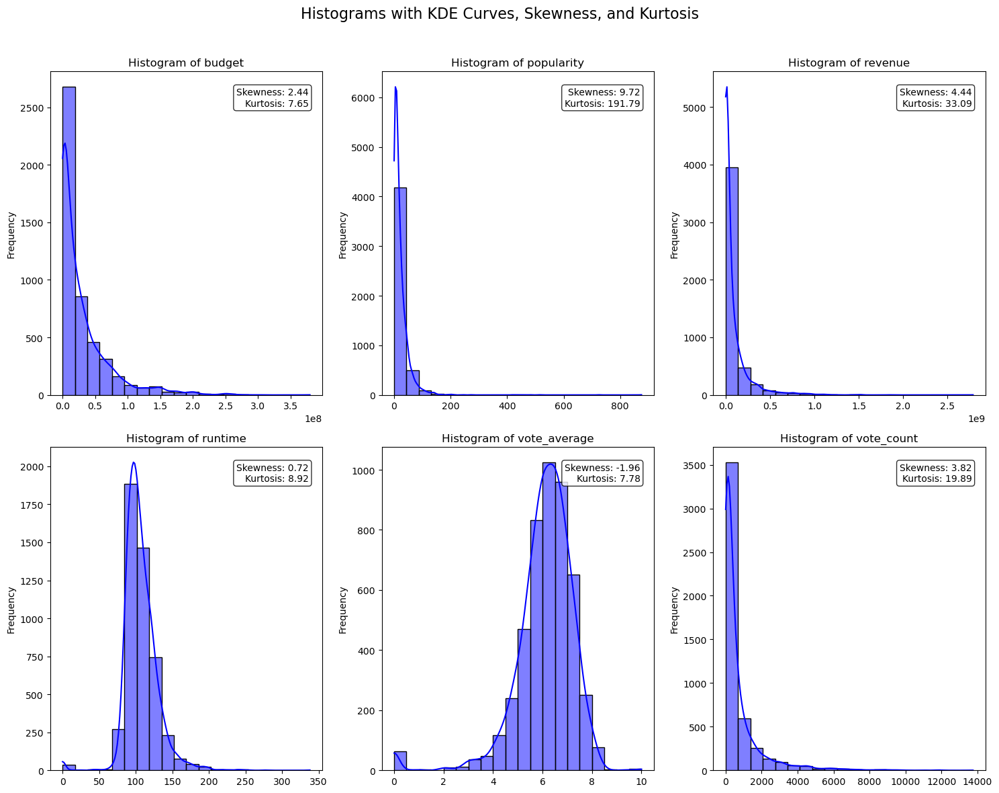

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

# Create a 2x3 grid of histograms with KDE curves and skewness/kurtosis overlay
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
fig.suptitle("Histograms with KDE Curves, Skewness, and Kurtosis", fontsize=16)

# Loop through the numeric columns and create a histogram for each
for ax, col in zip(axes.flatten(), numeric_cols):
    # Calculate skewness and kurtosis
    col_skewness = skew(merged_df[col].dropna())
    col_kurtosis = kurtosis(merged_df[col].dropna())

    # Create histogram with KDE overlay
    sns.histplot(data=merged_df, x=col, bins=20, kde=True, color="blue", edgecolor="black", ax=ax)
    ax.set_title(f"Histogram of {col}", fontsize=12)
    ax.set_xlabel("")
    ax.set_ylabel("Frequency")

    # Overlay skewness and kurtosis as text
    ax.text(0.95, 0.95, f"Skewness: {col_skewness:.2f}\nKurtosis: {col_kurtosis:.2f}",
            transform=ax.transAxes, fontsize=10, ha='right', va='top', bbox=dict(boxstyle="round", facecolor="white", alpha=0.8))

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


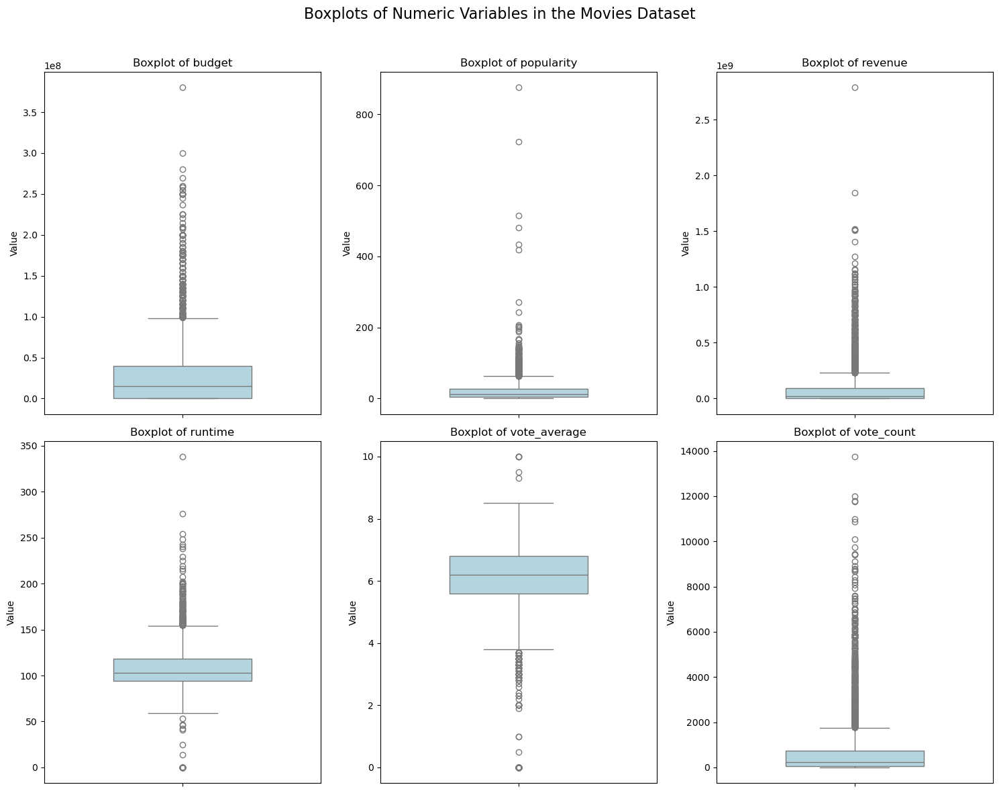

In [131]:
#boxplots for numeric fields

fig, axes = plt.subplots(2, 3, figsize=(15, 12))
fig.suptitle("Boxplots of Numeric Variables in the Movies Dataset", fontsize=16)

# Loop through numeric columns and create boxplots
for ax, col in zip(axes.flatten(), numeric_cols):
    sns.boxplot(data=merged_df, y=col, ax=ax, color="lightblue", width=0.5)
    ax.set_title(f"Boxplot of {col}", fontsize=12)
    ax.set_xlabel("")
    ax.set_ylabel("Value")

# Remove unused subplots if the number of columns is less than 9
for ax in axes.flatten()[len(numeric_cols):]:
    ax.axis("off")

# Adjust layout for clarity
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


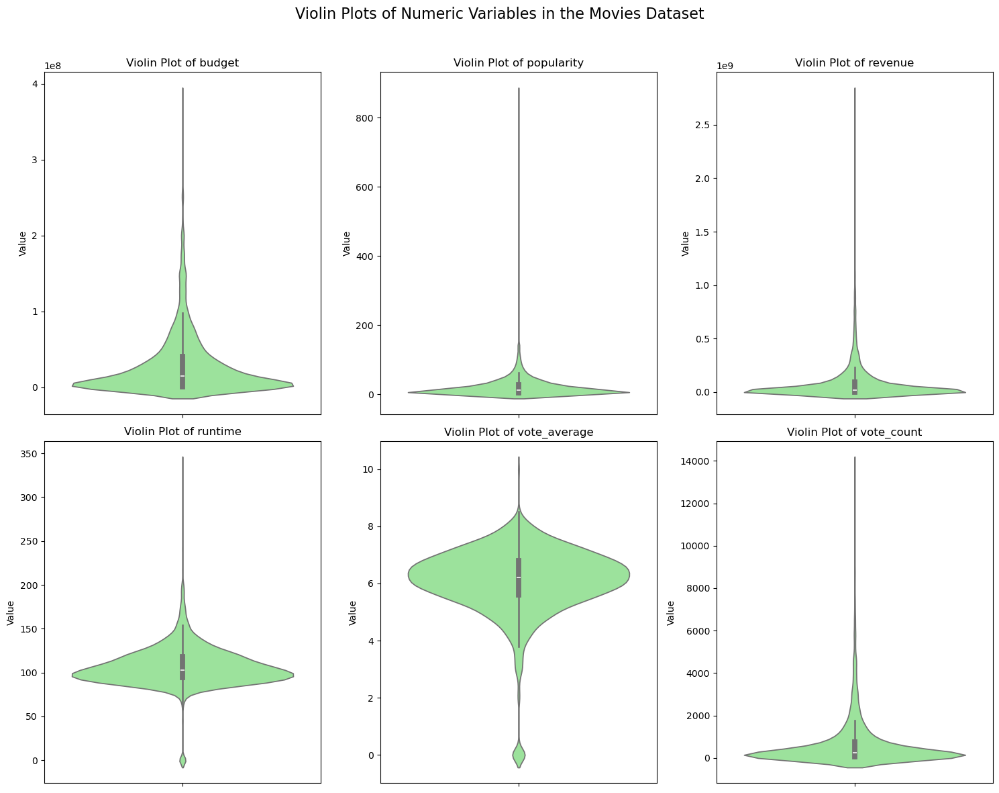

In [132]:
#violin plots

fig, axes = plt.subplots(2, 3, figsize=(15, 12))
fig.suptitle("Violin Plots of Numeric Variables in the Movies Dataset", fontsize=16)
# Loop through numeric columns and create violin plots
for ax, col in zip(axes.flatten(), numeric_cols):    
    sns.violinplot(data=merged_df, y=col, ax=ax, color="lightgreen")
    ax.set_title(f"Violin Plot of {col}", fontsize=12)
    ax.set_xlabel("")
    ax.set_ylabel("Value")
# Remove unused subplots if the number of columns is less than 9
for ax in axes.flatten()[len(numeric_cols):]:
    ax.axis("off")
# Adjust layout for clarity
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### Categorical Visualizations

Index(['genre_1', 'genre_2', 'genre_3', 'production_company_1',
       'production_company_2', 'production_company_3', 'production_country_1',
       'production_country_2', 'production_country_3'],
      dtype='object')


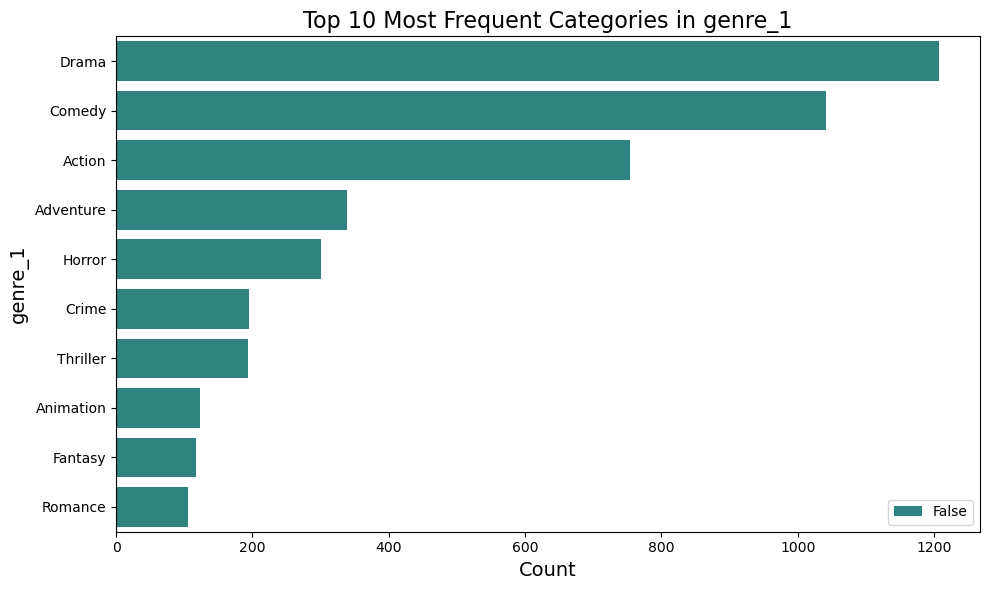

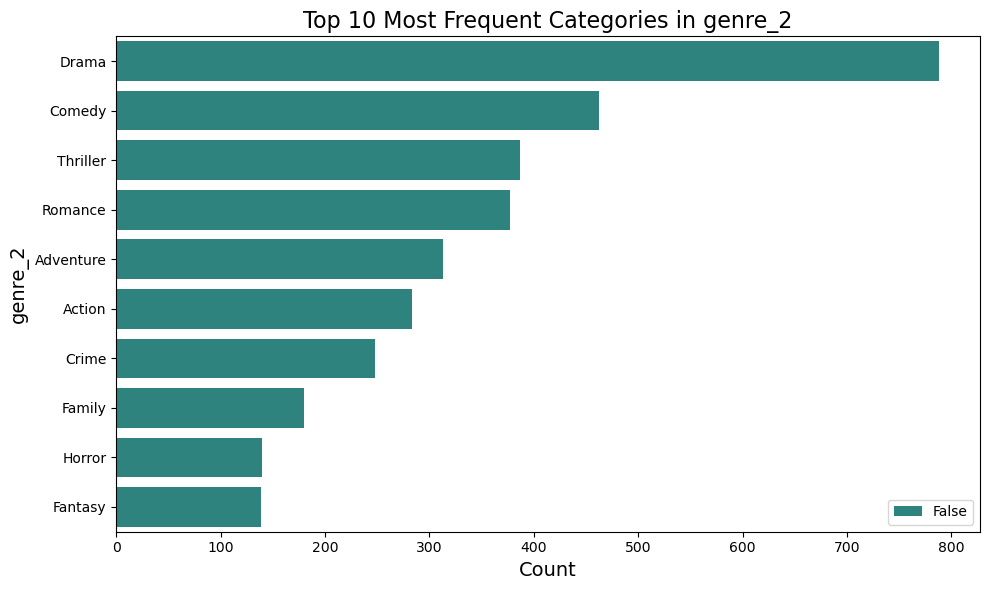

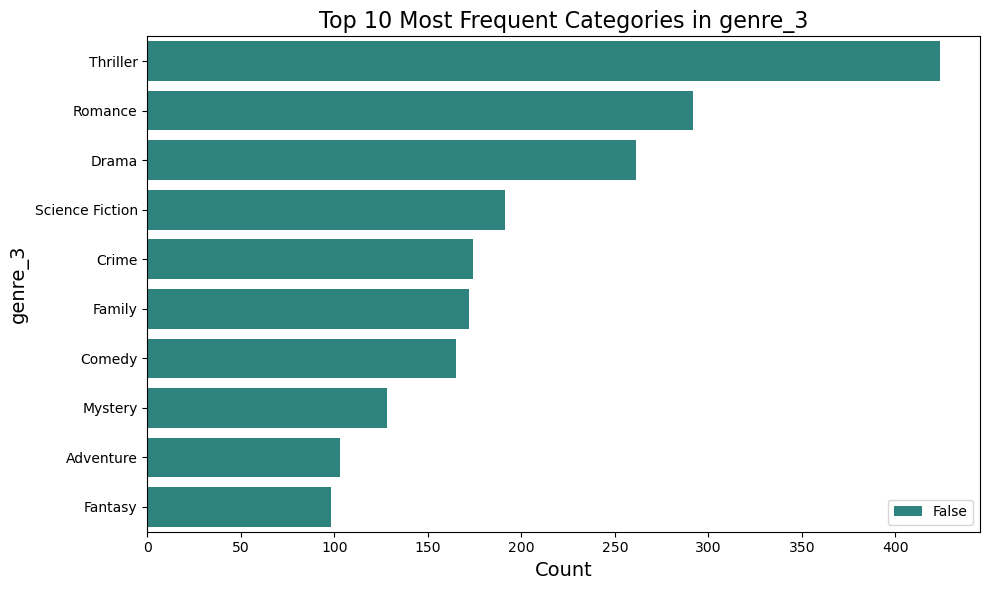

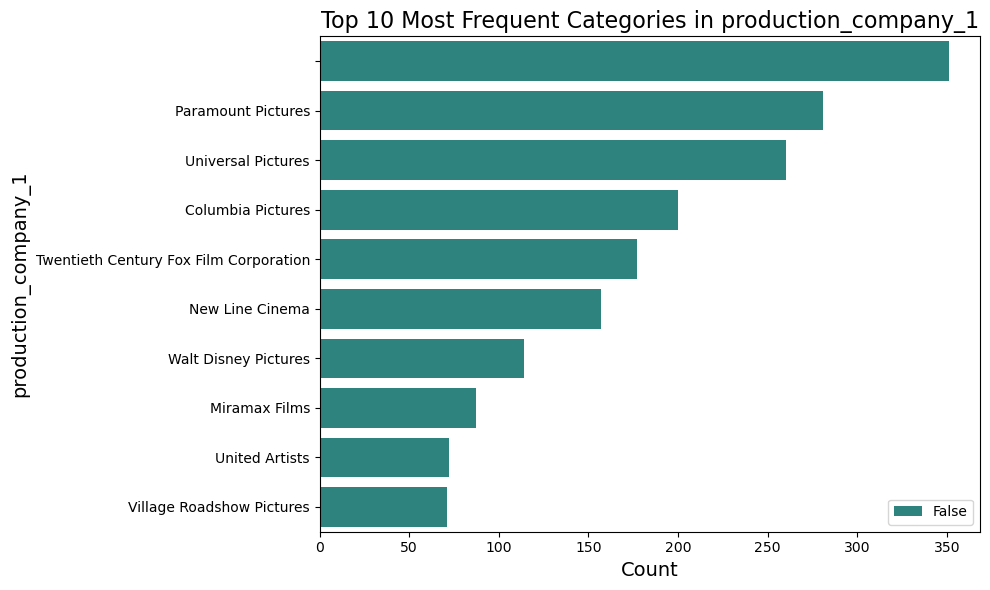

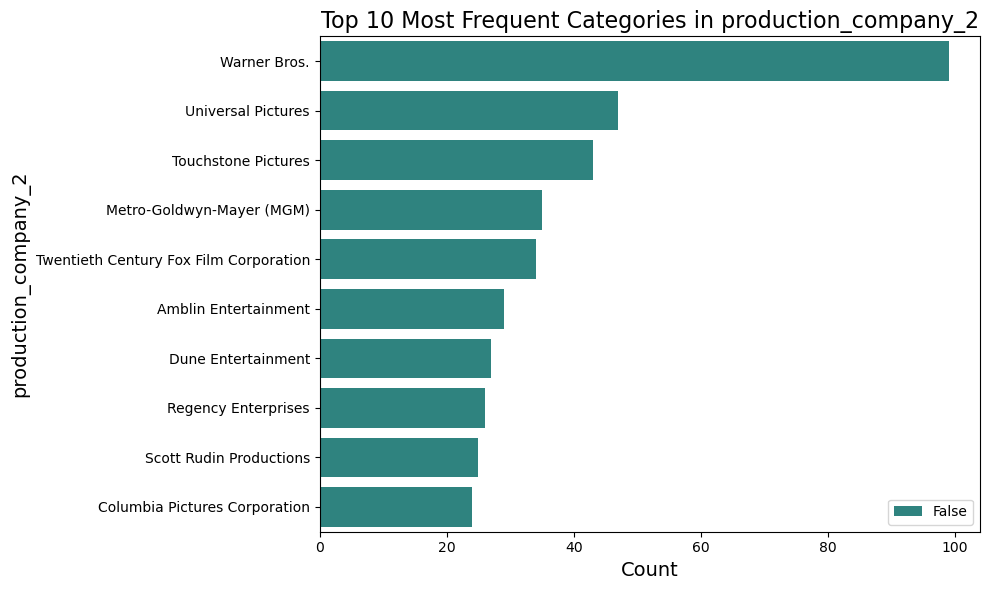

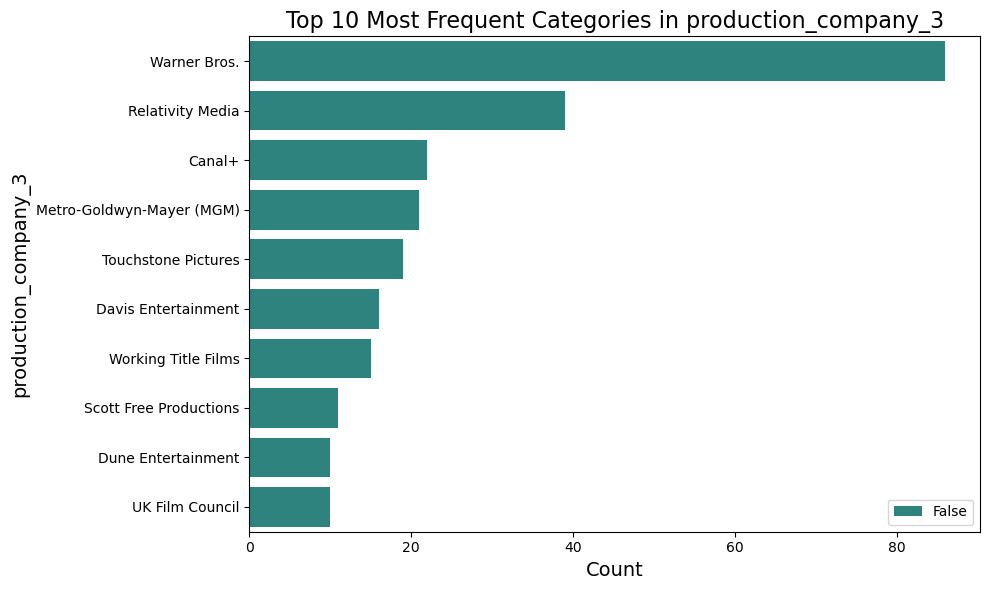

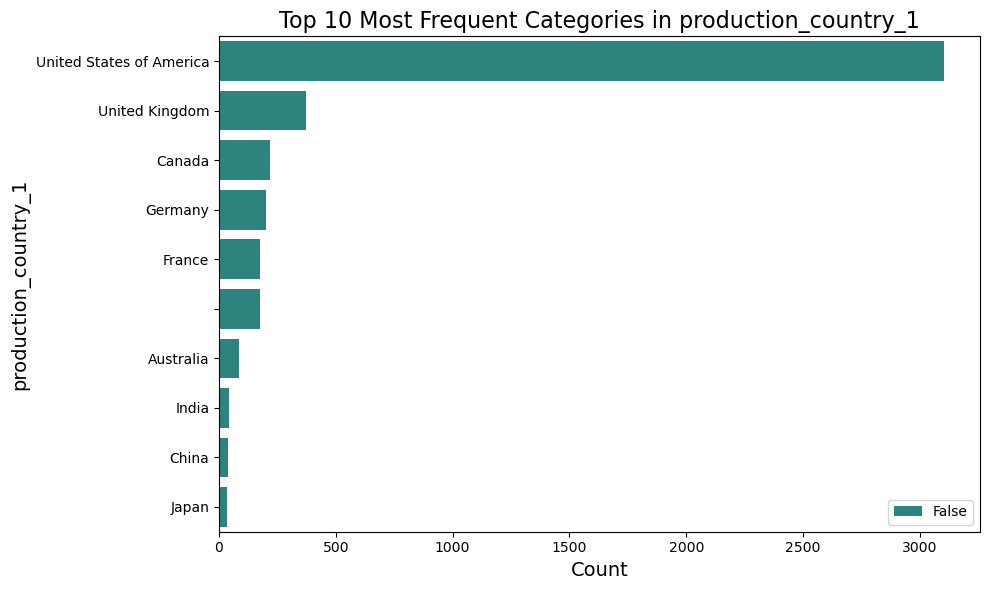

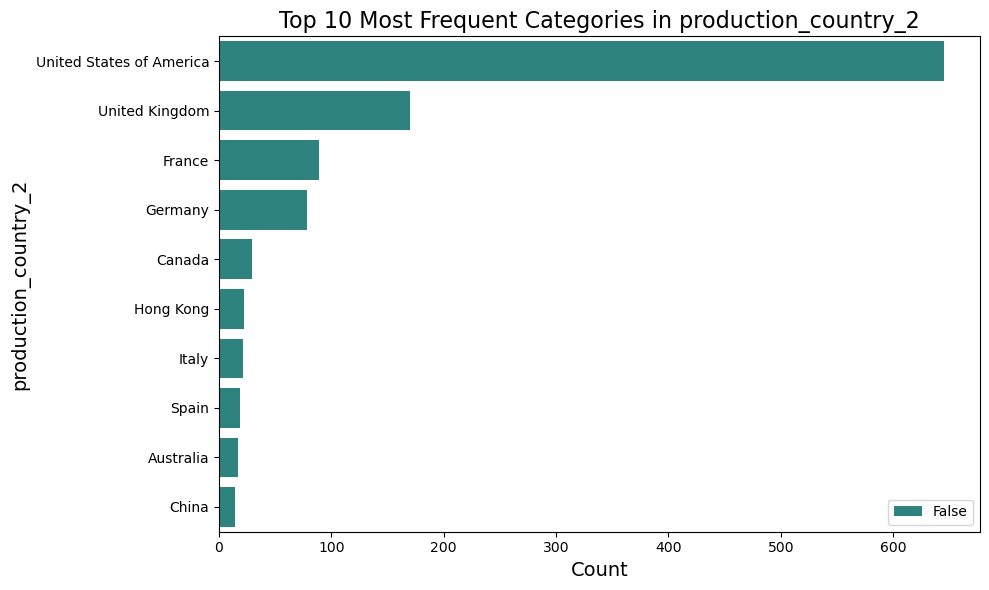

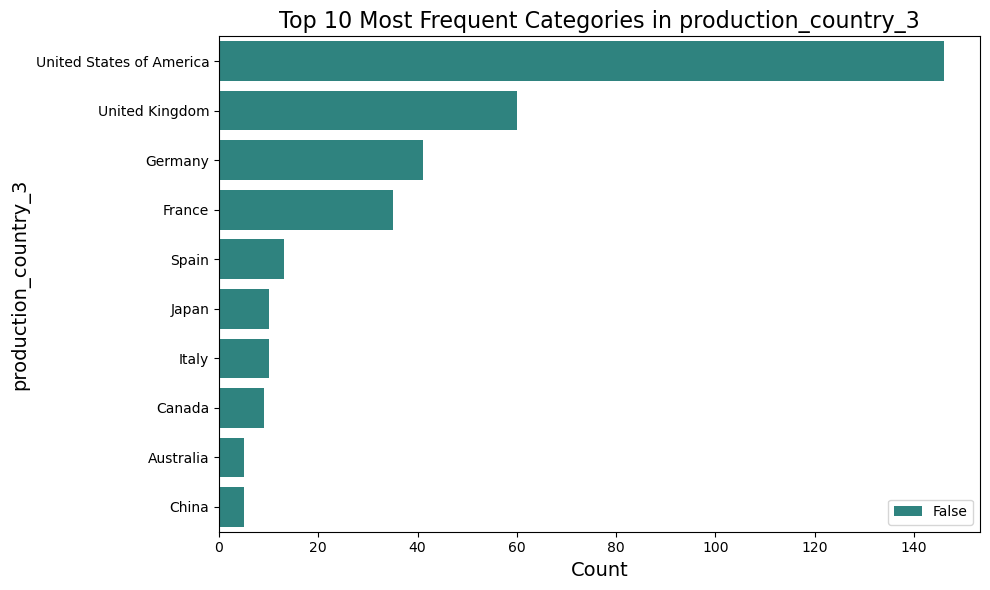

In [133]:
# bar charts

categorical_cols = merged_df.select_dtypes(include=('object')).columns
categorical_cols = categorical_cols.drop(['original_title', 'title', 'overview', 'tagline', 'homepage', 'status', 'original_language', 'director', 'actor_1', 'actor_2', 'actor_3', 'actor_4', 'actor_5'])  # Exclude text-heavy columns
categorical_cols = categorical_cols.drop(['language_1', 'language_2', 'language_3']) #exlcuding language since some symbols dont show properly
print(categorical_cols)

for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=merged_df, y=col, order=merged_df[col].value_counts().index[:10], palette="viridis", hue=False)
    plt.title(f"Top 10 Most Frequent Categories in {col}", fontsize=16)
    plt.xlabel("Count", fontsize=14)
    plt.ylabel(col, fontsize=14)
    plt.tight_layout()
    plt.show()


TODO LIST

1. more/better univariate visualizations
2. bivariate visualizations
3. multivariate visualizations
4. outlier checking and handling
5. correlation checking and handling
6. feature engineering (maybe get # of actors or # of "popular" actors), "main" star 
7. do inflation stuff



REPORT CHECKLIST

› Business Objectives
› Initial Dataset Summary
› Exploratory Data Analysis
› Data Preparation
› Data Cleaning
› Feature Engineering
› Iterative Refinement
› Final Dataset Summary
› Next Steps
› Appendices

can write this after you get the data done 

### Missing Value Handling

In [134]:

### Missing value handling

# Checking for missing values

merged_df.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                4803 non-null   int64         
 1   homepage              1712 non-null   object        
 2   id                    4803 non-null   int64         
 3   original_language     4803 non-null   object        
 4   original_title        4803 non-null   object        
 5   overview              4800 non-null   object        
 6   popularity            4803 non-null   float64       
 7   release_date          4802 non-null   datetime64[ns]
 8   revenue               4803 non-null   int64         
 9   runtime               4801 non-null   float64       
 10  status                4803 non-null   object        
 11  tagline               3959 non-null   object        
 12  title                 4803 non-null   object        
 13  vote_average      

4803 total entries

columns with missing values:
- homepage: alot, probably not a useful feature
- overview: has 3 missing, also probably not useful
- release_date: has 1 missing, look into
- tagline: ~800 missing, column probably not useful
- director: 30 missing, look into
- actor columns: actor 2-5 have some missing look into
- genre 2 and 3: 1000+ missing values, probably should just keep 1 genre
- production_company and country 2-3: missing, also should probably just keep the main oe 
- language: 3000+ missing from 2 and 3 

In [135]:
# dropping not useful columns

merged_df = merged_df.drop(columns=['homepage', 'tagline', 'overview']) # will never be useful

merged_df = merged_df.drop(columns= ['language_2', 'language_3']) # too many missing values 

merged_df = merged_df.drop(columns=['production_company_2', 'production_company_3',
                                    'production_country_2', 'production_country_3']) # too many missing + probably not useful
# maybe turn into a "multiple studios?" column later (do this with languages too)

merged_df = merged_df.drop(columns=['genre_2', 'genre_3']) # figure this out later maybe

merged_df.head() #find out what the difference between original_language and language_1 is 

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,actor_1,actor_2,actor_3,actor_4,actor_5,genre_1,production_company_1,production_country_1,language_1
0,237000000,19995,en,Avatar,150.437577,2009-12-10,2787965087,162.0,Released,Avatar,...,James Cameron,Sam Worthington,Zoe Saldana,Sigourney Weaver,Stephen Lang,Michelle Rodriguez,Action,Ingenious Film Partners,United States of America,English
1,300000000,285,en,Pirates of the Caribbean: At World's End,139.082615,2007-05-19,961000000,169.0,Released,Pirates of the Caribbean: At World's End,...,Gore Verbinski,Johnny Depp,Orlando Bloom,Keira Knightley,Stellan Skarsgård,Chow Yun-fat,Adventure,Walt Disney Pictures,United States of America,English
2,245000000,206647,en,Spectre,107.376788,2015-10-26,880674609,148.0,Released,Spectre,...,Sam Mendes,Daniel Craig,Christoph Waltz,Léa Seydoux,Ralph Fiennes,Monica Bellucci,Action,Columbia Pictures,United Kingdom,Français
3,250000000,49026,en,The Dark Knight Rises,112.312950,2012-07-16,1084939099,165.0,Released,The Dark Knight Rises,...,Christopher Nolan,Christian Bale,Michael Caine,Gary Oldman,Anne Hathaway,Tom Hardy,Action,Legendary Pictures,United States of America,English
4,260000000,49529,en,John Carter,43.926995,2012-03-07,284139100,132.0,Released,John Carter,...,Andrew Stanton,Taylor Kitsch,Lynn Collins,Samantha Morton,Willem Dafoe,Thomas Haden Church,Action,Walt Disney Pictures,United States of America,English


In [136]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                4803 non-null   int64         
 1   id                    4803 non-null   int64         
 2   original_language     4803 non-null   object        
 3   original_title        4803 non-null   object        
 4   popularity            4803 non-null   float64       
 5   release_date          4802 non-null   datetime64[ns]
 6   revenue               4803 non-null   int64         
 7   runtime               4801 non-null   float64       
 8   status                4803 non-null   object        
 9   title                 4803 non-null   object        
 10  vote_average          4803 non-null   float64       
 11  vote_count            4803 non-null   int64         
 12  director              4773 non-null   object        
 13  actor_1           

#### Look into Columns with missings

In [137]:
no_release_date = merged_df[merged_df['release_date'].isnull()]

no_release_date

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,actor_1,actor_2,actor_3,actor_4,actor_5,genre_1,production_company_1,production_country_1,language_1
4553,0,380097,en,America Is Still the Place,0.0,NaT,0,0.0,Released,America Is Still the Place,...,None,,None,None,None,None,,,,


After looking online I could not find a single movie with this name or anything so it is being removed.

In [138]:
merged_df = merged_df.dropna(subset=['release_date'])

merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4802 entries, 0 to 4802
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                4802 non-null   int64         
 1   id                    4802 non-null   int64         
 2   original_language     4802 non-null   object        
 3   original_title        4802 non-null   object        
 4   popularity            4802 non-null   float64       
 5   release_date          4802 non-null   datetime64[ns]
 6   revenue               4802 non-null   int64         
 7   runtime               4800 non-null   float64       
 8   status                4802 non-null   object        
 9   title                 4802 non-null   object        
 10  vote_average          4802 non-null   float64       
 11  vote_count            4802 non-null   int64         
 12  director              4773 non-null   object        
 13  actor_1               4

In [139]:
# checking for those with no missing runtime

no_runtime = merged_df[merged_df['runtime'].isnull()]

no_runtime

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,actor_1,actor_2,actor_3,actor_4,actor_5,genre_1,production_company_1,production_country_1,language_1
2656,15000000,370980,it,Chiamatemi Francesco - Il Papa della gente,0.738646,2015-12-03,0,NaN,Released,Chiamatemi Francesco - Il Papa della gente,...,Daniele Luchetti,Rodrigo de la Serna,Sergio Hernández,Àlex Brendemühl,Maximilian Dirr,Mercedes Morán,Drama,Taodue Film,Italy,Español
4140,2,459488,en,"To Be Frank, Sinatra at 100",0.050625,2015-12-12,0,NaN,Released,"To Be Frank, Sinatra at 100",...,Simon Napier-Bell,Tony Oppedisano,None,None,None,None,Documentary,Eyeline Entertainment,United Kingdom,


Both of these movies exist and have runtimes. They both seem to also have issues in the revenue and budget columns, 
as well as 'To be Frank...' missing its actors 2 through 5.

For now they will be flagged; if other issues with them can be fixed then I will manually add their runtime back, but further investigation
is needed as of now

In [140]:
# check for no director

no_director = merged_df[merged_df['director'].isnull()]
no_director

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,actor_1,actor_2,actor_3,actor_4,actor_5,genre_1,production_company_1,production_country_1,language_1
3661,0,19615,en,Flying By,1.546169,2009-01-01,0,95.0,Released,Flying By,...,None,Billy Ray Cyrus,Heather Locklear,Ahnaise Christmas,Arabella Field,Mo Collins,Drama,,,English
3670,0,447027,en,Running Forever,0.028756,2015-10-27,0,88.0,Released,Running Forever,...,None,,None,None,None,None,Family,New Kingdom Pictures,United States of America,
3729,3250000,26379,en,Paa,2.126139,2009-12-04,0,133.0,Released,Paa,...,None,Amitabh Bachchan,Abhishek Bachchan,Vidya Balan,Paresh Rawal,Arundathi Nag,Drama,A B Corp,India,हिन्दी
3977,0,55831,en,Boynton Beach Club,0.188870,2005-08-05,0,105.0,Released,Boynton Beach Club,...,None,Brenda Vaccaro,Dyan Cannon,Joseph Bologna,None,None,Comedy,,,English
4068,0,371085,en,Sharkskin,0.027801,2015-01-01,0,0.0,Released,Sharkskin,...,None,,None,None,None,None,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4644,0,325123,en,Teeth and Blood,0.055325,2015-03-10,0,96.0,Released,Teeth and Blood,...,None,Glenn Plummer,Michelle Van Der Water,Danielle Vega,Greg Eagles,None,Horror,,,English
4657,0,320435,en,UnDivided,0.010607,2013-02-01,0,0.0,Released,UnDivided,...,None,,None,None,None,None,,,,
4662,0,40963,en,Little Big Top,0.092100,2006-01-01,0,0.0,Rumored,Little Big Top,...,None,Sid Haig,Richard Riehle,Mel England,Jacob Zachar,Travis Betz,Comedy,Fly High Films,United States of America,English
4674,0,194588,en,Short Cut to Nirvana: Kumbh Mela,0.004998,2004-05-11,0,85.0,Released,Short Cut to Nirvana: Kumbh Mela,...,None,,None,None,None,None,,,,


A lot of these movies seem to also have issues in other columns. I am going to compare them to the original crew and cast text found in the json format to see what was happening there.

In [141]:
no_director_ids = no_director['id'].tolist()


temp = credits_raw_df[credits_raw_df['movie_id'].isin(no_director_ids)]

temp

,movie_id,title,cast,crew
3661,19615,Flying By,"[{""cast_id"": 1, ""character"": ""George"", ""credit...",[]
3670,447027,Running Forever,[],[]
3729,26379,Paa,"[{""cast_id"": 1, ""character"": ""Auro"", ""credit_i...","[{""credit_id"": ""52fe44fec3a368484e042a29"", ""de..."
3977,55831,Boynton Beach Club,"[{""cast_id"": 1, ""character"": ""Marilyn"", ""credi...",[]
4068,371085,Sharkskin,[],[]
...,...,...,...,...
4644,325123,Teeth and Blood,"[{""cast_id"": 0, ""character"": ""Vincent Augustin...",[]
4657,320435,UnDivided,[],[]
4662,40963,Little Big Top,"[{""cast_id"": 0, ""character"": ""Seymour"", ""credi...",[]
4674,194588,Short Cut to Nirvana: Kumbh Mela,[],[]


A lot of these movies seem to have entirely missing crew and cast information. These movies make up less than 0.5% of the total movies in the dataset and I am choosing to simply remove them from the dataset as manually adding their information would be tedious. 

In [142]:
# dropping no directors

merged_df = merged_df.dropna(subset=['director'])

merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4773 entries, 0 to 4802
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                4773 non-null   int64         
 1   id                    4773 non-null   int64         
 2   original_language     4773 non-null   object        
 3   original_title        4773 non-null   object        
 4   popularity            4773 non-null   float64       
 5   release_date          4773 non-null   datetime64[ns]
 6   revenue               4773 non-null   int64         
 7   runtime               4771 non-null   float64       
 8   status                4773 non-null   object        
 9   title                 4773 non-null   object        
 10  vote_average          4773 non-null   float64       
 11  vote_count            4773 non-null   int64         
 12  director              4773 non-null   object        
 13  actor_1               4

In [143]:
#checking missing actors
no_actor_2 = merged_df[merged_df['actor_2'].isnull()]
no_actor_2

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,actor_1,actor_2,actor_3,actor_4,actor_5,genre_1,production_company_1,production_country_1,language_1
2601,0,17644,en,Barney's Great Adventure,0.722911,1998-01-01,0,76.0,Released,Barney's Great Adventure,...,Steve Gomer,,None,None,None,None,Family,PolyGram Filmed Entertainment,United States of America,English
3224,9000000,152747,en,All Is Lost,28.540614,2013-10-18,6108720,106.0,Released,All Is Lost,...,J.C. Chandor,Robert Redford,None,None,None,None,Action,Sudden Storm Productions,United States of America,English
3768,0,19153,en,The Real Cancun,0.456485,2003-04-23,0,96.0,Released,The Real Cancun,...,Rick de Oliveira,Laura Ramsey,None,None,None,None,Documentary,,United States of America,English
3897,3000000,20337,en,Martin Lawrence Live: Runteldat,0.295226,2002-08-01,19184015,113.0,Released,Martin Lawrence Live: Runteldat,...,Martin Lawrence,Martin Lawrence,None,None,None,None,Comedy,,United States of America,English
3992,0,346081,en,Sardaarji,0.296981,2015-06-26,0,0.0,Released,Sardaarji,...,Rohit Jugraj,,None,None,None,None,,,India,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4737,0,64973,en,"Peace, Propaganda & the Promised Land",0.020168,2005-01-28,0,80.0,Released,"Peace, Propaganda & the Promised Land",...,Sut Jhally,,None,None,None,None,Documentary,,United States of America,English
4755,50000,322745,en,Counting,0.293587,2015-02-09,0,111.0,Released,Counting,...,Jem Cohen,,None,None,None,None,Documentary,,United States of America,English
4757,0,174362,en,Bending Steel,0.048726,2013-04-20,0,93.0,Released,Bending Steel,...,Dave Carroll,,None,None,None,None,Documentary,,,English
4782,0,17345,en,Flywheel,1.048524,2003-01-01,0,120.0,Released,Flywheel,...,Alex Kendrick,Alex Kendrick,None,None,None,None,Drama,,United States of America,English


at least one of these movies (all is lost) is a movie with only 1 actor. I think the solution to this is to reconfigure how the actor columns work and then remove outliers from there.

In [144]:
merged_df.head()

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,actor_1,actor_2,actor_3,actor_4,actor_5,genre_1,production_company_1,production_country_1,language_1
0,237000000,19995,en,Avatar,150.437577,2009-12-10,2787965087,162.0,Released,Avatar,...,James Cameron,Sam Worthington,Zoe Saldana,Sigourney Weaver,Stephen Lang,Michelle Rodriguez,Action,Ingenious Film Partners,United States of America,English
1,300000000,285,en,Pirates of the Caribbean: At World's End,139.082615,2007-05-19,961000000,169.0,Released,Pirates of the Caribbean: At World's End,...,Gore Verbinski,Johnny Depp,Orlando Bloom,Keira Knightley,Stellan Skarsgård,Chow Yun-fat,Adventure,Walt Disney Pictures,United States of America,English
2,245000000,206647,en,Spectre,107.376788,2015-10-26,880674609,148.0,Released,Spectre,...,Sam Mendes,Daniel Craig,Christoph Waltz,Léa Seydoux,Ralph Fiennes,Monica Bellucci,Action,Columbia Pictures,United Kingdom,Français
3,250000000,49026,en,The Dark Knight Rises,112.312950,2012-07-16,1084939099,165.0,Released,The Dark Knight Rises,...,Christopher Nolan,Christian Bale,Michael Caine,Gary Oldman,Anne Hathaway,Tom Hardy,Action,Legendary Pictures,United States of America,English
4,260000000,49529,en,John Carter,43.926995,2012-03-07,284139100,132.0,Released,John Carter,...,Andrew Stanton,Taylor Kitsch,Lynn Collins,Samantha Morton,Willem Dafoe,Thomas Haden Church,Action,Walt Disney Pictures,United States of America,English


## Reconsidering the Actor Features

In [145]:
# make dataframe of each actor and their total appearances and appearances as a top 3 actor
credits_raw_df.head()

actor_df = pd.DataFrame()

actor_list = []
appearance_list = []
top_3_appearance_list = []

for index, row in credits_raw_df.iterrows():
    cast_data = json.loads(row['cast'])
    for i, actor in enumerate(cast_data):
        actor_name = actor['name']
        if actor_name not in actor_list:
            actor_list.append(actor_name)
            appearance_list.append(1)
            top_3_appearance_list.append(1 if i < 3 else 0)
        else:
            idx = actor_list.index(actor_name)
            appearance_list[idx] += 1
            if i < 3:
                top_3_appearance_list[idx] += 1

actor_df['actor_name'] = actor_list
actor_df['total_appearances'] = appearance_list
actor_df['top_3_appearances'] = top_3_appearance_list

actor_df = actor_df.sort_values(by='total_appearances', ascending=False).reset_index(drop=True)
actor_df.head(10)

,actor_name,total_appearances,top_3_appearances
0,Samuel L. Jackson,67,35
1,Robert De Niro,57,46
2,Bruce Willis,51,35
3,Matt Damon,48,35
4,Morgan Freeman,46,29
5,Steve Buscemi,43,13
6,Liam Neeson,41,24
7,Johnny Depp,40,32
8,Owen Wilson,40,26
9,Alec Baldwin,39,22


In [146]:
actor_df.describe()

,total_appearances,top_3_appearances
count,54201.000000,54201.000000
mean,1.960425,0.262910
std,2.843553,1.421134
min,1.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,0.000000
75%,2.000000,0.000000
max,67.000000,46.000000


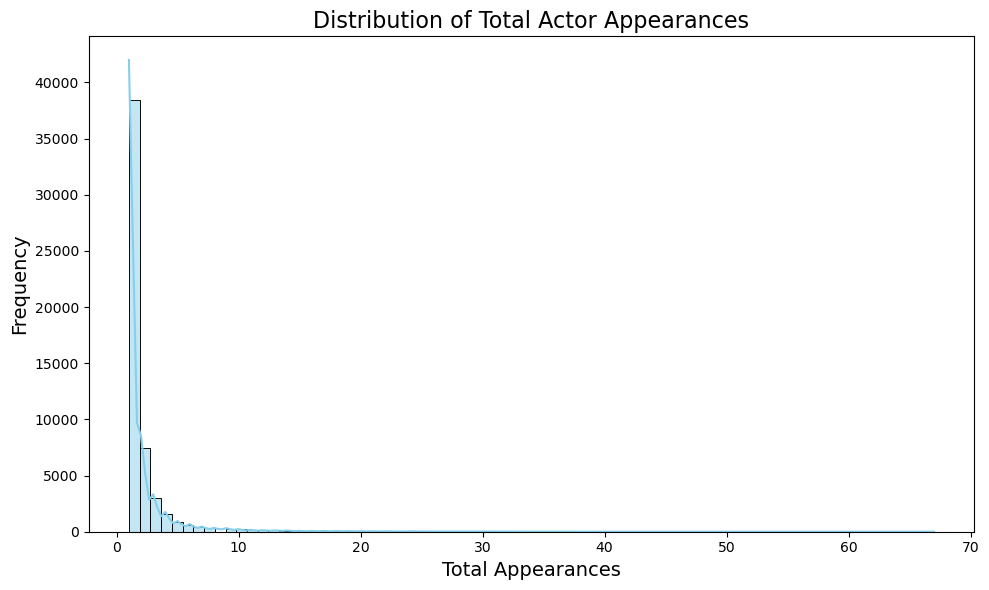

In [147]:
#visualize the distriubtion

plt.figure(figsize=(10, 6))
sns.histplot(actor_df['total_appearances'], bins=75, kde=True, color='skyblue')
plt.title('Distribution of Total Actor Appearances', fontsize=16)
plt.xlabel('Total Appearances', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.tight_layout()
plt.show()

In [148]:
popular_actors = actor_df[actor_df['total_appearances'] >= 20]

popular_actors

,actor_name,total_appearances,top_3_appearances
0,Samuel L. Jackson,67,35
1,Robert De Niro,57,46
2,Bruce Willis,51,35
3,Matt Damon,48,35
4,Morgan Freeman,46,29
...,...,...,...
322,Steve Martin,20,16
323,Bill Pullman,20,10
324,Jeff Goldblum,20,9
325,Dennis Hopper,20,9


New features for movie: 
- Count total actors
- Count Popular actors
- Lead Actor
- Lead Actor is popular ? 

In [149]:
# getting new actor features

copy_credits = credits_raw_df.copy()

for _ in copy_credits.index:
    count_actors = 0
    actors_list = []
    temp_dict = json.loads(copy_credits['cast'][_])
    for actor in temp_dict:
        actors_list.append(actor['name'])
        count_actors += 1
    copy_credits.at[_, 'num_actors'] = count_actors
    copy_credits.at[_, 'all_actors'] = ', '.join(actors_list)
copy_credits = copy_credits[['movie_id', 'num_actors', 'all_actors']]

copy_credits['lead_actor'] = copy_credits['all_actors'].str.split(', ').str[0]
copy_credits['num_famous_actors'] = copy_credits['all_actors'].apply(
    lambda x: sum(1 for actor in x.split(', ') if actor in popular_actors['actor_name'].values)
)
copy_credits['famous_lead'] = copy_credits['lead_actor'].apply(
    lambda x: x in popular_actors['actor_name'].values
)

copy_credits.drop(columns=['all_actors'], inplace=True)

copy_credits.head()

,movie_id,num_actors,lead_actor,num_famous_actors,famous_lead
0,19995,83.0,Sam Worthington,3,False
1,285,34.0,Johnny Depp,4,True
2,206647,83.0,Daniel Craig,3,True
3,49026,158.0,Christian Bale,7,True
4,49529,27.0,Taylor Kitsch,4,False


### Integrating New Features

In [150]:
merged_new_df = merged_df.copy()

merged_new_df = merged_new_df.merge(copy_credits, left_on='id', right_on='movie_id', how='left')
merged_new_df = merged_new_df.drop(columns=['movie_id', 'actor_1', 'actor_2', 'actor_3', 'actor_4', 'actor_5'])
merged_new_df.head()

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,vote_count,director,genre_1,production_company_1,production_country_1,language_1,num_actors,lead_actor,num_famous_actors,famous_lead
0,237000000,19995,en,Avatar,150.437577,2009-12-10,2787965087,162.0,Released,Avatar,...,11800,James Cameron,Action,Ingenious Film Partners,United States of America,English,83.0,Sam Worthington,3,False
1,300000000,285,en,Pirates of the Caribbean: At World's End,139.082615,2007-05-19,961000000,169.0,Released,Pirates of the Caribbean: At World's End,...,4500,Gore Verbinski,Adventure,Walt Disney Pictures,United States of America,English,34.0,Johnny Depp,4,True
2,245000000,206647,en,Spectre,107.376788,2015-10-26,880674609,148.0,Released,Spectre,...,4466,Sam Mendes,Action,Columbia Pictures,United Kingdom,Français,83.0,Daniel Craig,3,True
3,250000000,49026,en,The Dark Knight Rises,112.312950,2012-07-16,1084939099,165.0,Released,The Dark Knight Rises,...,9106,Christopher Nolan,Action,Legendary Pictures,United States of America,English,158.0,Christian Bale,7,True
4,260000000,49529,en,John Carter,43.926995,2012-03-07,284139100,132.0,Released,John Carter,...,2124,Andrew Stanton,Action,Walt Disney Pictures,United States of America,English,27.0,Taylor Kitsch,4,False


In [151]:
merged_new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4773 entries, 0 to 4772
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   budget                4773 non-null   int64         
 1   id                    4773 non-null   int64         
 2   original_language     4773 non-null   object        
 3   original_title        4773 non-null   object        
 4   popularity            4773 non-null   float64       
 5   release_date          4773 non-null   datetime64[ns]
 6   revenue               4773 non-null   int64         
 7   runtime               4771 non-null   float64       
 8   status                4773 non-null   object        
 9   title                 4773 non-null   object        
 10  vote_average          4773 non-null   float64       
 11  vote_count            4773 non-null   int64         
 12  director              4773 non-null   object        
 13  genre_1           

### Fixing production companies and countries

In [152]:

### Fixing production companies and countries

prod_features = pd.DataFrame()

for _ in movies_raw_df.index:
    prod_features.at[_, 'movie_id'] = movies_raw_df['id'][_]
    temp_dict = json.loads(movies_raw_df['production_companies'][_])
    comp_list = list(itertools.islice((d['name'] for d in temp_dict), 3))
    prod_features.at[_, 'production_company_main'] = comp_list[0] if len(comp_list) > 0 else np.nan
    if len(comp_list) > 1:
        prod_features.at[_, 'multiple_production_companies'] = True
    else:
        prod_features.at[_, 'multiple_production_companies'] = False
    temp_dict = json.loads(movies_raw_df['production_countries'][_])
    country_list = list(itertools.islice((d['name'] for d in temp_dict), 3))
    prod_features.at[_, 'production_country_main'] = country_list[0] if len(country_list) > 0 else np.nan
    if len(country_list) > 1:
        prod_features.at[_, 'multiple_production_countries'] = True
    else:
        prod_features.at[_, 'multiple_production_countries'] = False

prod_features.head()


,movie_id,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
0,19995.0,Ingenious Film Partners,True,United States of America,True
1,285.0,Walt Disney Pictures,True,United States of America,False
2,206647.0,Columbia Pictures,True,United Kingdom,True
3,49026.0,Legendary Pictures,True,United States of America,False
4,49529.0,Walt Disney Pictures,False,United States of America,False


In [153]:
# merging new production features

merged_new_df = merged_new_df.merge(prod_features, left_on='id', right_on='movie_id', how='left')
merged_new_df = merged_new_df.drop(columns=['movie_id', 'production_company_1', 'production_country_1'])


In [154]:
merged_new_df = merged_new_df.drop(columns=['language_1'])
merged_new_df.head()

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
0,237000000,19995,en,Avatar,150.437577,2009-12-10,2787965087,162.0,Released,Avatar,...,James Cameron,Action,83.0,Sam Worthington,3,False,Ingenious Film Partners,True,United States of America,True
1,300000000,285,en,Pirates of the Caribbean: At World's End,139.082615,2007-05-19,961000000,169.0,Released,Pirates of the Caribbean: At World's End,...,Gore Verbinski,Adventure,34.0,Johnny Depp,4,True,Walt Disney Pictures,True,United States of America,False
2,245000000,206647,en,Spectre,107.376788,2015-10-26,880674609,148.0,Released,Spectre,...,Sam Mendes,Action,83.0,Daniel Craig,3,True,Columbia Pictures,True,United Kingdom,True
3,250000000,49026,en,The Dark Knight Rises,112.312950,2012-07-16,1084939099,165.0,Released,The Dark Knight Rises,...,Christopher Nolan,Action,158.0,Christian Bale,7,True,Legendary Pictures,True,United States of America,False
4,260000000,49529,en,John Carter,43.926995,2012-03-07,284139100,132.0,Released,John Carter,...,Andrew Stanton,Action,27.0,Taylor Kitsch,4,False,Walt Disney Pictures,False,United States of America,False


In [155]:
merged_new_df.info() #updated columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4773 entries, 0 to 4772
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   budget                         4773 non-null   int64         
 1   id                             4773 non-null   int64         
 2   original_language              4773 non-null   object        
 3   original_title                 4773 non-null   object        
 4   popularity                     4773 non-null   float64       
 5   release_date                   4773 non-null   datetime64[ns]
 6   revenue                        4773 non-null   int64         
 7   runtime                        4771 non-null   float64       
 8   status                         4773 non-null   object        
 9   title                          4773 non-null   object        
 10  vote_average                   4773 non-null   float64       
 11  vote_count       

In [156]:
no_prod_comapny = merged_new_df[merged_new_df['production_company_main'].isnull()]
no_prod_comapny

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
1011,0,53953,de,The Tooth Fairy,0.716764,2006-08-08,0,0.0,Released,The Tooth Fairy,...,Chuck Bowman,Horror,15.0,Lochlyn Munro,0,False,NaN,False,NaN,False
1360,0,45054,en,There Be Dragons,6.668679,2011-03-25,0,112.0,Released,There Be Dragons,...,Roland Joffé,Drama,14.0,Charlie Cox,1,False,NaN,False,NaN,False
1669,0,2008,zh,Wu Ji,3.866026,2005-12-15,0,98.0,Released,The Promise,...,Chen Kaige,Fantasy,6.0,Cecilia Cheung,0,False,NaN,False,China,True
1754,27000000,10188,en,The Sisterhood of the Traveling Pants 2,11.870301,2008-08-06,44352417,117.0,Released,The Sisterhood of the Traveling Pants 2,...,Sanaa Hamri,Adventure,25.0,Alexis Bledel,0,False,NaN,False,United States of America,False
1898,26000000,18147,en,Unaccompanied Minors,10.006282,2006-12-08,0,90.0,Released,Unaccompanied Minors,...,Paul Feig,Comedy,18.0,Lewis Black,2,False,NaN,False,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4756,0,44990,en,Breaking Upwards,0.674570,2009-03-14,0,88.0,Released,Breaking Upwards,...,Daryl Wein,Comedy,15.0,Zoe Lister-Jones,0,False,NaN,False,United States of America,False
4759,0,39851,en,Clean,1.464566,2004-09-01,0,111.0,Released,Clean,...,Olivier Assayas,Drama,10.0,Maggie Cheung,1,False,NaN,False,United Kingdom,True
4767,0,67238,en,Cavite,0.022173,2005-03-12,0,80.0,Released,Cavite,...,Neill Dela Llana,Foreign,0.0,,0,False,NaN,False,NaN,False
4769,9000,72766,en,Newlyweds,0.642552,2011-12-26,0,85.0,Released,Newlyweds,...,Edward Burns,Comedy,5.0,Edward Burns,0,False,NaN,False,NaN,False


Some are missing production companies still... will be investigated further

## Investigating Outliers

Columns I am suspicious of:
- budget
- revenue
- runtime
- num_actors

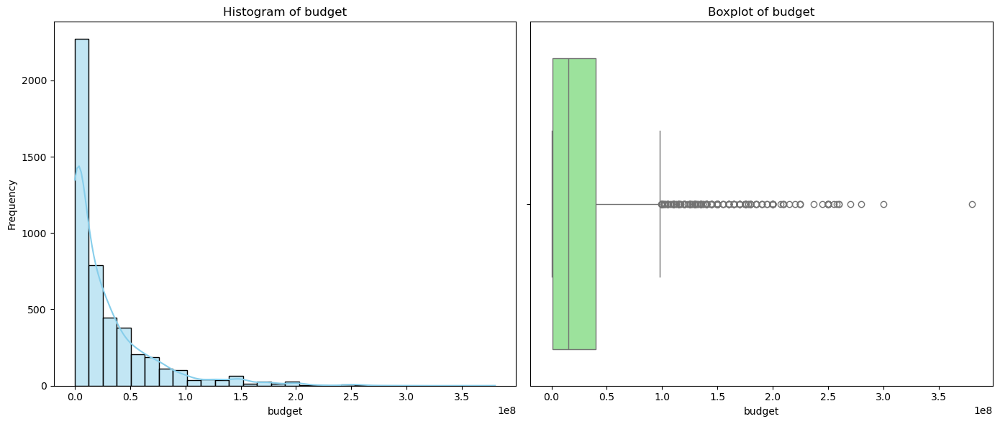

In [157]:

# visualizing for outliers

def outlier_check_display(variable, df):
    # Create a figure with two subplots: Histogram and Boxplot
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Histogram
    sns.histplot(df[variable], bins=30, kde=True, ax=axes[0], color='skyblue')
    axes[0].set_title(f'Histogram of {variable}')
    axes[0].set_xlabel(variable)
    axes[0].set_ylabel('Frequency')

    # Boxplot
    sns.boxplot(x=df[variable], ax=axes[1], color='lightgreen')
    axes[1].set_title(f'Boxplot of {variable}')
    axes[1].set_xlabel(variable)

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()

outlier_check_display('budget', merged_new_df)


In [158]:
from scipy.stats import zscore
# z score checking above and below

def z_score_outliers(variable, df, threshold=3): 
    opp_threshold = -threshold
    z_scores = zscore(df[variable].dropna())
    outliers_above = df[np.abs(z_scores) > threshold]
    outliers_below = df[z_scores < opp_threshold]
    outliers = pd.concat([outliers_above, outliers_below]).drop_duplicates()

    return outliers

outlier_budget = z_score_outliers('budget', merged_new_df)

outlier_budget


,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
0,237000000,19995,en,Avatar,150.437577,2009-12-10,2787965087,162.0,Released,Avatar,...,James Cameron,Action,83.0,Sam Worthington,3,False,Ingenious Film Partners,True,United States of America,True
1,300000000,285,en,Pirates of the Caribbean: At World's End,139.082615,2007-05-19,961000000,169.0,Released,Pirates of the Caribbean: At World's End,...,Gore Verbinski,Adventure,34.0,Johnny Depp,4,True,Walt Disney Pictures,True,United States of America,False
2,245000000,206647,en,Spectre,107.376788,2015-10-26,880674609,148.0,Released,Spectre,...,Sam Mendes,Action,83.0,Daniel Craig,3,True,Columbia Pictures,True,United Kingdom,True
3,250000000,49026,en,The Dark Knight Rises,112.312950,2012-07-16,1084939099,165.0,Released,The Dark Knight Rises,...,Christopher Nolan,Action,158.0,Christian Bale,7,True,Legendary Pictures,True,United States of America,False
4,260000000,49529,en,John Carter,43.926995,2012-03-07,284139100,132.0,Released,John Carter,...,Andrew Stanton,Action,27.0,Taylor Kitsch,4,False,Walt Disney Pictures,False,United States of America,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,155000000,1966,en,Alexander,39.019229,2004-11-21,167298192,175.0,Released,Alexander,...,Oliver Stone,War,51.0,Colin Farrell,6,True,France 3 Cinéma,True,France,True
126,170000000,76338,en,Thor: The Dark World,99.499595,2013-10-29,644571402,112.0,Released,Thor: The Dark World,...,Alan Taylor,Action,43.0,Chris Hemsworth,6,False,Marvel Studios,False,United States of America,False
145,175000000,652,en,Troy,66.803149,2004-05-13,497409852,163.0,Released,Troy,...,Wolfgang Petersen,Adventure,20.0,Brad Pitt,5,True,Plan B Entertainment,True,United States of America,True
208,160000000,1911,en,The 13th Warrior,27.220157,1999-08-27,61698899,102.0,Released,The 13th Warrior,...,John McTiernan,Adventure,19.0,Antonio Banderas,1,True,Touchstone Pictures,False,United States of America,False


All of these movies are outliers in terms of budget but thats just becasue they had an extremely high budget, they are not anomalies.
I would like to check for the low budget movies as they seem nore likely to casue issues.

It also seems the movies with zero or low budgets are skewing the distribution of the data greatly.


In [159]:
low_budget = merged_new_df[merged_new_df['budget'] < 100]
low_budget.count()

budget                           1036
id                               1036
original_language                1036
original_title                   1036
popularity                       1036
release_date                     1036
revenue                          1036
runtime                          1035
status                           1036
title                            1036
vote_average                     1036
vote_count                       1036
director                         1036
genre_1                          1036
num_actors                       1036
lead_actor                       1036
num_famous_actors                1036
famous_lead                      1036
production_company_main           792
multiple_production_companies    1036
production_country_main           917
multiple_production_countries    1036
dtype: int64

In [160]:
# trying things again with all 0 budget movies removed

test_merged_df = merged_new_df[merged_new_df['budget'] > 1000]

test_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3728 entries, 0 to 4769
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   budget                         3728 non-null   int64         
 1   id                             3728 non-null   int64         
 2   original_language              3728 non-null   object        
 3   original_title                 3728 non-null   object        
 4   popularity                     3728 non-null   float64       
 5   release_date                   3728 non-null   datetime64[ns]
 6   revenue                        3728 non-null   int64         
 7   runtime                        3727 non-null   float64       
 8   status                         3728 non-null   object        
 9   title                          3728 non-null   object        
 10  vote_average                   3728 non-null   float64       
 11  vote_count            

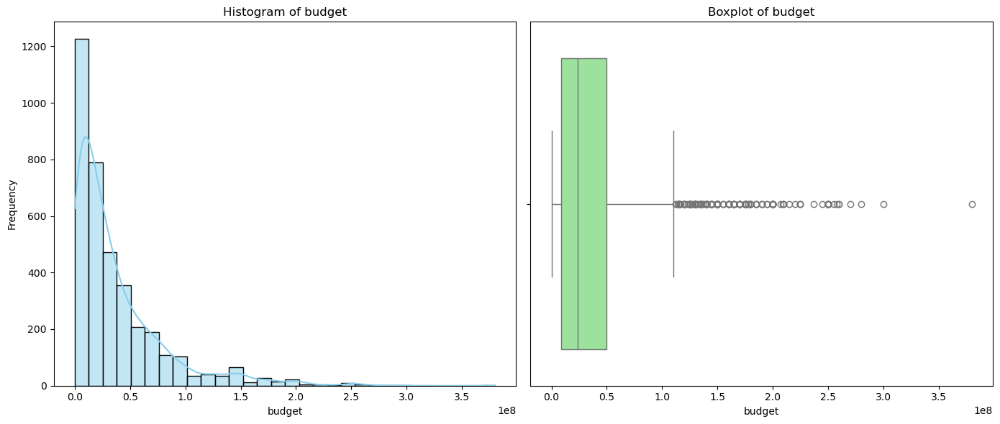

In [161]:
outlier_check_display('budget', test_merged_df)

In [162]:
test_merged_df['budget'].describe()

count    3.728000e+03
mean     3.741660e+07
std      4.270134e+07
min      7.000000e+03
25%      8.975000e+06
50%      2.400000e+07
75%      5.000000e+07
max      3.800000e+08
Name: budget, dtype: float64

In [163]:
alt_outlier_budget = z_score_outliers('budget', test_merged_df)

alt_outlier_budget

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
0,237000000,19995,en,Avatar,150.437577,2009-12-10,2787965087,162.0,Released,Avatar,...,James Cameron,Action,83.0,Sam Worthington,3,False,Ingenious Film Partners,True,United States of America,True
1,300000000,285,en,Pirates of the Caribbean: At World's End,139.082615,2007-05-19,961000000,169.0,Released,Pirates of the Caribbean: At World's End,...,Gore Verbinski,Adventure,34.0,Johnny Depp,4,True,Walt Disney Pictures,True,United States of America,False
2,245000000,206647,en,Spectre,107.376788,2015-10-26,880674609,148.0,Released,Spectre,...,Sam Mendes,Action,83.0,Daniel Craig,3,True,Columbia Pictures,True,United Kingdom,True
3,250000000,49026,en,The Dark Knight Rises,112.312950,2012-07-16,1084939099,165.0,Released,The Dark Knight Rises,...,Christopher Nolan,Action,158.0,Christian Bale,7,True,Legendary Pictures,True,United States of America,False
4,260000000,49529,en,John Carter,43.926995,2012-03-07,284139100,132.0,Released,John Carter,...,Andrew Stanton,Action,27.0,Taylor Kitsch,4,False,Walt Disney Pictures,False,United States of America,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,170000000,118340,en,Guardians of the Galaxy,481.098624,2014-07-30,773328629,121.0,Released,Guardians of the Galaxy,...,James Gunn,Action,80.0,Chris Pratt,7,False,Marvel Studios,True,United Kingdom,True
98,250000000,49051,en,The Hobbit: An Unexpected Journey,108.849621,2012-11-26,1021103568,169.0,Released,The Hobbit: An Unexpected Journey,...,Peter Jackson,Adventure,30.0,Ian McKellen,6,True,WingNut Films,True,New Zealand,True
105,170000000,241259,en,Alice Through the Looking Glass,56.268916,2016-05-25,299370084,113.0,Released,Alice Through the Looking Glass,...,James Bobin,Fantasy,98.0,Johnny Depp,8,True,Walt Disney Pictures,True,United Kingdom,True
126,170000000,76338,en,Thor: The Dark World,99.499595,2013-10-29,644571402,112.0,Released,Thor: The Dark World,...,Alan Taylor,Action,43.0,Chris Hemsworth,6,False,Marvel Studios,False,United States of America,False


there are still no "suspicious" low budget movies showing after removing those with <1000 dollars so I am going to assume it means they are simply in the normal range. I will continue with the alternate dataset for now.

#### Revenue outlier checking

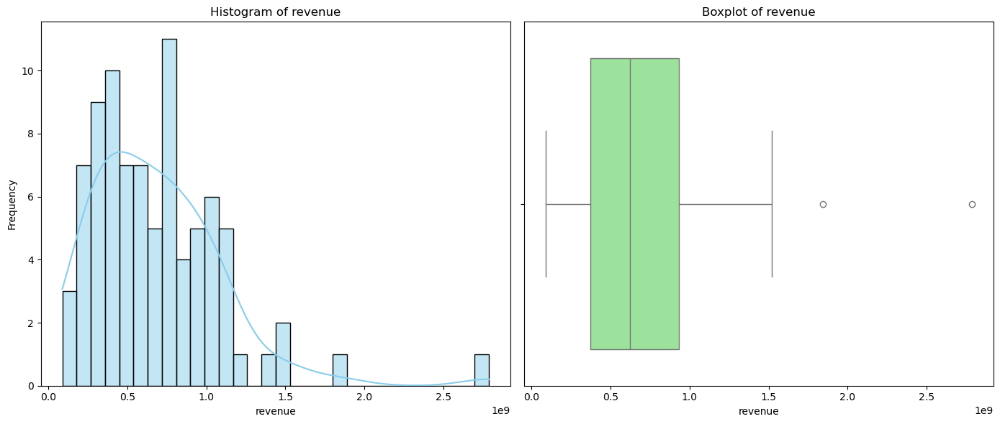

In [164]:
# revenue

outlier_check_display('revenue', alt_outlier_budget)

In [165]:
rev_outliers = z_score_outliers('revenue', alt_outlier_budget)
rev_outliers

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
0,237000000,19995,en,Avatar,150.437577,2009-12-10,2787965087,162.0,Released,Avatar,...,James Cameron,Action,83.0,Sam Worthington,3,False,Ingenious Film Partners,True,United States of America,True


Avatar is a budget outlier which makes sense because if I recall it is the highest grossing movie of all time.

In [166]:
#manual check

low_rev_movies = test_merged_df[test_merged_df['revenue'] < 10000]
low_rev_movies

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
83,27000000,79698,en,The Lovers,2.418535,2015-02-13,0,109.0,Released,The Lovers,...,Roland Joffé,Action,19.0,Josh Hartnett,0,False,Corsan,True,Australia,True
135,150000000,7978,en,The Wolfman,21.214571,2010-02-11,0,102.0,Released,The Wolfman,...,Joe Johnston,Drama,14.0,Benicio del Toro,3,True,Universal Pictures,True,United States of America,False
309,84000000,10214,en,Son of the Mask,17.815595,2005-02-18,0,94.0,Released,Son of the Mask,...,Lawrence Guterman,Fantasy,7.0,Jamie Kennedy,1,False,New Line Cinema,True,Germany,True
376,90000000,10357,en,Volcano,19.836124,1997-04-25,0,104.0,Released,Volcano,...,Mick Jackson,Science Fiction,16.0,Tommy Lee Jones,3,True,Twentieth Century Fox Film Corporation,False,United States of America,False
433,84000000,146216,en,RED 2,44.343330,2013-07-18,0,116.0,Released,RED 2,...,Dean Parisot,Action,61.0,Bruce Willis,6,True,DC Comics,True,Canada,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4737,50000,290391,en,"Run, Hide, Die",0.595809,2015-09-01,0,75.0,Released,"Run, Hide, Die",...,Collin Joseph Neal,Thriller,18.0,Alison Monda,0,False,Little Big Film Company,True,United States of America,False
4740,500000,40769,en,Mutual Appreciation,0.123068,2005-03-01,0,109.0,Released,Mutual Appreciation,...,Andrew Bujalski,Drama,3.0,Justin Rice,0,False,NaN,False,NaN,False
4744,27000,42497,en,Pink Narcissus,0.027811,1971-01-01,0,64.0,Released,Pink Narcissus,...,James Bidgood,Drama,3.0,Bobby Kendall,0,False,Strand Releasing,False,United States of America,False
4751,22000,255266,en,Dry Spell,0.048948,2013-02-14,0,90.0,Released,Dry Spell,...,Travis Legge,Comedy,6.0,Suzi Lorraine,0,False,NaN,False,United States of America,False


In [167]:
zero_rev_movies = test_merged_df[test_merged_df['revenue'] == 0]
print("Movies with Zero Revenue:", zero_rev_movies.shape[0])
zero_rev_movies

Movies with Zero Revenue: 514


,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
83,27000000,79698,en,The Lovers,2.418535,2015-02-13,0,109.0,Released,The Lovers,...,Roland Joffé,Action,19.0,Josh Hartnett,0,False,Corsan,True,Australia,True
135,150000000,7978,en,The Wolfman,21.214571,2010-02-11,0,102.0,Released,The Wolfman,...,Joe Johnston,Drama,14.0,Benicio del Toro,3,True,Universal Pictures,True,United States of America,False
309,84000000,10214,en,Son of the Mask,17.815595,2005-02-18,0,94.0,Released,Son of the Mask,...,Lawrence Guterman,Fantasy,7.0,Jamie Kennedy,1,False,New Line Cinema,True,Germany,True
376,90000000,10357,en,Volcano,19.836124,1997-04-25,0,104.0,Released,Volcano,...,Mick Jackson,Science Fiction,16.0,Tommy Lee Jones,3,True,Twentieth Century Fox Film Corporation,False,United States of America,False
433,84000000,146216,en,RED 2,44.343330,2013-07-18,0,116.0,Released,RED 2,...,Dean Parisot,Action,61.0,Bruce Willis,6,True,DC Comics,True,Canada,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4737,50000,290391,en,"Run, Hide, Die",0.595809,2015-09-01,0,75.0,Released,"Run, Hide, Die",...,Collin Joseph Neal,Thriller,18.0,Alison Monda,0,False,Little Big Film Company,True,United States of America,False
4740,500000,40769,en,Mutual Appreciation,0.123068,2005-03-01,0,109.0,Released,Mutual Appreciation,...,Andrew Bujalski,Drama,3.0,Justin Rice,0,False,NaN,False,NaN,False
4744,27000,42497,en,Pink Narcissus,0.027811,1971-01-01,0,64.0,Released,Pink Narcissus,...,James Bidgood,Drama,3.0,Bobby Kendall,0,False,Strand Releasing,False,United States of America,False
4751,22000,255266,en,Dry Spell,0.048948,2013-02-14,0,90.0,Released,Dry Spell,...,Travis Legge,Comedy,6.0,Suzi Lorraine,0,False,NaN,False,United States of America,False


After checking the actual tDMB website, some of the movies featured here are missing the value on the site too, but some are not. It feels safest to me to just remove the rows that are missing/have 0 for now.

In [168]:
test_merged_df = test_merged_df.drop(zero_rev_movies.index)

test_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3214 entries, 0 to 4768
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   budget                         3214 non-null   int64         
 1   id                             3214 non-null   int64         
 2   original_language              3214 non-null   object        
 3   original_title                 3214 non-null   object        
 4   popularity                     3214 non-null   float64       
 5   release_date                   3214 non-null   datetime64[ns]
 6   revenue                        3214 non-null   int64         
 7   runtime                        3214 non-null   float64       
 8   status                         3214 non-null   object        
 9   title                          3214 non-null   object        
 10  vote_average                   3214 non-null   float64       
 11  vote_count            

In [169]:
# runtime outlier checking


test_merged_df['runtime'].describe()

count    3214.000000
mean      110.784692
std        20.945701
min        41.000000
25%        96.000000
50%       107.000000
75%       121.000000
max       338.000000
Name: runtime, dtype: float64

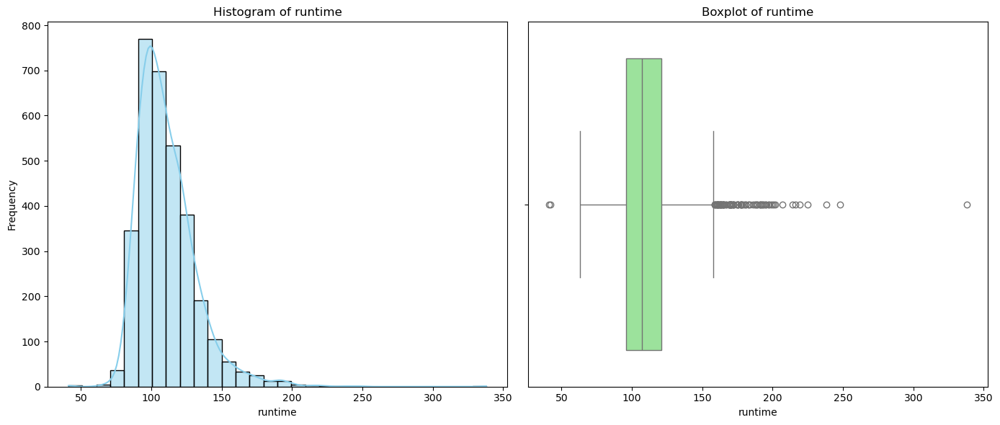

In [170]:
outlier_check_display('runtime', test_merged_df)

In [171]:
runtime_outliers = z_score_outliers('runtime', test_merged_df)
runtime_outliers

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
24,207000000,254,en,King Kong,61.226010,2005-12-14,550000000,187.0,Released,King Kong,...,Peter Jackson,Adventure,33.0,Naomi Watts,3,True,WingNut Films,True,New Zealand,True
25,200000000,597,en,Titanic,100.025899,1997-11-18,1845034188,194.0,Released,Titanic,...,James Cameron,Drama,136.0,Kate Winslet,4,True,Paramount Pictures,True,United States of America,False
110,140000000,676,en,Pearl Harbor,34.206690,2001-05-21,449220945,183.0,Released,Pearl Harbor,...,Michael Bay,History,101.0,Ben Affleck,8,True,Jerry Bruckheimer Films,True,United States of America,False
112,155000000,1966,en,Alexander,39.019229,2004-11-21,167298192,175.0,Released,Alexander,...,Oliver Stone,War,51.0,Colin Farrell,6,True,France 3 Cinéma,True,France,True
262,93000000,120,en,The Lord of the Rings: The Fellowship of the Ring,138.049577,2001-12-18,871368364,178.0,Released,The Lord of the Rings: The Fellowship of the Ring,...,Peter Jackson,Adventure,26.0,Elijah Wood,8,True,WingNut Films,True,New Zealand,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3810,4000000,770,en,Gone with the Wind,48.982550,1939-12-15,400176459,238.0,Released,Gone with the Wind,...,Victor Fleming,Drama,133.0,Vivien Leigh,0,False,Selznick International Pictures,True,United States of America,False
3911,3000000,821,en,Judgment at Nuremberg,13.338539,1961-12-01,10000000,186.0,Released,Judgment at Nuremberg,...,Stanley Kramer,Drama,55.0,Spencer Tracy,0,False,United Artists,True,Germany,True
4481,600000,9459,en,Woodstock,3.409764,1970-03-26,34505110,225.0,Released,Woodstock,...,Michael Wadleigh,History,12.0,Joe Cocker,0,False,Wadleigh-Maurice,True,United States of America,False
4518,2000000,346,ja,七人の侍,39.756748,1954-04-26,271841,207.0,Released,Seven Samurai,...,Akira Kurosawa,Action,101.0,Toshirō Mifune,0,False,Toho Company,False,Japan,False


None of the outliers look like anomalies; I think they are just (mostly) very long and some very short movies

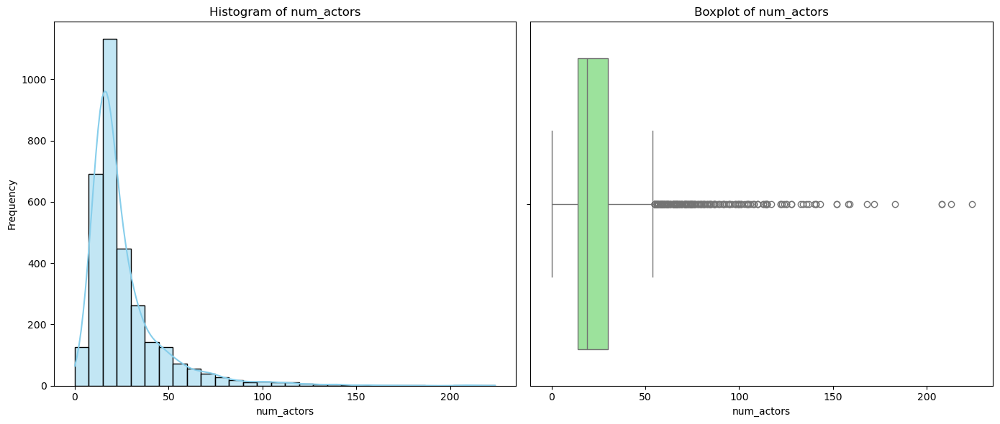

In [172]:
outlier_check_display('num_actors', test_merged_df)

In [173]:
actor_outliers = z_score_outliers('num_actors', test_merged_df)

with (pd.option_context('display.max_rows', 10000)):
    display(actor_outliers)

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
3,250000000,49026,en,The Dark Knight Rises,112.312950,2012-07-16,1084939099,165.0,Released,The Dark Knight Rises,...,Christopher Nolan,Action,158.0,Christian Bale,7,True,Legendary Pictures,True,United States of America,False
5,258000000,559,en,Spider-Man 3,115.699814,2007-05-01,890871626,139.0,Released,Spider-Man 3,...,Sam Raimi,Fantasy,143.0,Tobey Maguire,10,False,Columbia Pictures,True,United States of America,False
9,250000000,209112,en,Batman v Superman: Dawn of Justice,155.790452,2016-03-23,873260194,151.0,Released,Batman v Superman: Dawn of Justice,...,Zack Snyder,Action,152.0,Ben Affleck,8,True,DC Comics,True,United States of America,False
16,220000000,24428,en,The Avengers,144.448633,2012-04-25,1519557910,143.0,Released,The Avengers,...,Joss Whedon,Science Fiction,115.0,Robert Downey Jr.,10,True,Paramount Pictures,True,United States of America,False
25,200000000,597,en,Titanic,100.025899,1997-11-18,1845034188,194.0,Released,Titanic,...,James Cameron,Drama,136.0,Kate Winslet,4,True,Paramount Pictures,True,United States of America,False
26,250000000,271110,en,Captain America: Civil War,198.372395,2016-04-27,1153304495,147.0,Released,Captain America: Civil War,...,Anthony Russo,Adventure,100.0,Chris Evans,8,False,Studio Babelsberg,True,United States of America,False
31,200000000,68721,en,Iron Man 3,77.682080,2013-04-18,1215439994,130.0,Released,Iron Man 3,...,Shane Black,Action,107.0,Robert Downey Jr.,8,True,Marvel Studios,False,China,True
37,200000000,68728,en,Oz: The Great and Powerful,46.985445,2013-03-07,491868548,130.0,Released,Oz: The Great and Powerful,...,Sam Raimi,Fantasy,159.0,James Franco,2,True,Walt Disney Pictures,True,United States of America,False
47,190000000,54138,en,Star Trek Into Darkness,78.291018,2013-05-05,467365246,132.0,Released,Star Trek Into Darkness,...,J.J. Abrams,Action,98.0,Chris Pine,5,False,Paramount Pictures,True,United States of America,False
64,178000000,246655,en,X-Men: Apocalypse,139.272042,2016-05-18,543934787,144.0,Released,X-Men: Apocalypse,...,Bryan Singer,Science Fiction,95.0,James McAvoy,3,False,Twentieth Century Fox Film Corporation,True,United States of America,False


In [174]:
# manual check

low_actor_movies = test_merged_df[test_merged_df['num_actors'] < 3]
low_actor_movies

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre_1,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
1730,35866397,11516,fr,Le peuple migrateur,3.750740,2001-12-12,20217080,98.0,Released,Winged Migration,...,Jacques Perrin,Documentary,2.0,Philippe Labro,0,False,Bac Films,True,Switzerland,True
3224,9000000,152747,en,All Is Lost,28.540614,2013-10-18,6108720,106.0,Released,All Is Lost,...,J.C. Chandor,Action,1.0,Robert Redford,0,False,Sudden Storm Productions,True,United States of America,False
3471,6000000,57612,en,Dolphins and Whales: Tribes of the Ocean,0.041651,2008-02-15,7518876,42.0,Released,Dolphins and Whales: Tribes of the Ocean,...,Jean-Jacques Mantello,Documentary,2.0,Daryl Hannah,0,False,3D Entertainment,True,Bahamas,True
3894,3000000,20337,en,Martin Lawrence Live: Runteldat,0.295226,2002-08-01,19184015,113.0,Released,Martin Lawrence Live: Runteldat,...,Martin Lawrence,Comedy,1.0,Martin Lawrence,0,False,NaN,False,United States of America,False
4005,2500000,126509,en,2016: Obama's America,0.973582,2012-07-13,33400000,87.0,Released,2016: Obama's America,...,John Sullivan,Documentary,0.0,,0,False,NaN,False,United States of America,False
4583,300000,21525,en,Tupac: Resurrection,1.314576,2003-01-23,7808524,112.0,Released,Tupac: Resurrection,...,Lauren Lazin,Music,1.0,Tupac Amaru Shakur,0,False,Paramount Pictures,True,United States of America,False
4594,300000,73981,en,Ayurveda: Art of Being,0.055868,2001-09-20,2074000,101.0,Released,Ayurveda: Art of Being,...,Pan Nalin,Documentary,0.0,,0,False,Pandora Filmproduktion,True,India,True


The movies with no actors are either misaligned with the database or not present in the database (website) so they will be removed.
Also Tupac: Resurrection has more actors that are not properly documented so it will aslo be removed. The other 1 actor movies, however, just simply have 1 actor.

In [175]:
no_actor_movies = test_merged_df[test_merged_df['num_actors'] == 0]
test_merged_df = test_merged_df.drop(no_actor_movies.index)
test_merged_df = test_merged_df.drop(test_merged_df[test_merged_df['id'] == 21525].index)

In [176]:
#rename genre

test_merged_df = test_merged_df.rename(columns={'genre_1': 'genre'})

#turn multiple_.... columns into bools

test_merged_df = test_merged_df.astype({'multiple_production_companies': 'bool',
                                      'multiple_production_countries': 'bool',
                                      'famous_lead': 'bool'})

test_merged_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 3211 entries, 0 to 4768
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   budget                         3211 non-null   int64         
 1   id                             3211 non-null   int64         
 2   original_language              3211 non-null   object        
 3   original_title                 3211 non-null   object        
 4   popularity                     3211 non-null   float64       
 5   release_date                   3211 non-null   datetime64[ns]
 6   revenue                        3211 non-null   int64         
 7   runtime                        3211 non-null   float64       
 8   status                         3211 non-null   object        
 9   title                          3211 non-null   object        
 10  vote_average                   3211 non-null   float64       
 11  vote_count            

Things to still check:
missing values in production company and country

In [177]:
no_country = test_merged_df[test_merged_df['production_country_main'].isnull()]
no_country # alot of the missings overlap

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
272,90000000,24113,en,Town & Country,1.004579,2001-04-27,10372291,104.0,Released,Town & Country,...,Peter Chelsom,Comedy,10.0,Warren Beatty,1,False,New Line Cinema,False,NaN,False
1932,25000000,24264,en,Sheena,4.020194,1984-08-17,5778353,117.0,Released,Sheena,...,John Guillermin,Action,8.0,Tanya Roberts,0,False,Columbia Pictures Corporation,True,NaN,False
1983,24000000,40688,en,Meet the Deedles,2.353441,1998-03-27,4562146,93.0,Released,Meet the Deedles,...,Steve Boyum,Animation,9.0,Paul Walker,2,False,Walt Disney Pictures,False,NaN,False
2728,13400000,70829,en,The Last Godfather,0.680753,2010-12-29,16700000,100.0,Released,The Last Godfather,...,Shim Hyung-Rae,Action,15.0,Harvey Keitel,1,True,NaN,False,NaN,False
2899,19000000,173931,zh,兔侠传奇,0.738652,2011-01-01,2570000,89.0,Released,Legend of a Rabbit,...,Lijun Sun,Animation,5.0,Jon Heder,1,False,NaN,False,NaN,False
3225,8000000,62676,en,Limbo,0.034259,1999-06-04,1997807,126.0,Released,Limbo,...,John Sayles,Adventure,4.0,Mary Elizabeth Mastrantonio,0,False,NaN,False,NaN,False
3243,8000000,37964,en,Brown Sugar,3.501158,2002-10-05,27362712,109.0,Released,Brown Sugar,...,Rick Famuyiwa,Comedy,22.0,Sanaa Lathan,1,False,NaN,False,NaN,False
3319,7500000,36046,en,The Work and the Glory,0.571663,2004-11-24,3347647,110.0,Released,The Work and the Glory,...,Russell Holt,Drama,7.0,Sam Hennings,0,False,NaN,False,NaN,False
3388,7000000,30128,en,I Hope They Serve Beer in Hell,7.155519,2009-09-25,1429299,106.0,Released,I Hope They Serve Beer in Hell,...,Bob Gosse,Comedy,9.0,Matt Czuchry,0,False,NaN,False,NaN,False
4100,2000000,12901,en,No End in Sight,2.283796,2007-07-27,1431623,102.0,Released,No End in Sight,...,Charles Ferguson,Documentary,4.0,Campbell Scott,0,False,NaN,False,NaN,False


In [178]:
# removing movies with no country or company

no_country_no_company_idxs = test_merged_df[test_merged_df['production_country_main'].isnull() & test_merged_df['production_company_main'].isnull()].index

test_merged_df = test_merged_df.drop(no_country_no_company_idxs)
test_merged_df.info() #still 26 movies with no company and 3 with no country

<class 'pandas.core.frame.DataFrame'>
Index: 3200 entries, 0 to 4768
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   budget                         3200 non-null   int64         
 1   id                             3200 non-null   int64         
 2   original_language              3200 non-null   object        
 3   original_title                 3200 non-null   object        
 4   popularity                     3200 non-null   float64       
 5   release_date                   3200 non-null   datetime64[ns]
 6   revenue                        3200 non-null   int64         
 7   runtime                        3200 non-null   float64       
 8   status                         3200 non-null   object        
 9   title                          3200 non-null   object        
 10  vote_average                   3200 non-null   float64       
 11  vote_count            

In [179]:
#do no country first

no_country = test_merged_df[test_merged_df['production_country_main'].isnull()]
no_country

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
272,90000000,24113,en,Town & Country,1.004579,2001-04-27,10372291,104.0,Released,Town & Country,...,Peter Chelsom,Comedy,10.0,Warren Beatty,1,False,New Line Cinema,False,NaN,False
1932,25000000,24264,en,Sheena,4.020194,1984-08-17,5778353,117.0,Released,Sheena,...,John Guillermin,Action,8.0,Tanya Roberts,0,False,Columbia Pictures Corporation,True,NaN,False
1983,24000000,40688,en,Meet the Deedles,2.353441,1998-03-27,4562146,93.0,Released,Meet the Deedles,...,Steve Boyum,Animation,9.0,Paul Walker,2,False,Walt Disney Pictures,False,NaN,False


After manually checking these 3 examples, I was able to find their information online and decided to manually fill it since it is a small amount

In [180]:
# changing country manually

test_merged_df.loc[no_country.index, 'production_country_main'] = 'United States of America'
test_merged_df.loc[test_merged_df['id'] == 24264, 'multiple_production_countries'] = True

test_merged_df.loc[no_country.index] #fixed


,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
272,90000000,24113,en,Town & Country,1.004579,2001-04-27,10372291,104.0,Released,Town & Country,...,Peter Chelsom,Comedy,10.0,Warren Beatty,1,False,New Line Cinema,False,United States of America,False
1932,25000000,24264,en,Sheena,4.020194,1984-08-17,5778353,117.0,Released,Sheena,...,John Guillermin,Action,8.0,Tanya Roberts,0,False,Columbia Pictures Corporation,True,United States of America,True
1983,24000000,40688,en,Meet the Deedles,2.353441,1998-03-27,4562146,93.0,Released,Meet the Deedles,...,Steve Boyum,Animation,9.0,Paul Walker,2,False,Walt Disney Pictures,False,United States of America,False


In [181]:
#no prod company

no_companies = test_merged_df[test_merged_df['production_company_main'].isnull()]
no_companies

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,status,title,...,director,genre,num_actors,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries
1754,27000000,10188,en,The Sisterhood of the Traveling Pants 2,11.870301,2008-08-06,44352417,117.0,Released,The Sisterhood of the Traveling Pants 2,...,Sanaa Hamri,Adventure,25.0,Alexis Bledel,0,False,NaN,False,United States of America,False
2174,20000000,47941,en,Under the Rainbow,0.173964,1981-07-31,2297493,98.0,Released,Under the Rainbow,...,Steve Rash,Comedy,15.0,Chevy Chase,0,False,NaN,False,United States of America,False
2650,15000000,31668,en,All The Queen's Men,1.833058,2001-10-14,23000,99.0,Released,All The Queen's Men,...,Stefan Ruzowitzky,Action,9.0,Matt LeBlanc,0,False,NaN,False,Austria,True
3098,5000000,13191,en,"War, Inc.",6.265659,2008-04-28,1296184,106.0,Released,"War, Inc.",...,Joshua Seftel,Action,23.0,John Cusack,5,True,NaN,False,Bulgaria,False
3180,8500000,1619,en,The Way of the Gun,8.775844,2000-09-08,19125401,119.0,Released,The Way of the Gun,...,Christopher McQuarrie,Action,15.0,Benicio del Toro,2,True,NaN,False,United States of America,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4441,800000,25461,en,Raising Victor Vargas,3.643662,2002-05-16,2816116,88.0,Released,Raising Victor Vargas,...,Peter Sollett,Drama,9.0,Victor Rasuk,0,False,NaN,False,United States of America,False
4445,800000,26899,en,The Mudge Boy,5.292536,2003-01-17,62852,94.0,Released,The Mudge Boy,...,Michael Burke,Drama,6.0,Emile Hirsch,1,False,NaN,False,United States of America,False
4466,700000,18734,en,L.I.E. Long Island Expressway,7.731064,2001-01-20,1667192,97.0,Released,L.I.E.,...,Michael Cuesta,Drama,9.0,Paul Dano,1,False,NaN,False,United States of America,False
4609,250000,50035,en,Lovely & Amazing,1.459170,2001-08-31,4186931,91.0,Released,Lovely & Amazing,...,Nicole Holofcener,Comedy,16.0,Catherine Keener,5,True,NaN,False,United States of America,False


I am not really sure why these don't have an associated production company becasue google says they do but I don't really care at this point they are getting removed

In [182]:
#dropping

test_merged_df = test_merged_df.drop(no_companies.index)
test_merged_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 3174 entries, 0 to 4768
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   budget                         3174 non-null   int64         
 1   id                             3174 non-null   int64         
 2   original_language              3174 non-null   object        
 3   original_title                 3174 non-null   object        
 4   popularity                     3174 non-null   float64       
 5   release_date                   3174 non-null   datetime64[ns]
 6   revenue                        3174 non-null   int64         
 7   runtime                        3174 non-null   float64       
 8   status                         3174 non-null   object        
 9   title                          3174 non-null   object        
 10  vote_average                   3174 non-null   float64       
 11  vote_count            

In [183]:
test_merged_df['popularity'].head()

0    150.437577
1    139.082615
2    107.376788
3    112.312950
4     43.926995
Name: popularity, dtype: float64

All nulls and suspected outliers have been taken care of; analysis shall resume

## Return to Univariate Visualizations

Features (Organized):

budget - Continuous Ratio <br>
popularity - Continuous Ratio <br>
revenue - Continuous Ratio <br>
runtime - Continuous Ratio <br>
vote_average - Continuous Ratio <br>
vote_count - Continuous Ratio <br>
num_famous_actors - Discrete Ratio <br>
num_actors - Discrete Ratio <br>

id - Nominal Category <br>
original_language - Nominal Category <br>
original_title - Nominal Category <br>
production_company_main - Nominal Category <br>
production_country_main - Nominal Category <br>
lead_actor - Nominal Category <br>
director - Nominal Category <br>
genre - Nominal Category    <br>
title - Nominal Category <br>
release_date - Ordinal Category <br>
release_year - Ordinal Category    <br>

famous_lead - Boolean <br>
multiple_production_companies - Boolean <br>
multiple_production_countries - Boolean <br>

In [184]:
# summary stats

sum_test_merged_df = test_merged_df.drop('id', axis=1)
sum_test_merged_df.describe()

,budget,popularity,release_date,revenue,runtime,vote_average,vote_count,num_actors,num_famous_actors
count,3.174000e+03,3174.000000,3174,3.174000e+03,3174.000000,3174.000000,3174.000000,3174.000000,3174.000000
mean,4.129071e+07,29.475862,2002-04-01 19:41:51.153119104,1.232553e+08,110.897290,6.312161,993.340895,26.281664,2.204159
min,7.000000e+03,0.037073,1916-09-04 00:00:00,7.000000e+00,41.000000,0.000000,0.000000,1.000000,0.000000
25%,1.100000e+07,10.926848,1998-08-20 06:00:00,1.786998e+07,97.000000,5.800000,190.000000,15.000000,1.000000
50%,2.600000e+07,20.801659,2005-08-04 12:00:00,5.722771e+07,107.000000,6.300000,485.000000,19.000000,2.000000
75%,5.500000e+07,37.764689,2010-11-29 06:00:00,1.491741e+08,121.000000,6.900000,1168.750000,30.000000,3.000000
max,3.800000e+08,875.581305,2016-09-09 00:00:00,2.787965e+09,338.000000,8.500000,13752.000000,224.000000,15.000000
std,4.450746e+07,36.314834,NaN,1.872728e+08,20.966473,0.869925,1421.112279,21.558386,2.038837


In [185]:
# Category summary stats

print("Unique values in categorical columns after cleaning:")
test_merged_df.select_dtypes(include=['object']).nunique()

Unique values in categorical columns after cleaning:


original_language            25
original_title             3174
status                        1
title                      3173
director                   1410
genre                        19
lead_actor                 1266
production_company_main     748
production_country_main      45
dtype: int64

In [186]:
# feature splitting for analysis

#add release year 
test_merged_df['release_year'] = test_merged_df['release_date'].dt.year

#drop status it is all the same
test_merged_df = test_merged_df.drop(columns=['status'])

measures = ['budget', 'revenue', 'popularity', 'runtime', 'vote_average', 'vote_count', 'num_famous_actors', 'num_actors']
categories = ['original_language', 'original_title', 'production_company_main', 'production_country_main', 'lead_actor', 'director', 'genre', 'title', 'release_date', 'release_year']
booleans = ['famous_lead', 'multiple_production_companies', 'multiple_production_countries']



### Numeric Visualizations

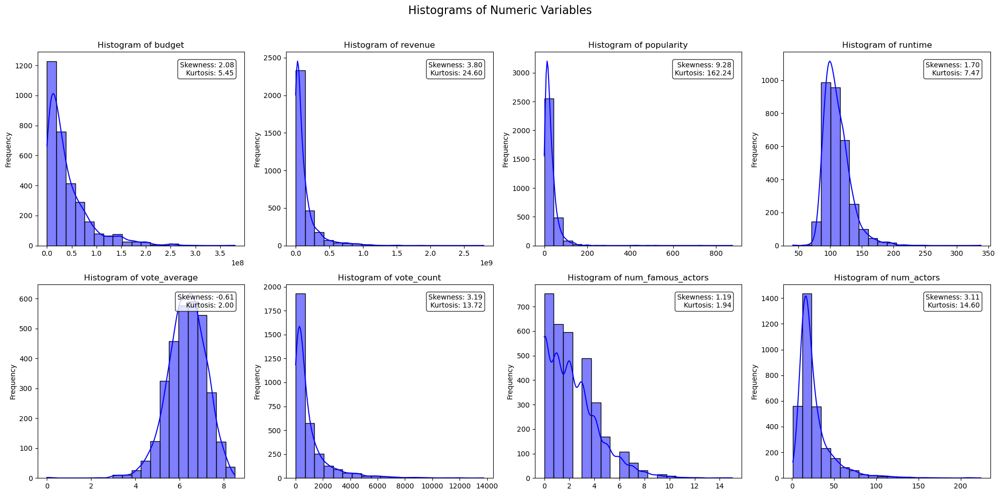

In [187]:
# histograms with skew and kurtosis

def plot_histograms(df, numeric_cols, dims = (2, 4)):
    fig, axes = plt.subplots(dims[0], dims[1], figsize=(20, 10))
    fig.suptitle("Histograms of Numeric Variables", fontsize=16)

    for ax, col in zip(axes.flatten(), numeric_cols):
        col_skewness = skew(df[col].dropna())
        col_kurtosis = kurtosis(df[col].dropna())
        sns.histplot(data=df, x=col, bins=20, kde=True, color="blue", edgecolor="black", ax=ax)
        ax.set_title(f"Histogram of {col}", fontsize=12)
        ax.text(0.95, 0.95, f"Skewness: {col_skewness:.2f}\nKurtosis: {col_kurtosis:.2f}",
                transform=ax.transAxes, fontsize=10, ha='right', va='top', bbox=dict(boxstyle="round", facecolor="white", alpha=0.8))
        ax.set_xlabel("")
        ax.set_ylabel("Frequency")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_histograms(test_merged_df, measures)

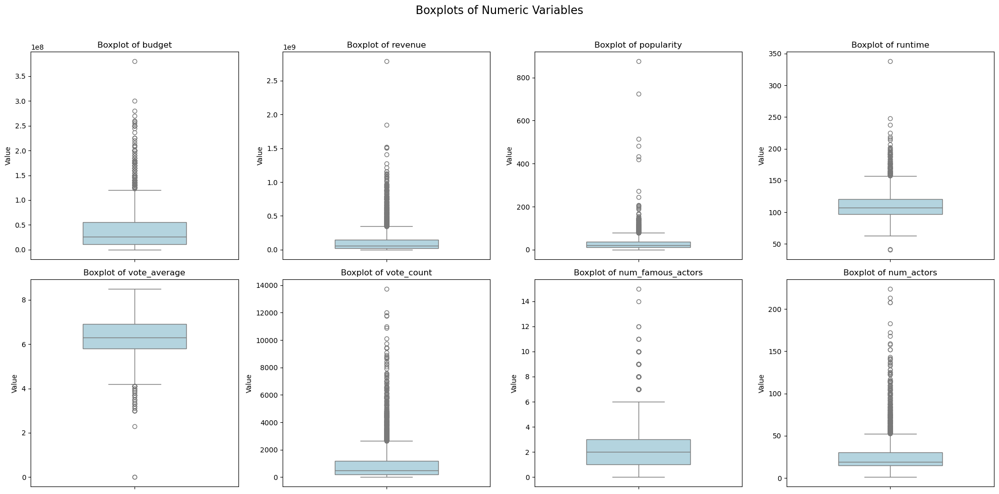

In [188]:
# boxplots

def plot_boxplots(df, numeric_cols, dims = (2, 4)):
    fig, axes = plt.subplots(dims[0], dims[1], figsize=(20, 10))
    fig.suptitle("Boxplots of Numeric Variables", fontsize=16)

    for ax, col in zip(axes.flatten(), numeric_cols):
        sns.boxplot(data=df, y=col, ax=ax, color="lightblue", width=0.5)
        ax.set_title(f"Boxplot of {col}", fontsize=12)
        ax.set_xlabel("")
        ax.set_ylabel("Value")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_boxplots(test_merged_df, measures)

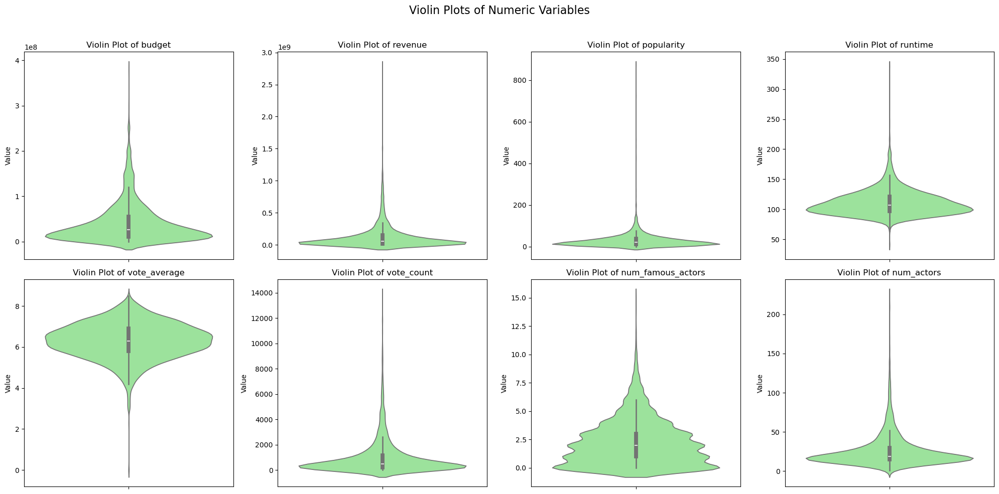

In [189]:
# violin plots

def plot_violinplots(df, numeric_cols, dims = (2, 4)):
    fig, axes = plt.subplots(dims[0], dims[1], figsize=(20, 10))
    fig.suptitle("Violin Plots of Numeric Variables", fontsize=16)

    for ax, col in zip(axes.flatten(), numeric_cols):
        sns.violinplot(data=df, y=col, ax=ax, color="lightgreen")
        ax.set_title(f"Violin Plot of {col}", fontsize=12)
        ax.set_xlabel("")
        ax.set_ylabel("Value")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_violinplots(test_merged_df, measures)

### Categorical Visualizations

/var/folders/77/8fv_fwk973ggzm2njdqfz7n40000gn/T/ipykernel_47808/858930195.py:18: UserWarning: Glyph 21351 (\N{CJK UNIFIED IDEOGRAPH-5367}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.96])
/var/folders/77/8fv_fwk973ggzm2njdqfz7n40000gn/T/ipykernel_47808/858930195.py:18: UserWarning: Glyph 34382 (\N{CJK UNIFIED IDEOGRAPH-864E}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.96])
/var/folders/77/8fv_fwk973ggzm2njdqfz7n40000gn/T/ipykernel_47808/858930195.py:18: UserWarning: Glyph 34255 (\N{CJK UNIFIED IDEOGRAPH-85CF}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.96])
/var/folders/77/8fv_fwk973ggzm2njdqfz7n40000gn/T/ipykernel_47808/858930195.py:18: UserWarning: Glyph 40857 (\N{CJK UNIFIED IDEOGRAPH-9F99}) missing from current font.
  plt.tight_layout(rect=[0, 0, 1, 0.96])
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 21351 (\N{CJK UNIFIED IDEOGRAPH-5367}) missing from current font.
  fig.c

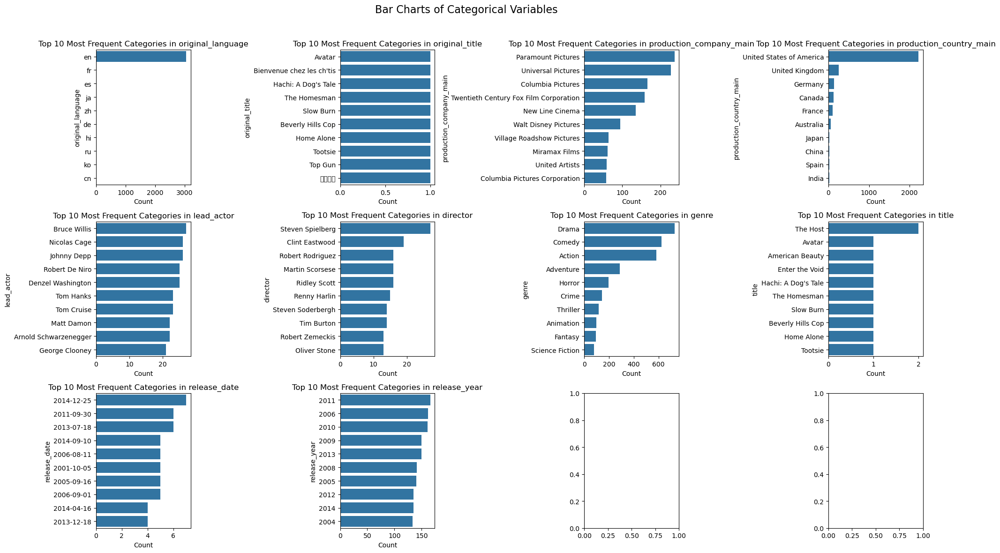

In [190]:
#bar charts

def plot_bar_charts(df, categorical_cols, dims = (2, 3), limit=10):
    fig, axes = plt.subplots(dims[0], dims[1], figsize=(20, 12))
    fig.suptitle("Bar Charts of Categorical Variables", fontsize=16)

    # if one column
    if len(categorical_cols) == 1:
        axes = np.array([[axes]])
    else:
        axes = axes
    for ax, col in zip(axes.flatten(), categorical_cols):
        sns.countplot(data=df, y=col, order=df[col].value_counts().index[:limit],  ax=ax)
        ax.set_title(f"Top {limit} Most Frequent Categories in {col}", fontsize=12)
        ax.set_xlabel("Count", fontsize=10)
        ax.set_ylabel(col, fontsize=10)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_bar_charts(test_merged_df, categories, dims=(3, 4))

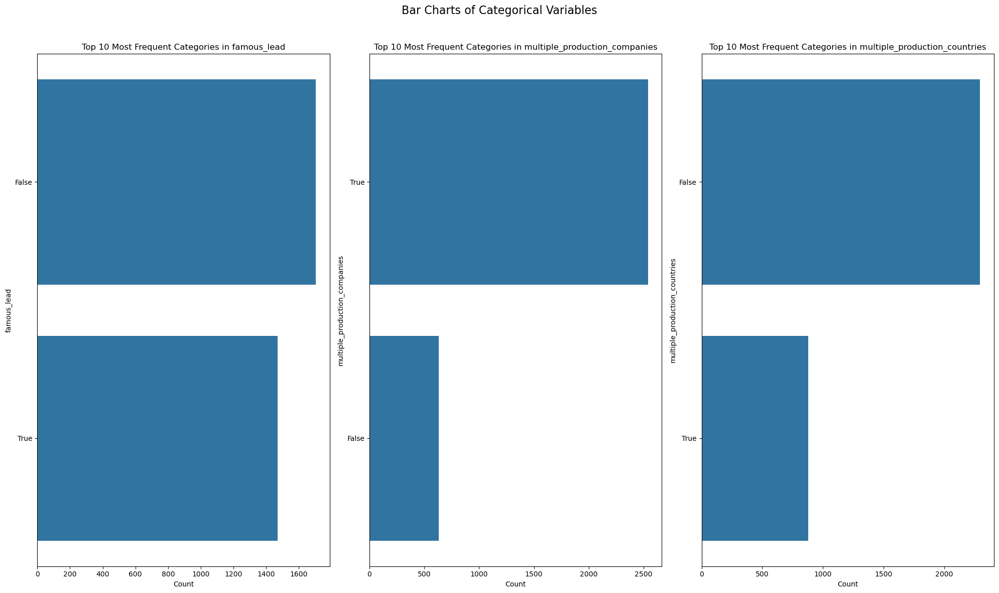

In [191]:
# Boolean columns

plot_bar_charts(test_merged_df, booleans, dims=(1, 3))

All of the graphs here make sense/align with my domain knowledge.

In [192]:
test_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3174 entries, 0 to 4768
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   budget                         3174 non-null   int64         
 1   id                             3174 non-null   int64         
 2   original_language              3174 non-null   object        
 3   original_title                 3174 non-null   object        
 4   popularity                     3174 non-null   float64       
 5   release_date                   3174 non-null   datetime64[ns]
 6   revenue                        3174 non-null   int64         
 7   runtime                        3174 non-null   float64       
 8   title                          3174 non-null   object        
 9   vote_average                   3174 non-null   float64       
 10  vote_count                     3174 non-null   int64         
 11  director              

Features (Organized):

    budget - Continuous Ratio
    popularity - Continuous Ratio
    revenue - Continuous Ratio
    runtime - Continuous Ratio
    vote_average - Continuous Ratio
    vote_count - Continuous Ratio
    num_famous_actors - Discrete Ratio
    num_actors - Discrete Ratio

    id - Nominal Category
    original_language - Nominal Category
    original_title - Nominal Category
    production_company_main - Nominal Category
    production_country_main - Nominal Category
    lead_actor - Nominal Category
    director - Nominal Category
    genre - Nominal Category    
    title - Nominal Category
    release_date - Ordinal Category
    release_year - Ordinal Category

    famous_lead - Boolean 
    multiple_production_companies - Boolean
    multiple_production_countries - Boolean

## Bivariate Visualizations

### Measure-Measure

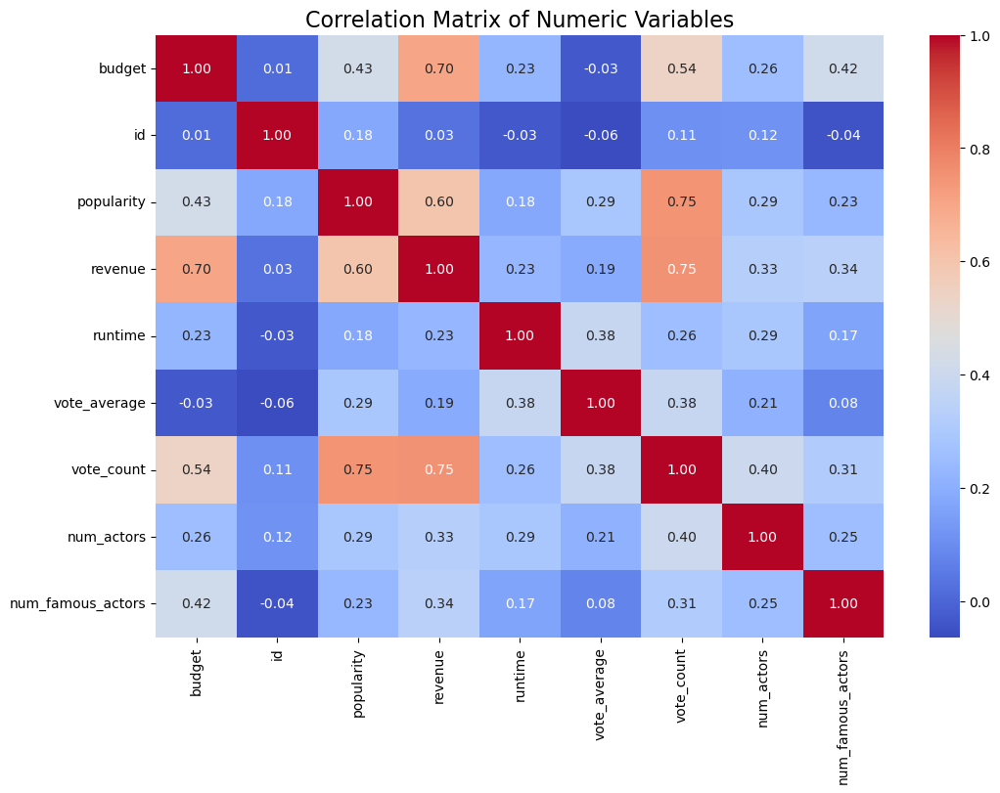

In [193]:
# correlation matrix

correlation_matrix = test_merged_df.select_dtypes(include=['float64', 'int64']).corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix of Numeric Variables", fontsize=16)
plt.show()

Most of these make sense, and I don't find any to be problematic; the only thing of concern is perhaps the popularity column being correlated with vote_count, and it might end up being removed in the future.

In [194]:
# scatterplot generator

def make_scatterplot_array(numerics, col, data):

    scatter_pairs = numerics.drop(columns=[col])
    
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle(f"Scatter Plots of {col.capitalize()} vs Other Numeric Variables", fontsize=16)
    for ax, other_col in zip(axes.flatten(), scatter_pairs.columns):
        if other_col != col:
            sns.scatterplot(data=data, x=col, y=other_col, ax=ax, alpha=0.5)
            ax.set_title(f"{col.capitalize()} vs {other_col}", fontsize=12)
            ax.set_xlabel(col.capitalize(), fontsize=10)
            ax.set_ylabel(other_col, fontsize=10)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


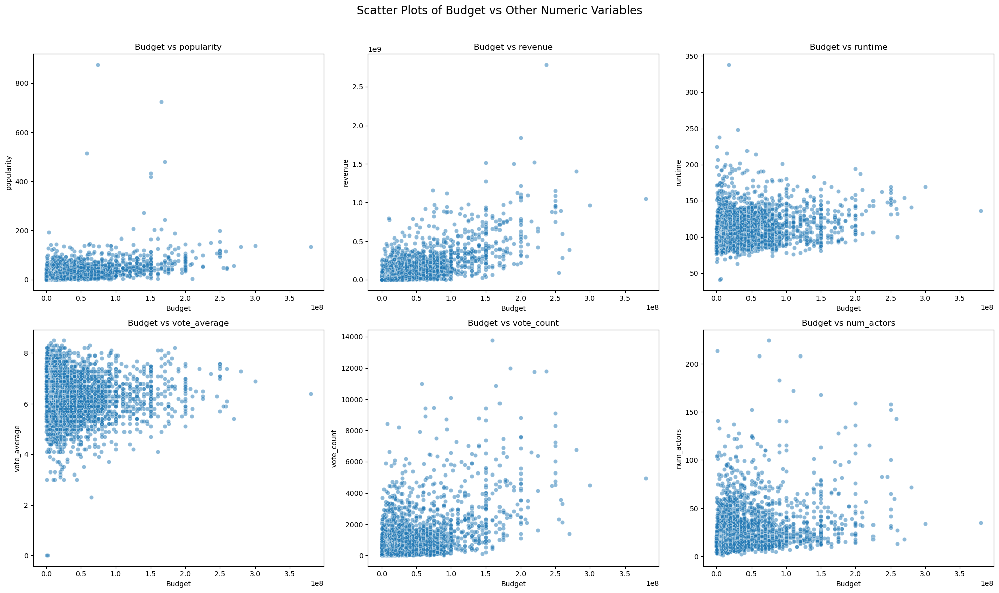

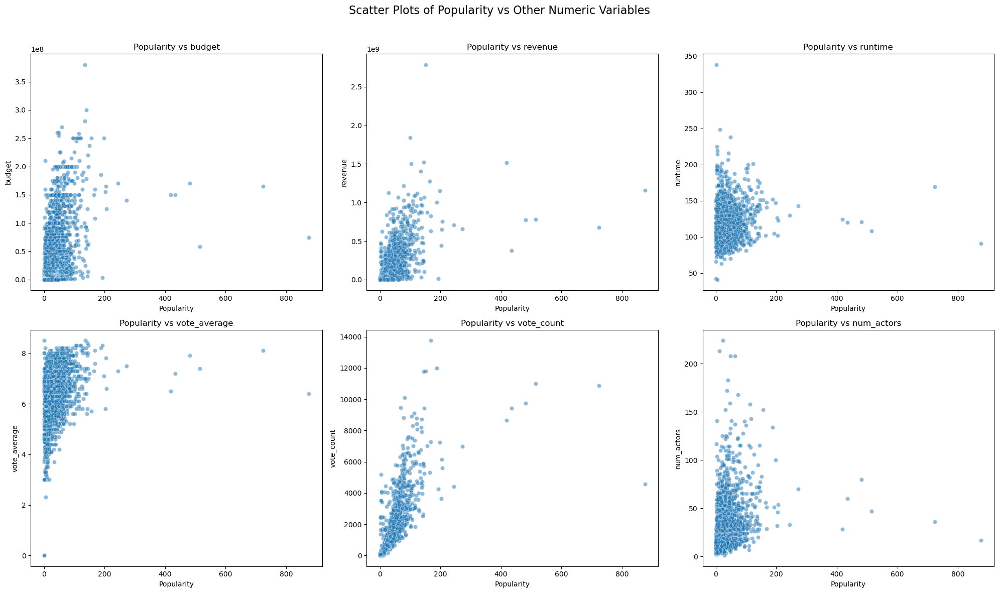

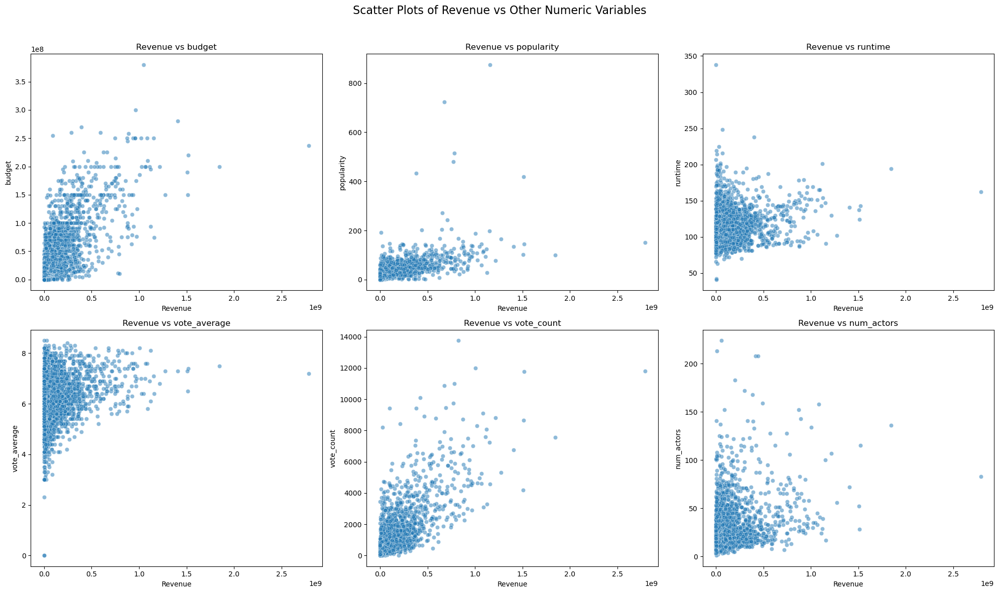

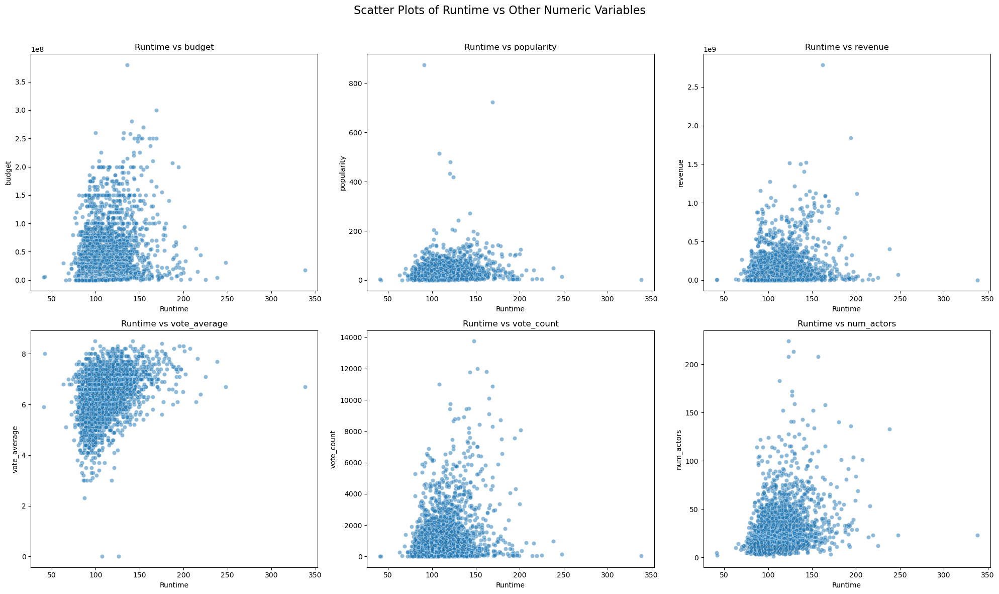

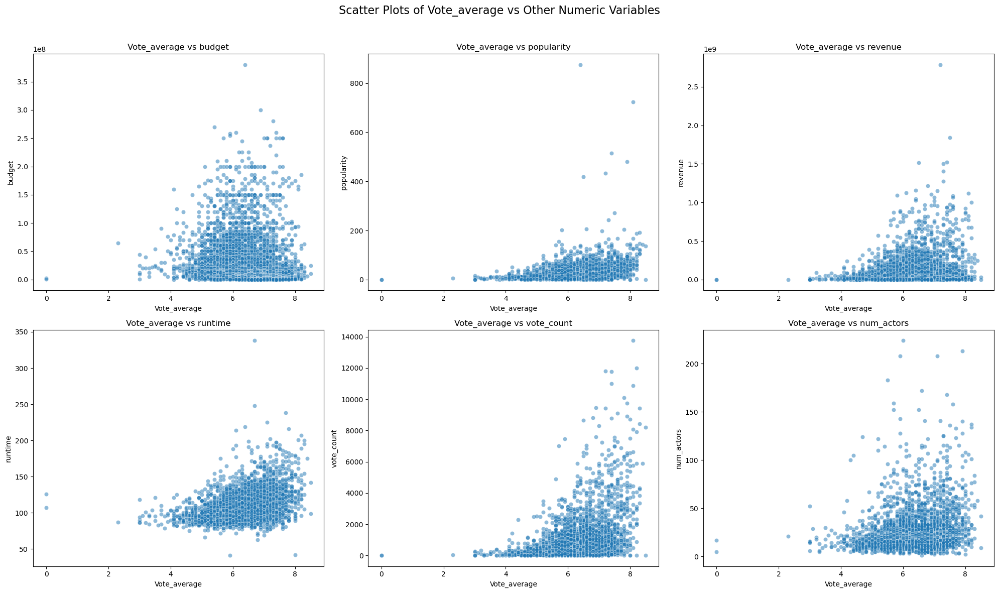

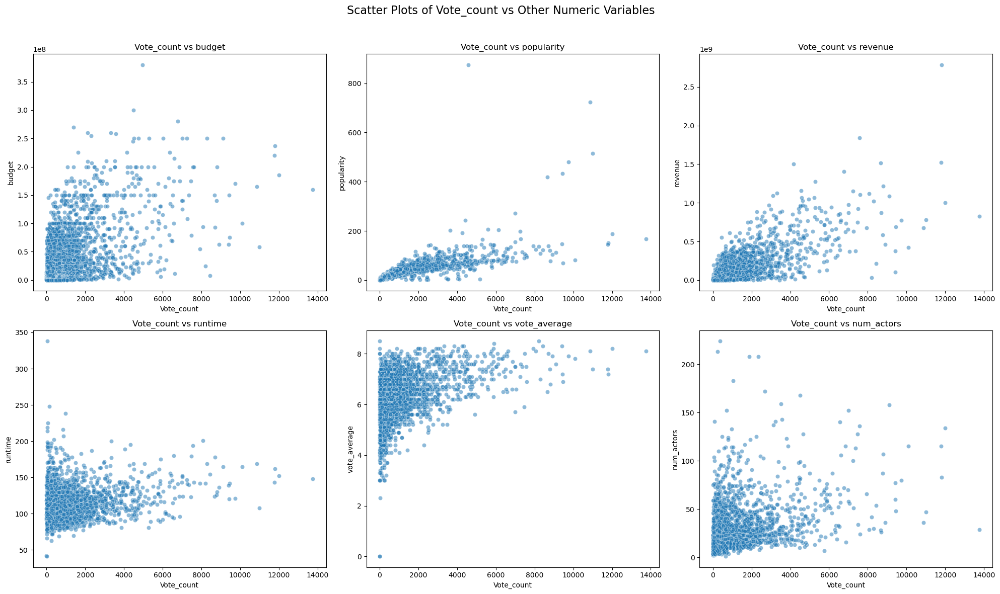

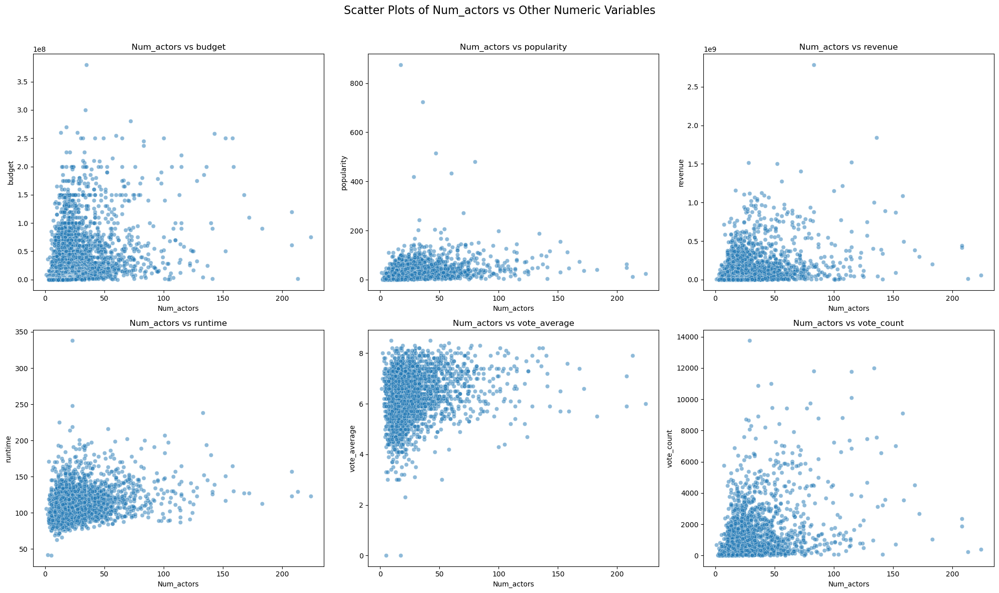

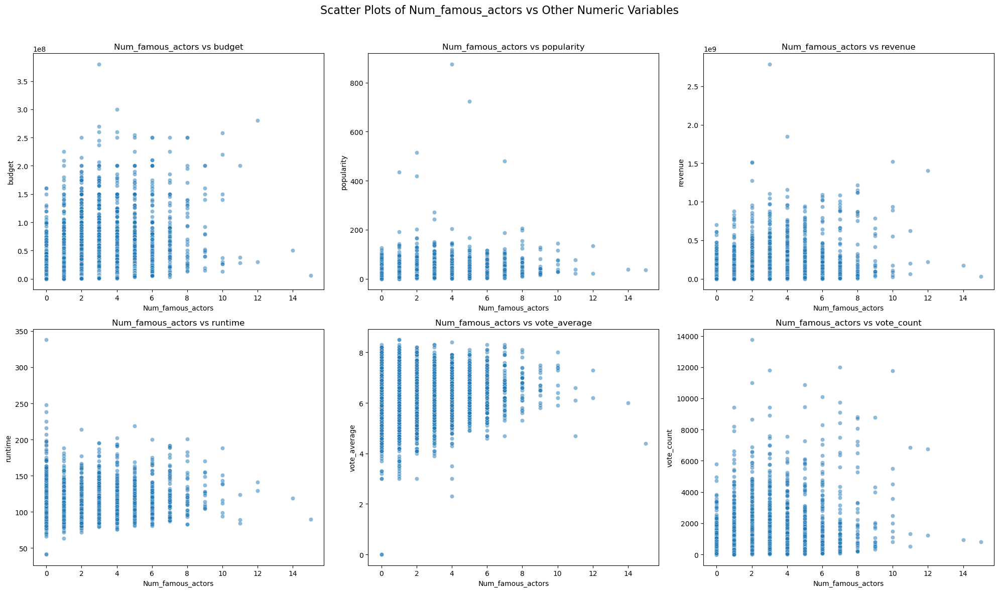

In [195]:
numerics = test_merged_df.select_dtypes(include=['float64', 'int64'])
numerics = numerics.drop(columns=['id'])

for _ in numerics:
    make_scatterplot_array(numerics, _, test_merged_df)



these scatterplots make sense to me as of right now, as the "outliers" that appear were accounted for earlier

### Measure x Category

In [196]:
# code for making multiple boxplots

def make_boxplot_array(boxplot_cats, measure, data, limit=10, dims=(2, 3)):
    temp = data[boxplot_cats] 

    fig, axes = plt.subplots(dims[0], dims[1], figsize=(24, 30))
    fig.suptitle(f"Box Plots of {measure.capitalize()} vs Categorical Variables", fontsize=16)
    for ax, cat_col in zip(axes.flatten(), temp.columns):
        if cat_col != measure:
            sns.boxplot(data=data, x=cat_col, y=measure, order=data[cat_col].value_counts().index[:limit], ax=ax)
            ax.set_title(f"{measure.capitalize()} vs {cat_col}", fontsize=12)
            ax.set_xlabel(cat_col, fontsize=10)
            ax.set_ylabel(measure.capitalize(), fontsize=10)
            ax.tick_params(axis='x', rotation=45)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


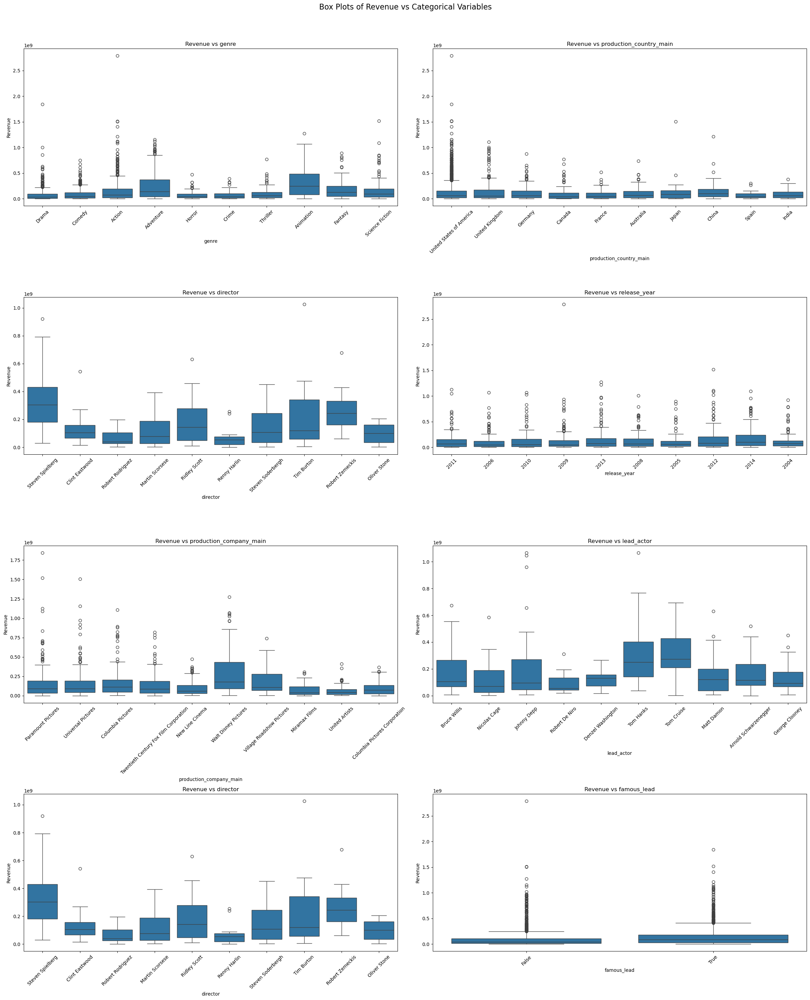

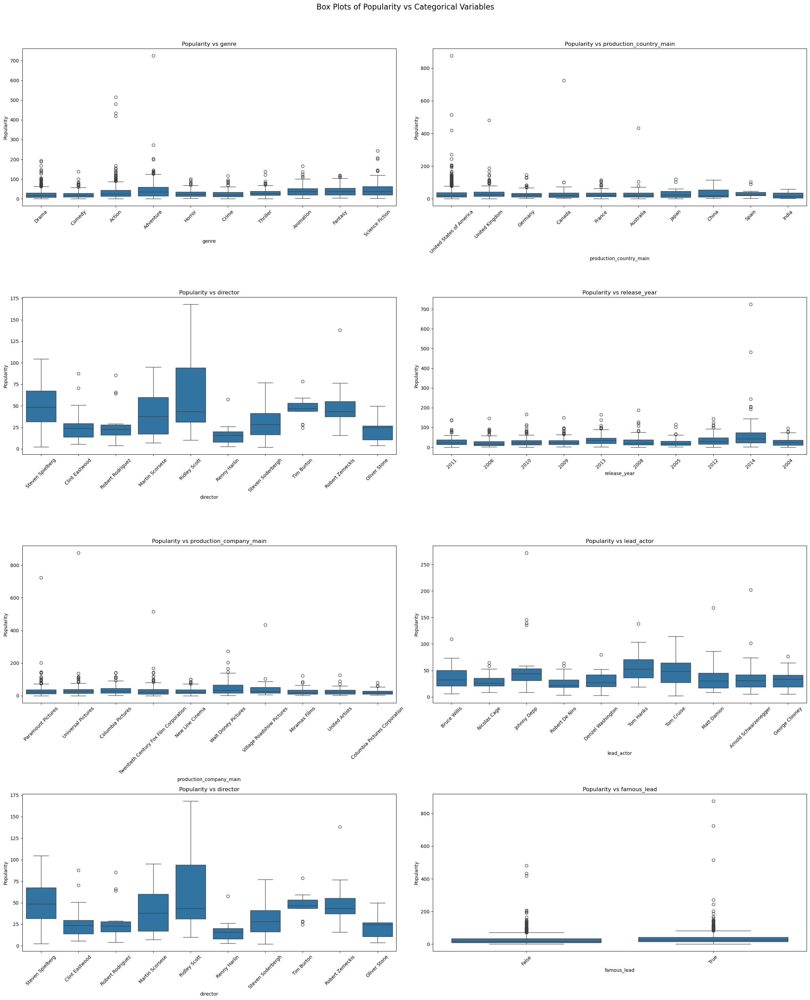

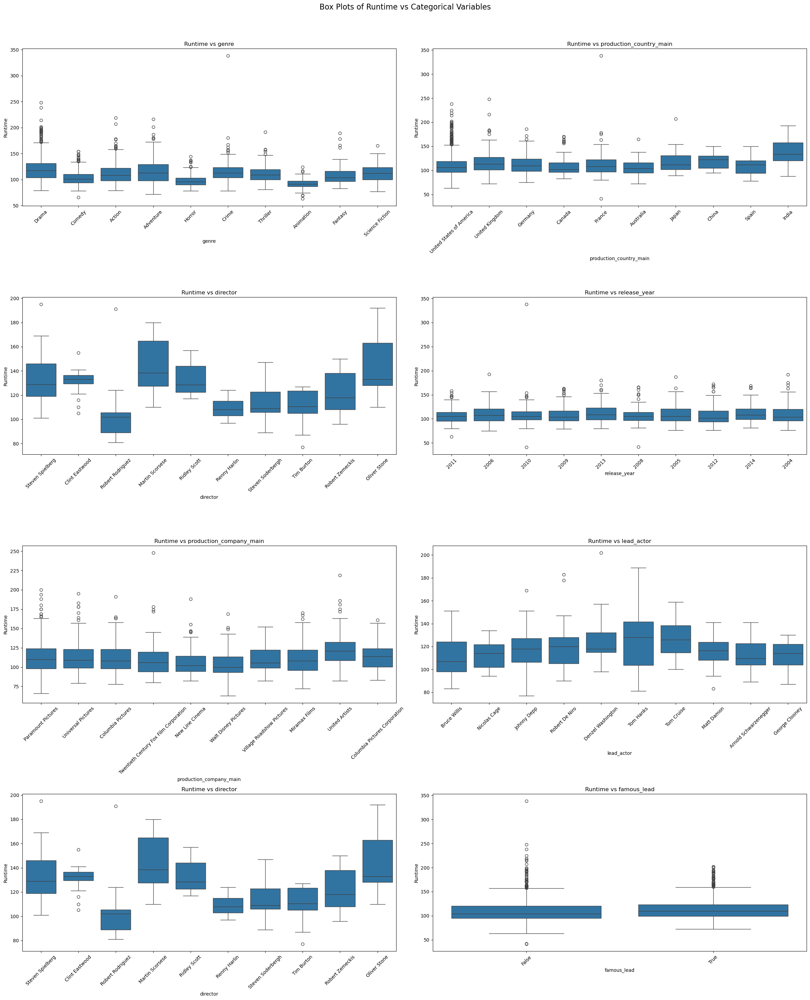

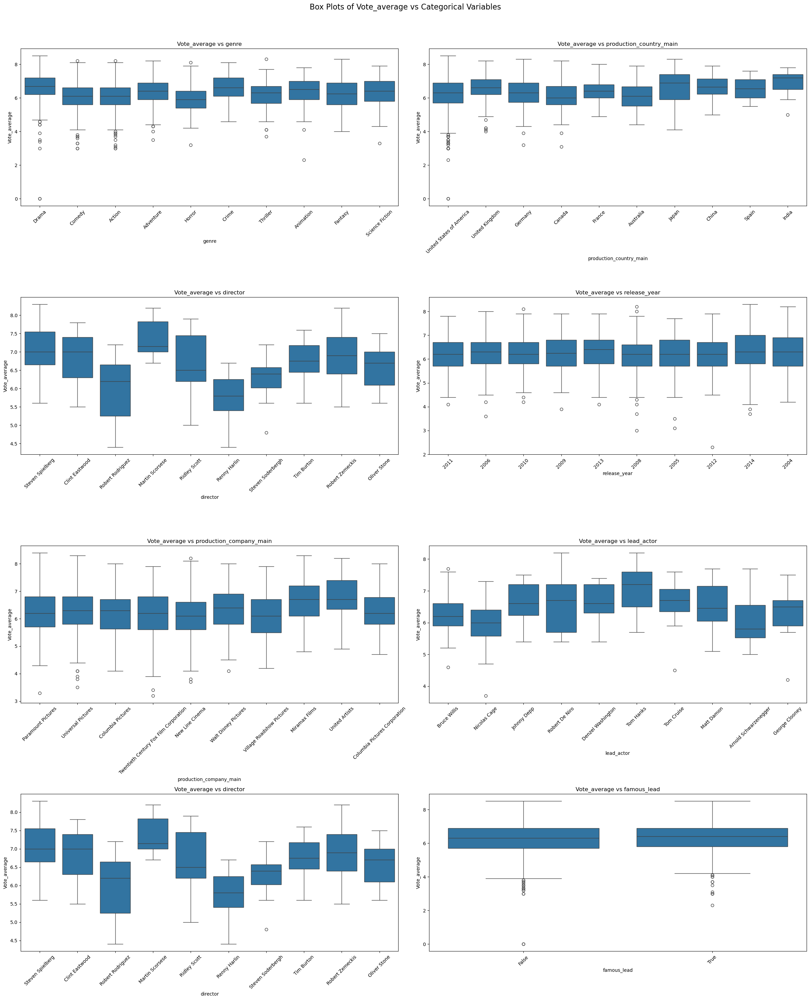

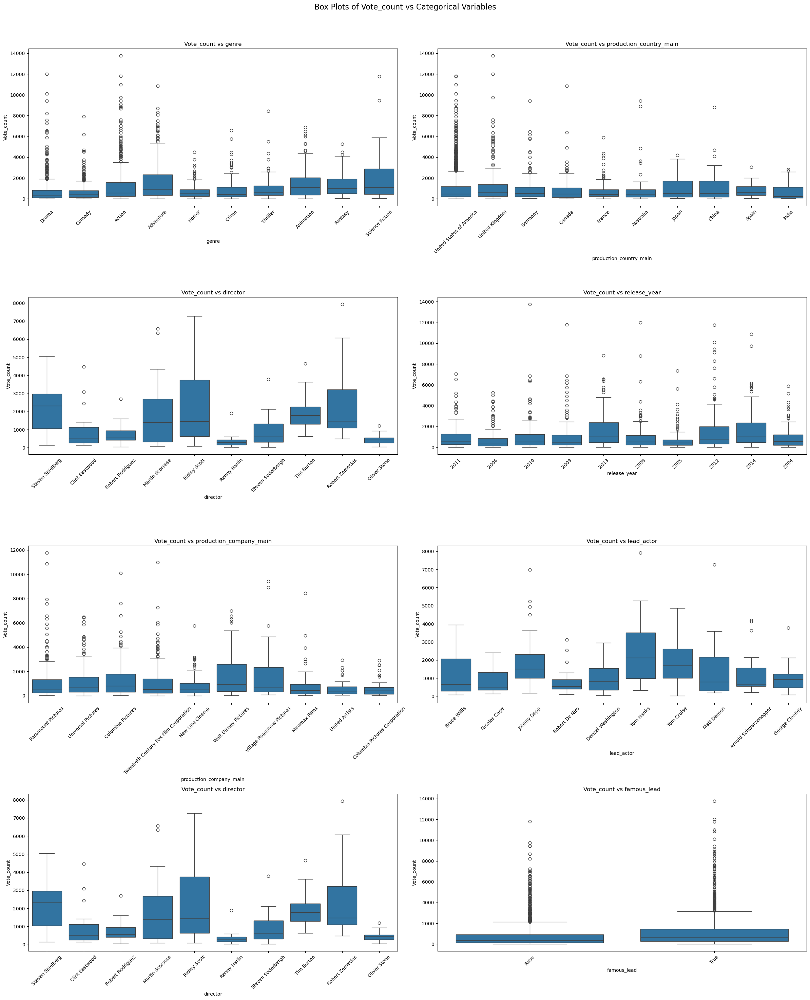

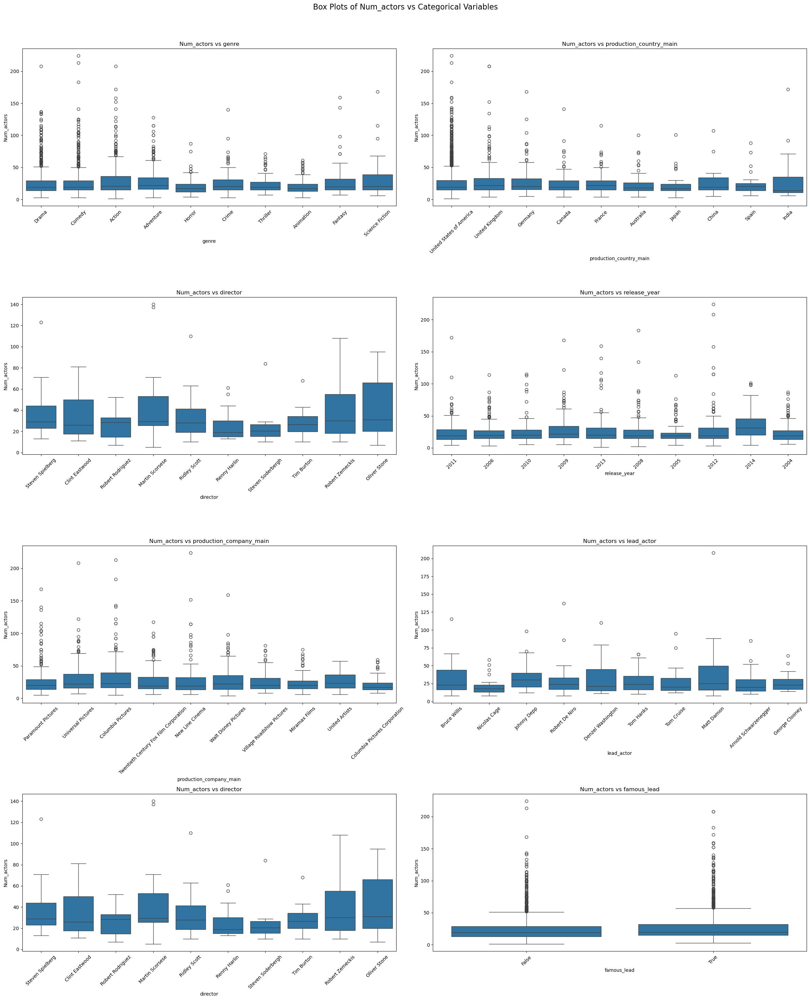

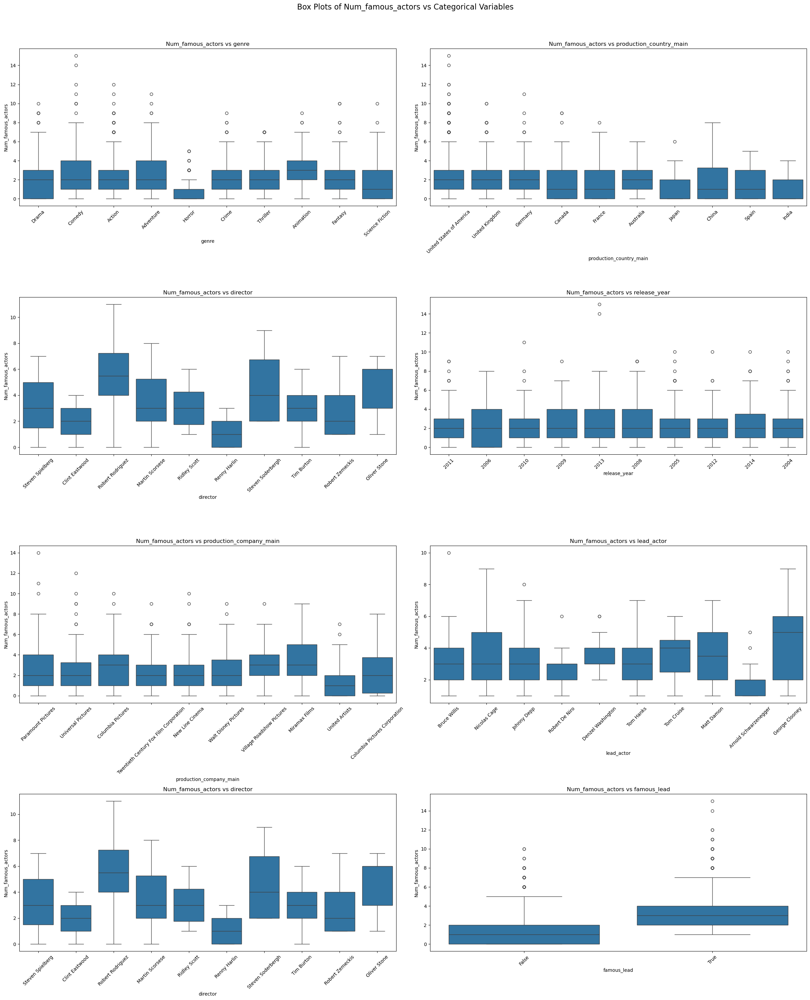

In [197]:
boxplot_categories = ['genre', 'production_country_main', 'director', 'release_year', 'production_company_main', 'lead_actor', 'director', 
                     'famous_lead']

'''make_boxplot_array(boxplot_categories, 'budget', test_merged_df, dims=(4, 2))
'''
boxplot_measures = ['revenue', 'popularity', 'runtime', 'vote_average', 'vote_count', 'num_actors', 'num_famous_actors']

for measure in boxplot_measures:
    make_boxplot_array(boxplot_categories, measure, test_merged_df, dims=(4, 2))

### Category x Category

In [198]:
# stacked bar chart

stacked_bar_categories = ['production_company_main', 'genre', 'release_year', 'lead_actor']

Just doing between the boolean variables becasue thats the only categories that have a number of possibile values that fit making stacked bar charts

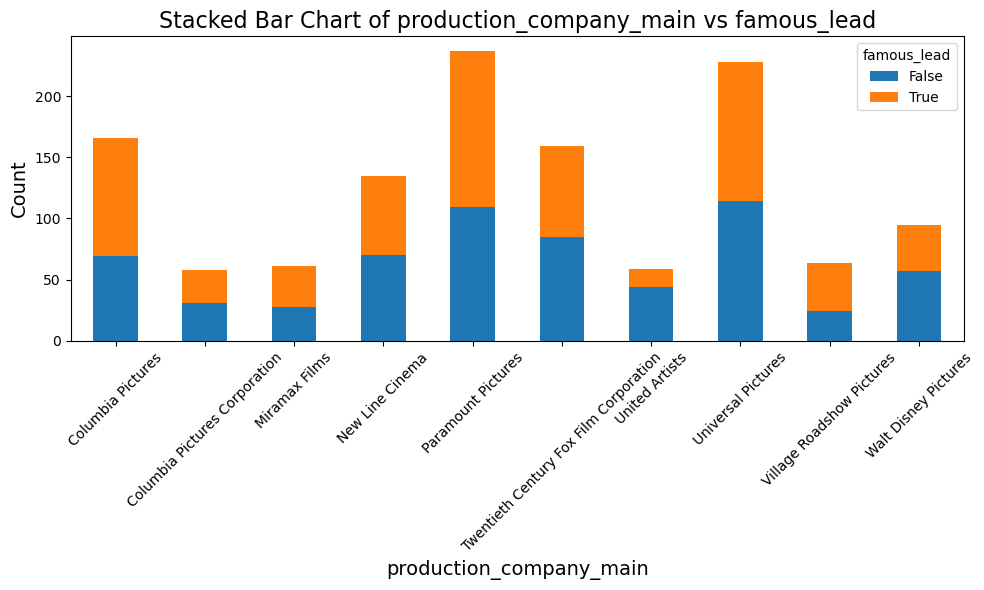

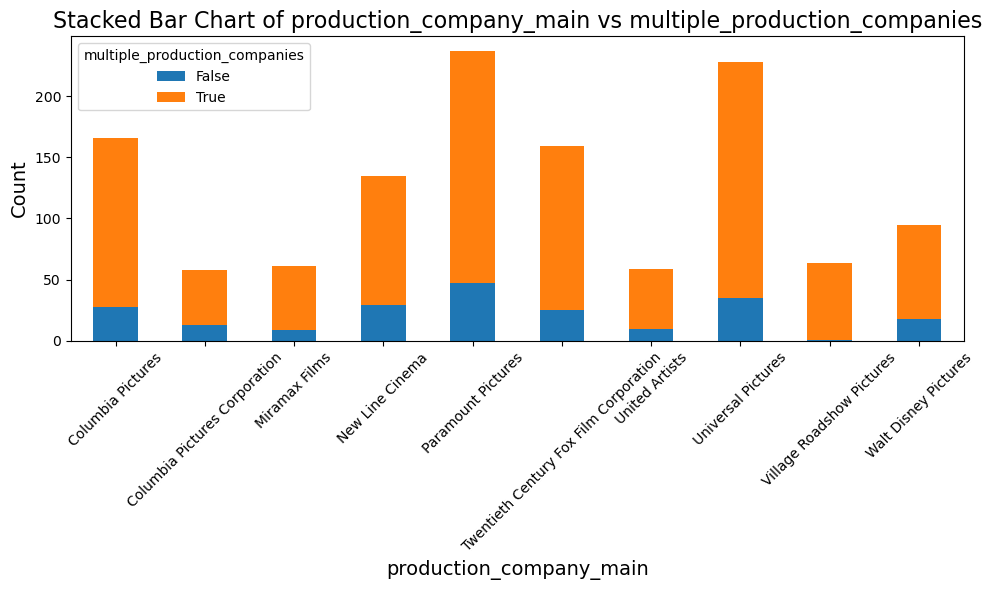

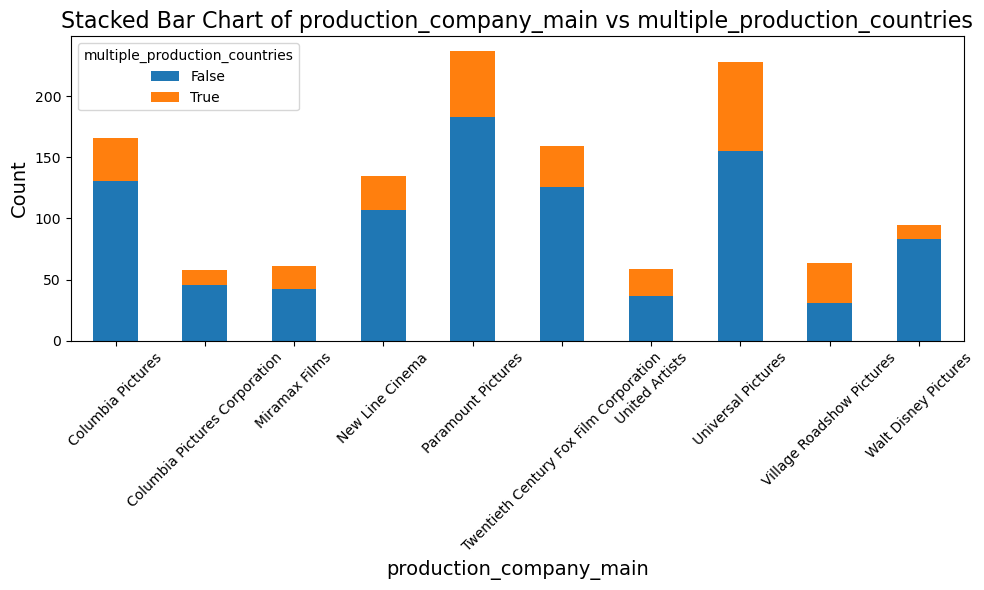

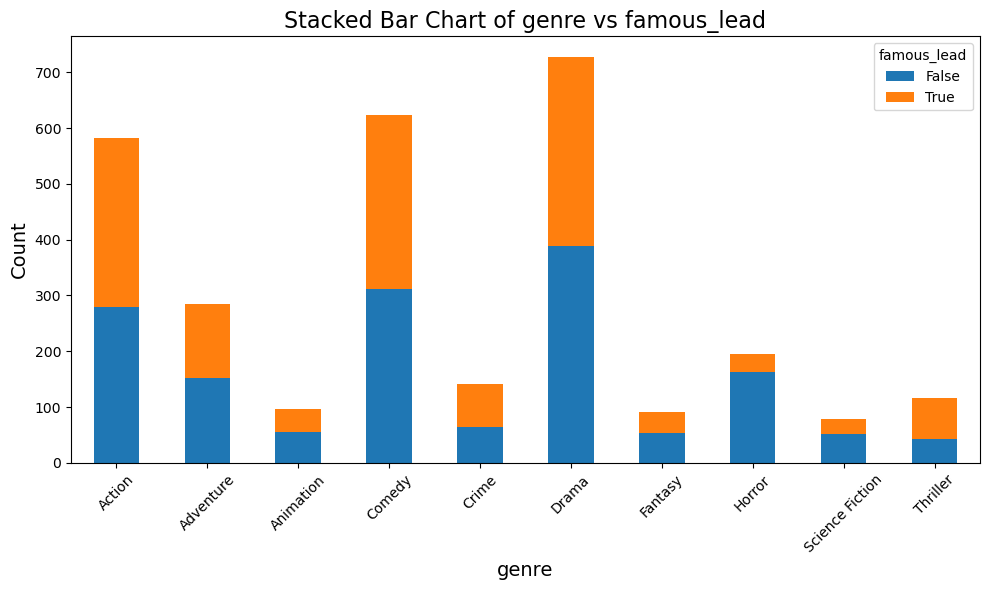

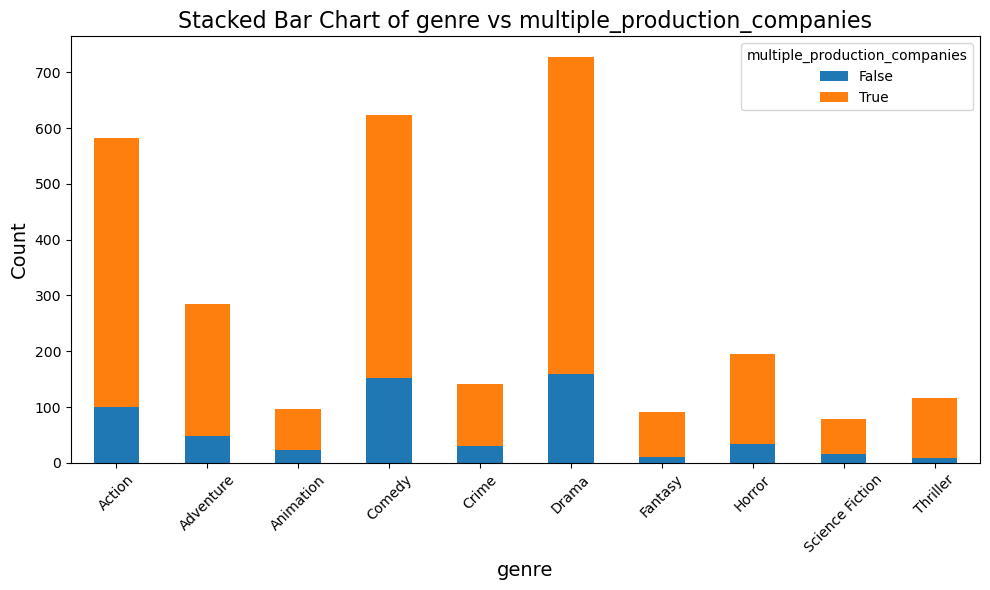

...

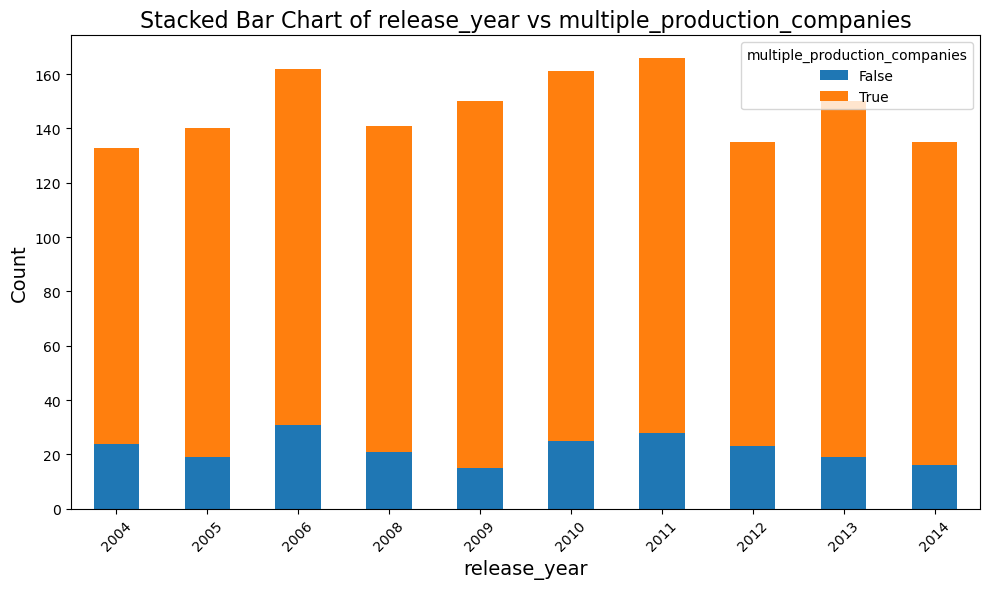

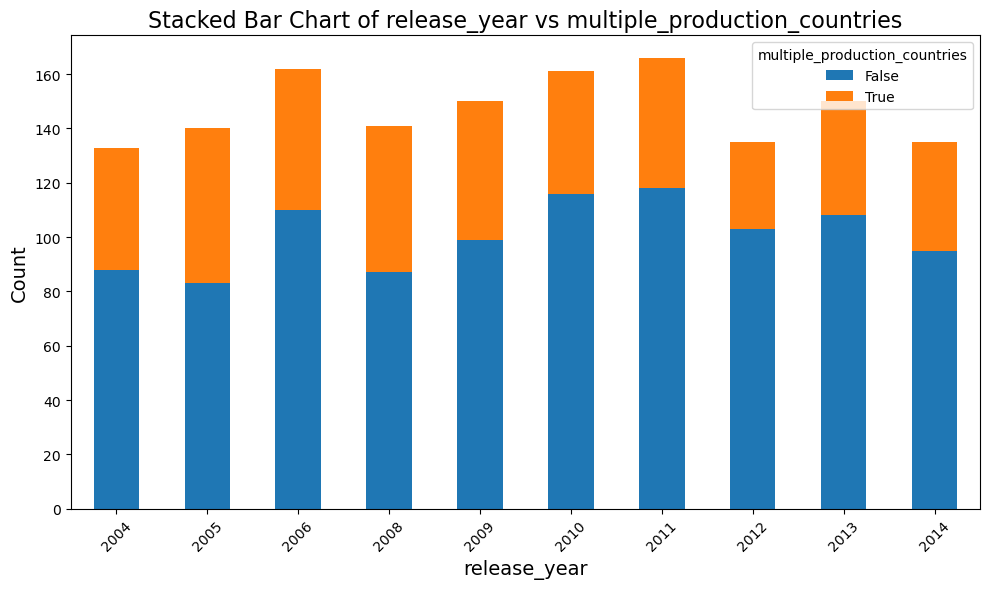

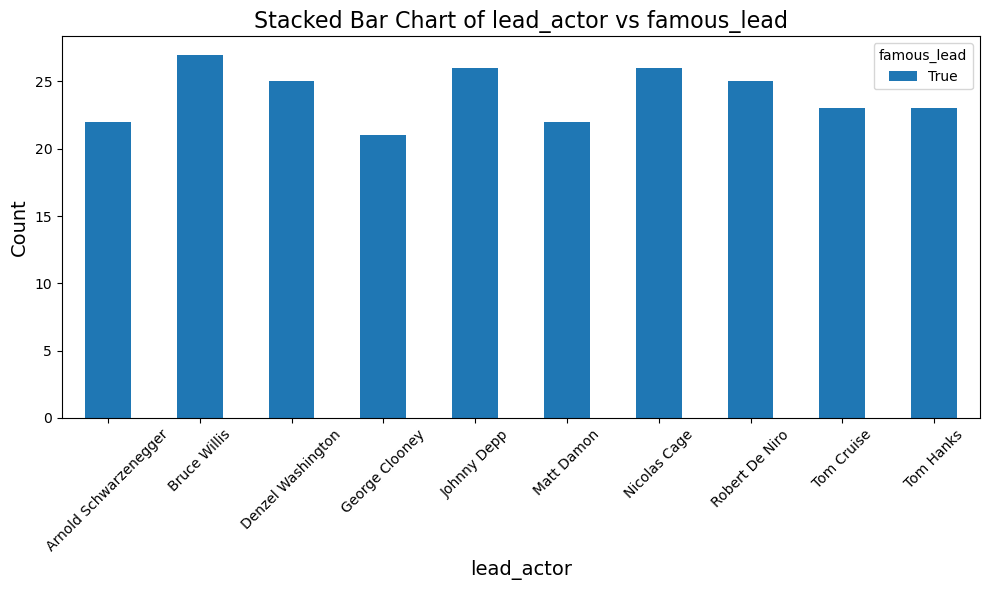

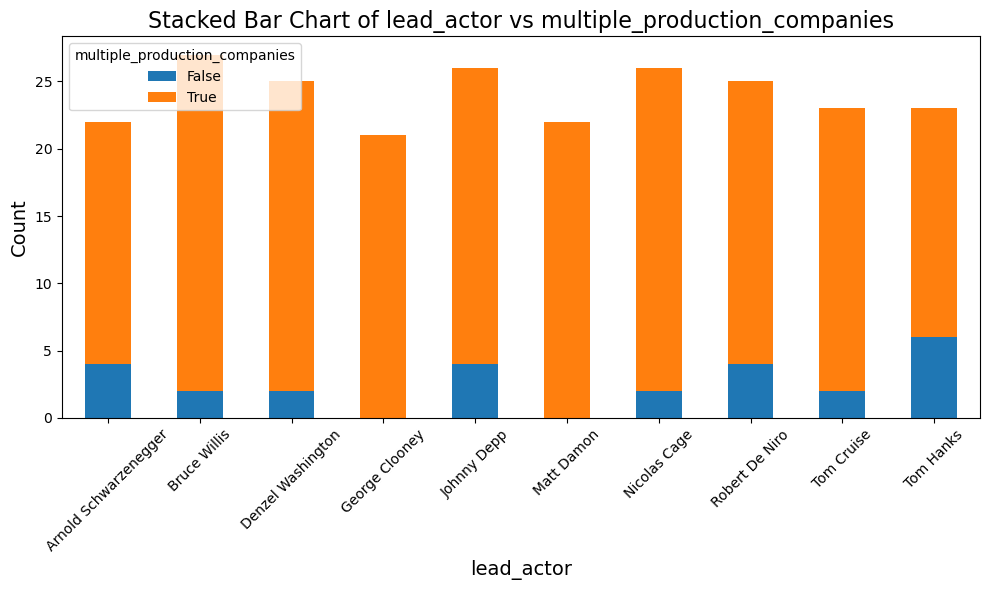

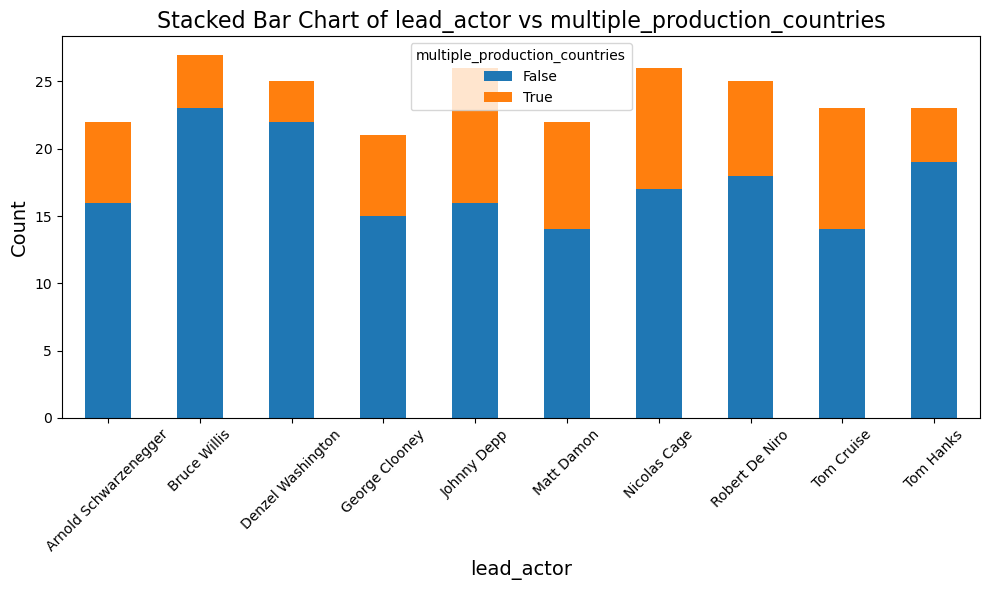

In [199]:

def make_stacked_bar_chart(cat_col, bool_col, data, limit=10):
    temp = data[[cat_col, bool_col]]
    temp = temp[temp[cat_col].isin(temp[cat_col].value_counts().index[:limit])]
    cross_tab = pd.crosstab(temp[cat_col], temp[bool_col])
    cross_tab.plot(kind='bar', stacked=True, figsize=(10, 6))
    plt.title(f"Stacked Bar Chart of {cat_col} vs {bool_col}", fontsize=16)
    plt.xlabel(cat_col, fontsize=14)
    plt.ylabel("Count", fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
for cat in stacked_bar_categories:
    make_stacked_bar_chart(cat, 'famous_lead', test_merged_df)
    make_stacked_bar_chart(cat, 'multiple_production_companies', test_merged_df)
    make_stacked_bar_chart(cat, 'multiple_production_countries', test_merged_df) 

## Multivariate Visualizations

Features (Organized): ( FOR MY REFERENCE SO I DONT HAVE TO SCROLL FOR 1 MINUTE)

    budget - Continuous Ratio
    popularity - Continuous Ratio
    revenue - Continuous Ratio
    runtime - Continuous Ratio
    vote_average - Continuous Ratio
    vote_count - Continuous Ratio
    num_famous_actors - Discrete Ratio
    num_actors - Discrete Ratio

    id - Nominal Category
    original_language - Nominal Category
    original_title - Nominal Category
    production_company_main - Nominal Category
    production_country_main - Nominal Category
    lead_actor - Nominal Category
    director - Nominal Category
    genre - Nominal Category    
    title - Nominal Category
    release_date - Ordinal Category
    release_year - Ordinal Category

    famous_lead - Boolean 
    multiple_production_companies - Boolean
    multiple_production_countries - Boolean

again have the issue of many columns having a significant number of possible values but will do what I am able

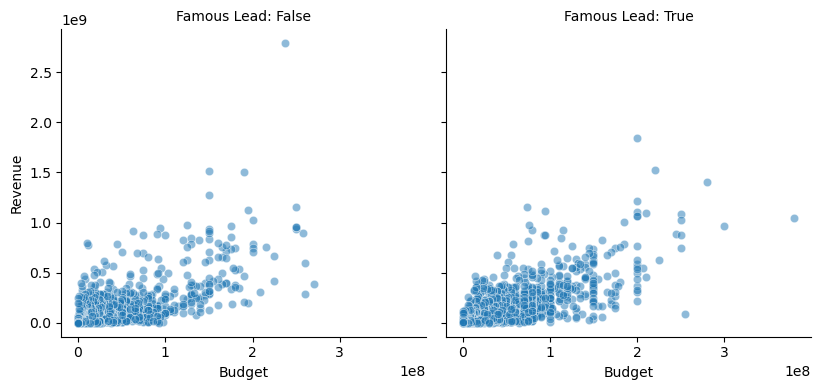

In [200]:
# faceted scatterplots

# budget vs revenue vs famous_lead
g = sns.FacetGrid(test_merged_df, col="famous_lead", col_wrap=4, height=4)
g.map(sns.scatterplot, "budget", "revenue", alpha=0.5)
g.set_titles("Famous Lead: {col_name}")
g.set_axis_labels("Budget", "Revenue")

g.tight_layout()
plt.show()


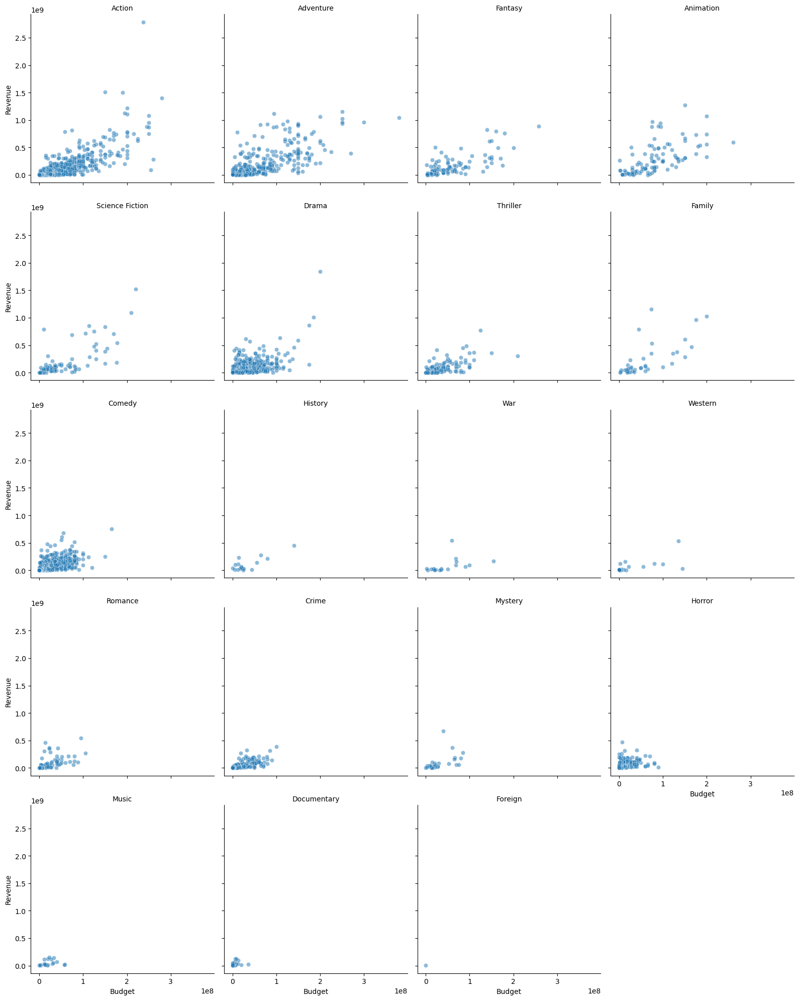

In [201]:
# budget vs revenue vs genre
g = sns.FacetGrid(test_merged_df, col="genre", col_wrap=4, height=4)
g.map(sns.scatterplot, "budget", "revenue", alpha=0.5)
g.set_titles("{col_name}")
g.set_axis_labels("Budget", "Revenue")
g.tight_layout()
plt.show()

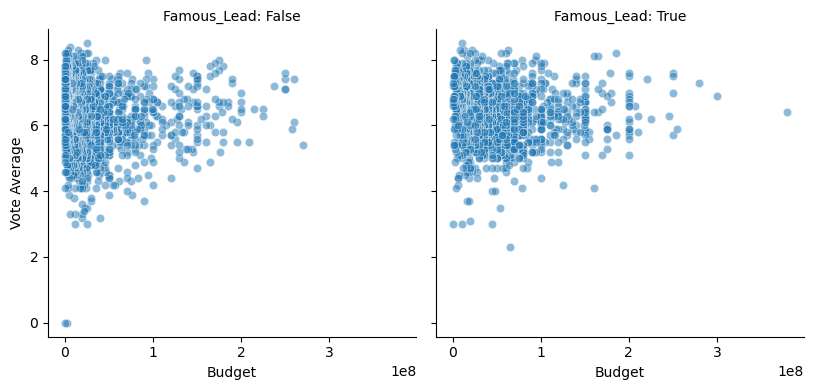

In [202]:
# budget vs vote_average vs famous_lead
g = sns.FacetGrid(test_merged_df, col="famous_lead", col_wrap=4, height=4)
g.map(sns.scatterplot, "budget", "vote_average", alpha=0.5)
g.set_titles("Famous_Lead: {col_name}")
g.set_axis_labels("Budget", "Vote Average")
g.tight_layout()
plt.show()

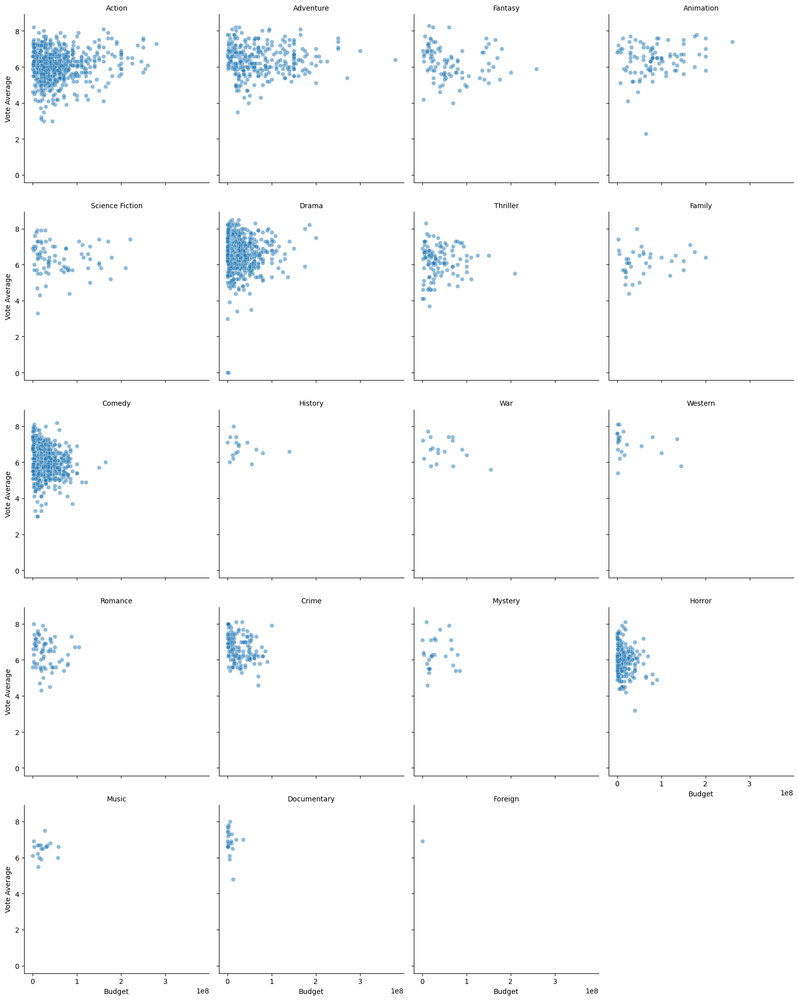

In [203]:
# budget vs vote_average vs genre
g = sns.FacetGrid(test_merged_df, col="genre", col_wrap=4, height=4)
g.map(sns.scatterplot, "budget", "vote_average", alpha=0.5)
g.set_titles("{col_name}")
g.set_axis_labels("Budget", "Vote Average")
g.tight_layout()
plt.show()

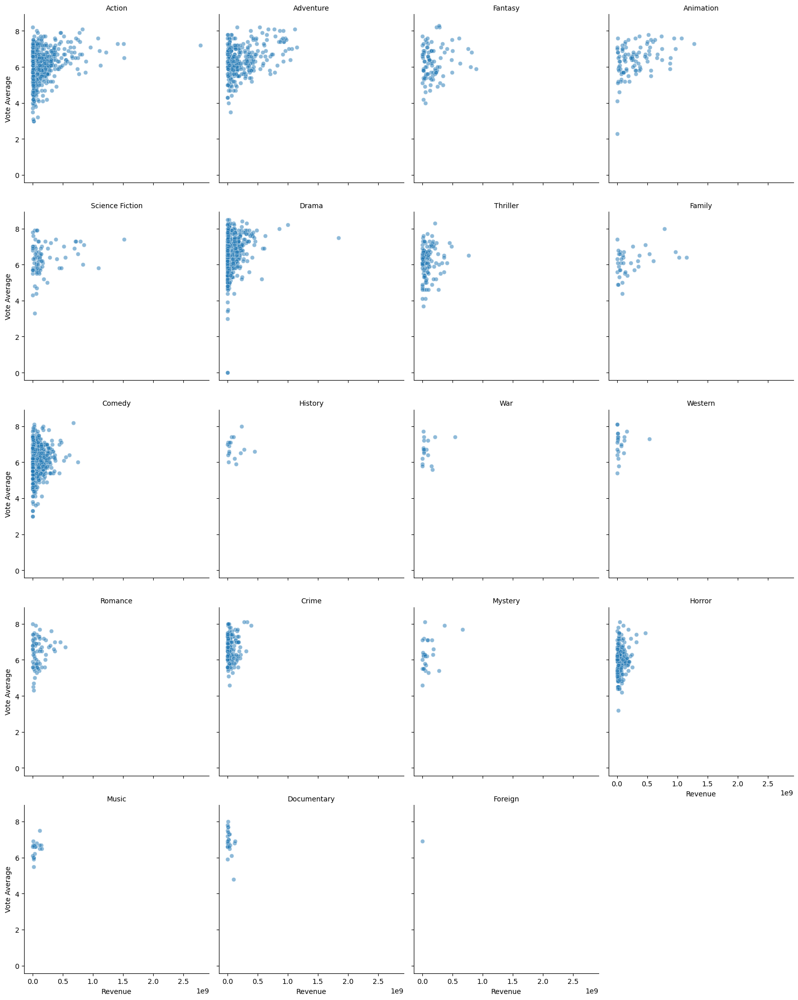

In [204]:
# revenue vs vote_average vs genre
g = sns.FacetGrid(test_merged_df, col="genre", col_wrap=4, height=4)
g.map(sns.scatterplot, "revenue", "vote_average", alpha=0.5)
g.set_titles("{col_name}")
g.set_axis_labels("Revenue", "Vote Average")
g.tight_layout()
plt.show()

### Multivariate Diagnostics

In [205]:
# Mahalanobis Distance

from scipy.stats import chi2

# Select numerical columns from the DataFrame
numerical_data = test_merged_df.select_dtypes(include=['float64', 'int64']).drop(columns=['id'])
numerical_columns = numerical_data.columns

# Drop rows with missing values (if any)
numerical_data = numerical_data.dropna()

# Compute mean vector and covariance matrix
mean_vector = numerical_data.mean().values
covariance_matrix = np.cov(numerical_data, rowvar=False)
inv_covariance_matrix = np.linalg.inv(covariance_matrix)

# Function to calculate Mahalanobis distance
def mahalanobis_distance(x, mean_vector, inv_cov_matrix):
    diff = x - mean_vector
    md = np.sqrt(diff.T @ inv_cov_matrix @ diff)
    return md

# Calculate Mahalanobis distance for each row
numerical_data['Mahalanobis_Distance'] = numerical_data.apply(
    lambda row: mahalanobis_distance(row.values, mean_vector, inv_covariance_matrix), axis=1
)

# Determine the threshold (using chi-squared distribution)
alpha = 0.01  # Significance level
threshold = chi2.ppf(1 - alpha, df=len(numerical_columns))

# Flag outliers
numerical_data['Outlier'] = numerical_data['Mahalanobis_Distance'] > threshold

# Merge results with original DataFrame
movies_with_outliers = test_merged_df.copy()
movies_with_outliers['Mahalanobis_Distance'] = numerical_data['Mahalanobis_Distance']
movies_with_outliers['Outlier'] = numerical_data['Outlier']

movies_with_outliers['Outlier'].value_counts()

Outlier
False    3172
True        2
Name: count, dtype: int64

In [206]:
movies_with_outliers[movies_with_outliers['Outlier'] == True]

,budget,id,original_language,original_title,popularity,release_date,revenue,runtime,title,vote_average,...,lead_actor,num_famous_actors,famous_lead,production_company_main,multiple_production_companies,production_country_main,multiple_production_countries,release_year,Mahalanobis_Distance,Outlier
95,165000000,157336,en,Interstellar,724.247784,2014-11-05,675120017,169.0,Interstellar,8.1,...,Matthew McConaughey,5,True,Paramount Pictures,True,Canada,True,2014,23.022854,True
546,74000000,211672,en,Minions,875.581305,2015-06-17,1156730962,91.0,Minions,6.4,...,Sandra Bullock,4,True,Universal Pictures,True,United States of America,False,2015,32.842636,True


Both interesting movies to be declared as outliers, and in some ways make sense, but I do not believe they are anomalies.

In [207]:
# variance inflation factor

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

numeric_data_clean = test_merged_df.select_dtypes(include=['float64', 'int64']).drop(columns=['id'])
numerical_data = numeric_data_clean.dropna()
# Add a constant column for the intercept in VIF calculation
numerical_data_with_const = add_constant(numerical_data)

# Calculate VIF for each variable
vif_data = pd.DataFrame()
vif_data["Variable"] = numerical_data_with_const.columns
vif_data["VIF"] = [variance_inflation_factor(numerical_data_with_const.values, i)
                   for i in range(numerical_data_with_const.shape[1])]

vif_data


,Variable,VIF
0,const,74.206056
1,budget,2.360788
2,popularity,2.282817
3,revenue,3.289296
4,runtime,1.308723
5,vote_average,1.503463
6,vote_count,3.896475
7,num_actors,1.267374
8,num_famous_actors,1.251970


None of the VIFs are high enough to indicate multicollinearity, but vote_count is high enough (and correlated with popularity from former visualizations)
that it might be worth removing.

### Post-Analysis Cleanup

In [208]:
test_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3174 entries, 0 to 4768
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   budget                         3174 non-null   int64         
 1   id                             3174 non-null   int64         
 2   original_language              3174 non-null   object        
 3   original_title                 3174 non-null   object        
 4   popularity                     3174 non-null   float64       
 5   release_date                   3174 non-null   datetime64[ns]
 6   revenue                        3174 non-null   int64         
 7   runtime                        3174 non-null   float64       
 8   title                          3174 non-null   object        
 9   vote_average                   3174 non-null   float64       
 10  vote_count                     3174 non-null   int64         
 11  director              

In [209]:
# rename vote_average for clarity
test_merged_df = test_merged_df.rename(columns={'vote_average': 'avg_user_score', 'vote_count': 'num_votes'})

# rename to "has_famous_lead"

test_merged_df = test_merged_df.rename(columns={'famous_lead': 'has_famous_lead'})

# same to others

test_merged_df = test_merged_df.rename(columns={'multiple_production_companies': 'has_multiple_production_companies',
                                            'multiple_production_countries': 'has_multiple_production_countries'})

test_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3174 entries, 0 to 4768
Data columns (total 22 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   budget                             3174 non-null   int64         
 1   id                                 3174 non-null   int64         
 2   original_language                  3174 non-null   object        
 3   original_title                     3174 non-null   object        
 4   popularity                         3174 non-null   float64       
 5   release_date                       3174 non-null   datetime64[ns]
 6   revenue                            3174 non-null   int64         
 7   runtime                            3174 non-null   float64       
 8   title                              3174 non-null   object        
 9   avg_user_score                     3174 non-null   float64       
 10  num_votes                          3174 n

next steps to take:
make a "release_season" feature
make a revenue/budget adjusted for inflation feature
make a decade feature

In [210]:
iter_movies_df = test_merged_df.copy() #make a new copy

# add season
iter_movies_df['season_releaed'] = iter_movies_df['release_date'].dt.month % 12 // 3 + 1
iter_movies_df['season_releaed'] = iter_movies_df['season_releaed'].map({1: 'Winter', 2: 'Spring', 3: 'Summer', 4: 'Fall'})
iter_movies_df[['release_date', 'season_releaed']].head()

,release_date,season_releaed
0,2009-12-10,Winter
1,2007-05-19,Spring
2,2015-10-26,Fall
3,2012-07-16,Summer
4,2012-03-07,Spring


In [211]:
# add decade

iter_movies_df['decade_released'] = (iter_movies_df['release_year'] // 10) * 10
iter_movies_df[['release_year', 'decade_released']].head()

,release_year,decade_released
0,2009,2000
1,2007,2000
2,2015,2010
3,2012,2010
4,2012,2010


In [212]:
# add inflation adjusted feature

# get cpi data
cpi_df = pd.read_csv('../data/CPIAUCSL.csv')
cpi_df['DATE'] = pd.to_datetime(cpi_df['observation_date'])
cpi_df = cpi_df.rename(columns={'DATE': 'date', 'CPIAUCSL': 'cpi'})
cpi_df['year'] = cpi_df['date'].dt.year
cpi_df = cpi_df.groupby('year')['cpi'].mean().reset_index()


# scale features to ratio of 2024 cpi/year released cpi
iter_movies_df['2024_adjusted_budget'] = iter_movies_df.apply(
    lambda row: row['budget'] * (cpi_df[cpi_df['year'] == 2024]['cpi'].values[0] / cpi_df[cpi_df['year'] == row['release_year']]['cpi'].values[0])
    if row['release_year'] in cpi_df['year'].values else np.nan, axis=1
)
iter_movies_df['2024_adjusted_revenue'] = iter_movies_df.apply(
    lambda row: row['revenue'] * (cpi_df[cpi_df['year'] == 2024]['cpi'].values[0] / cpi_df[cpi_df['year'] == row['release_year']]['cpi'].values[0])
    if row['release_year'] in cpi_df['year'].values else np.nan, axis=1
)

#round new rev and budget to no decimals to maintain unity with the originals
iter_movies_df['2024_adjusted_budget'] = iter_movies_df['2024_adjusted_budget'].round(0)
iter_movies_df['2024_adjusted_revenue'] = iter_movies_df['2024_adjusted_revenue'].round(0)
iter_movies_df['2024_adjusted_budget'] = iter_movies_df['2024_adjusted_budget'].astype('Int64')
iter_movies_df['2024_adjusted_revenue'] = iter_movies_df['2024_adjusted_revenue'].astype('Int64')


In [213]:
iter_movies_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3174 entries, 0 to 4768
Data columns (total 26 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   budget                             3174 non-null   int64         
 1   id                                 3174 non-null   int64         
 2   original_language                  3174 non-null   object        
 3   original_title                     3174 non-null   object        
 4   popularity                         3174 non-null   float64       
 5   release_date                       3174 non-null   datetime64[ns]
 6   revenue                            3174 non-null   int64         
 7   runtime                            3174 non-null   float64       
 8   title                              3174 non-null   object        
 9   avg_user_score                     3174 non-null   float64       
 10  num_votes                          3174 n

In [220]:
#summary stats for final dataset

#split features to make easier to read

half_1 = iter_movies_df.columns[:13]
half_2 = iter_movies_df.columns[13:26]

summary_1 = iter_movies_df[half_1].describe()
summary_2 = iter_movies_df[half_2].describe()

summary_1

,budget,id,popularity,release_date,revenue,runtime,avg_user_score,num_votes
count,3.174000e+03,3174.000000,3174.000000,3174,3.174000e+03,3174.000000,3174.000000,3174.000000
mean,4.129071e+07,44883.733144,29.475862,2002-04-01 19:41:51.153119104,1.232553e+08,110.897290,6.312161,993.340895
min,7.000000e+03,5.000000,0.037073,1916-09-04 00:00:00,7.000000e+00,41.000000,0.000000,0.000000
25%,1.100000e+07,4871.250000,10.926848,1998-08-20 06:00:00,1.786998e+07,97.000000,5.800000,190.000000
50%,2.600000e+07,11357.500000,20.801659,2005-08-04 12:00:00,5.722771e+07,107.000000,6.300000,485.000000
75%,5.500000e+07,44944.500000,37.764689,2010-11-29 06:00:00,1.491741e+08,121.000000,6.900000,1168.750000
max,3.800000e+08,417859.000000,875.581305,2016-09-09 00:00:00,2.787965e+09,338.000000,8.500000,13752.000000
std,4.450746e+07,75070.163522,36.314834,NaN,1.872728e+08,20.966473,0.869925,1421.112279


In [221]:
summary_2

,num_actors,num_famous_actors,release_year,decade_released,2024_adjusted_budget,2024_adjusted_revenue
count,3174.000000,3174.000000,3174.000000,3174.000000,3143.0,3143.0
mean,26.281664,2.204159,2001.712350,1997.375551,69455054.035317,219199349.603882
std,21.558386,2.038837,13.243916,13.659660,67250620.445985,326163763.411103
min,1.000000,0.000000,1916.000000,1910.000000,11158.0,13.0
25%,15.000000,1.000000,1998.000000,1990.000000,21896050.5,34841355.5
50%,19.000000,2.000000,2005.000000,2000.000000,47768488.0,105590220.0
75%,30.000000,3.000000,2010.000000,2010.000000,96390594.0,261755021.0
max,224.000000,15.000000,2016.000000,2010.000000,529982157.0,4076060708.0


In [225]:
#non numeric summaries

measure_summary = iter_movies_df.select_dtypes(include=['object', 'bool', 'datetime64']).describe(include='all')
measure_summary
measure_summary.T



,count,unique,top,freq,mean,min,25%,50%,75%,max
original_language,3174,25,en,3053,NaN,NaN,NaN,NaN,NaN,NaN
original_title,3174,3174,Avatar,1,NaN,NaN,NaN,NaN,NaN,NaN
release_date,3174,NaN,NaN,NaN,2002-04-01 19:41:51.153119104,1916-09-04 00:00:00,1998-08-20 06:00:00,2005-08-04 12:00:00,2010-11-29 06:00:00,2016-09-09 00:00:00
title,3174,3173,The Host,2,NaN,NaN,NaN,NaN,NaN,NaN
director,3174,1410,Steven Spielberg,27,NaN,NaN,NaN,NaN,NaN,NaN
genre,3174,19,Drama,728,NaN,NaN,NaN,NaN,NaN,NaN
lead_actor,3174,1266,Bruce Willis,27,NaN,NaN,NaN,NaN,NaN,NaN
has_famous_lead,3174,2,False,1703,NaN,NaN,NaN,NaN,NaN,NaN
production_company_main,3174,748,Paramount Pictures,237,NaN,NaN,NaN,NaN,NaN,NaN
has_multiple_production_companies,3174,2,True,2540,NaN,NaN,NaN,NaN,NaN,NaN


In [215]:
# export to csv

iter_movies_df.to_csv('../output/processed_movies_dataset.csv', index=False)